In [1]:
from tifffile import imread
import tifffile as tiff
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage
import pandas as pd
from scipy import stats

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

%run utils_metadata.ipynb
%run utils_contours.ipynb
%run utils_if.ipynb

# Max Projection to Merge bundle image to Neurons

In [158]:
root="/Users/eminhanozil/Yanik Lab Dropbox/Eminhan Özil/Localization Manuscript 2024/RAT DATA/rEO_10/histology/4x-Tiff"

filenames = [f.split("- C=")[0] for f in os.listdir(root) if os.path.isfile(os.path.join(root, f))]


In [159]:
# Crisp Blue: RGB(0, 121, 184)
# Vibrant Orange: RGB(255, 87, 34)
# Bright Green: RGB(76, 175, 80)
# Rich Purple: RGB(156, 39, 176)

colorpalette =[[0, 121, 184],
                [255, 87, 34],
                [76, 175, 80],
                [156, 39, 176]
                ]

In [162]:
np.unique(filenames)

array(['_rEOZ010_s4_n1_4x_C561, C488, C640_20250224_01.vsi - _rEOZ010_s4_n1_4x_C561, C488, C640_20250224_01.vsi #3 ',
       '_rEOZ010_s4_n2_4x_C561, C488, C640_20250224_01.vsi - _rEOZ010_s4_n2_4x_C561, C488, C640_20250224_01.vsi #3 ',
       '_rEOZ010_s4_n3_4x_C561, C488, C640_20250224_01.vsi - _rEOZ010_s4_n3_4x_C561, C488, C640_20250224_01.vsi #3 '],
      dtype='<U107')

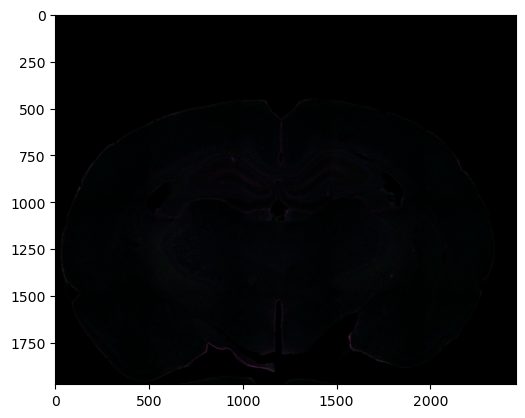

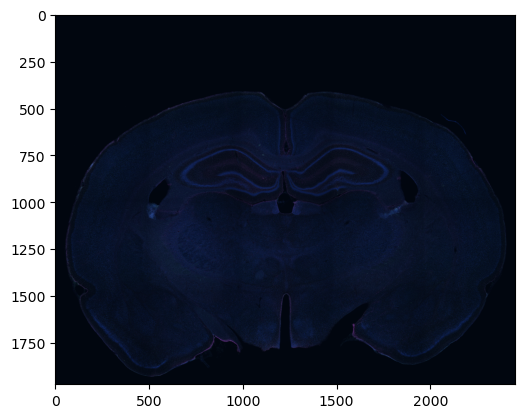

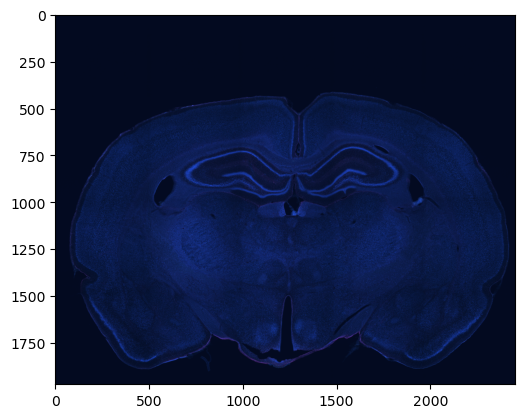

In [169]:
for f in np.unique(filenames):
    if f != '.DS_Store':
        for c in range(3):
            filename = f + "- C=" + str(c) + ".tif"
            if c==0:
                img = imread(os.path.join(root, filename))
                img = np.max(img , axis=0)
                img = ((img - np.min(img))/(np.max(img)-np.min(img)) * 255).astype('uint16')            
                imgRGB = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
                r,g,b= colorpalette[c+1]
                
                imgRGB[:,:,0]=imgRGB[:,:,0]*b/255
                imgRGB[:,:,1]=imgRGB[:,:,1]*g/255
                imgRGB[:,:,2]=imgRGB[:,:,2]*r/255
                # imgRGB[:,:,3]=imgRGB[:,:,3]*a/255
                
            else:
                imgTmp = imread(os.path.join(root, filename))
                imgTmp = np.max(imgTmp , axis=0)
                imgTmp = ((imgTmp - np.min(imgTmp))/(np.max(imgTmp)-np.min(imgTmp)) * 255).astype('uint16')            
                imgRGBTmp = cv2.cvtColor(imgTmp, cv2.COLOR_GRAY2RGB)
                r,g,b= colorpalette[c+1]
                
                imgRGBTmp[:,:,0]=imgRGBTmp[:,:,0]*b/255
                imgRGBTmp[:,:,1]=imgRGBTmp[:,:,1]*g/255
                imgRGBTmp[:,:,2]=imgRGBTmp[:,:,2]*r/255
                # imgRGBTmp[:,:,3]=imgRGBTmp[:,:,3]*a/255
                
                imgRGB = imgRGB + imgRGBTmp

        # imgRGB = imgRGB + imgRGBTmp
        imgRGB = ((imgRGB - np.min(imgRGB))/(np.max(imgRGB)-np.min(imgRGB)) * 255).astype('uint8')
        plt.imshow(imgRGB)
        plt.show()
        filename = f + "z-Max.tiff"
        cv2.imwrite(os.path.join(root, "z-Max", filename), imgRGB)

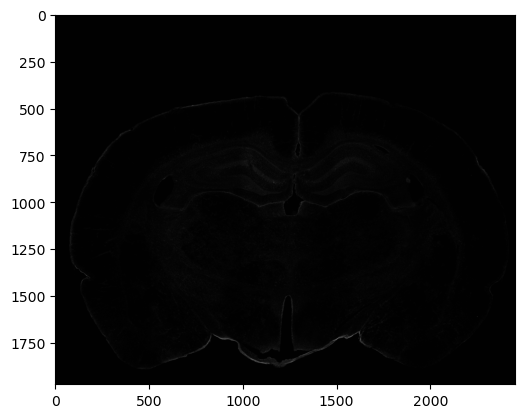

In [168]:
plt.imshow(imgTmp, cmap='gray')

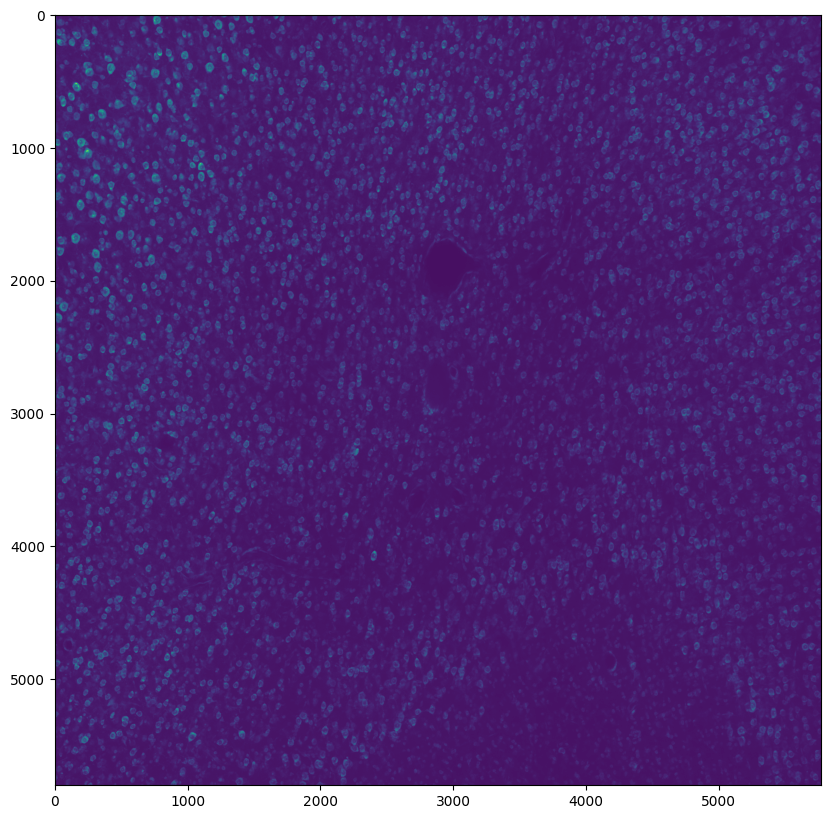

In [185]:
# filename="_rEO008_s06_n3_20x_spot4_nissl-stack.tif"

nissl_data = imread(os.path.join(root, filename))
nissl_data=np.moveaxis(nissl_data, 0, -1)
plt.figure(figsize=(10,10))
plt.imshow(nissl_data[12,:,:])

In [272]:
electrodesMaxProj=np.max(nissl_data[1:4,:,:], axis=0)
# electrodesMaxProj8Bit = (electrodesMaxProj/256).astype('uint8')
electrodesMaxProjRGBA = cv2.cvtColor(electrodesMaxProj, cv2.COLOR_GRAY2RGB)
electrodesMaxProjRGBA[:,:,0]=electrodesMaxProjRGBA[:,:,0]
electrodesMaxProjRGBA[:,:,1]=electrodesMaxProjRGBA[:,:,1]
electrodesMaxProjRGBA[:,:,2]=electrodesMaxProjRGBA[:,:,2]*30
# electrodesMaxProjRGBA[:,:,3]=(electrodesMaxProj>300)*electrodesMaxProjRGBA[:,:,3]
# cv2.imwrite(os.path.join(root, "imwrite_test.tiff"), electrodesMaxProjRGBA)

In [97]:
neuronsMaxProjRGBA = cv2.cvtColor(neuronsMaxProj, cv2.COLOR_GRAY2RGB)
neuronsMaxProjRGBA[:,:,0]=neuronsMaxProjRGBA[:,:,0]*28.55
neuronsMaxProjRGBA[:,:,1]=neuronsMaxProjRGBA[:,:,1]
neuronsMaxProjRGBA[:,:,2]=neuronsMaxProjRGBA[:,:,2]
# neuronsMaxProjRGBA[:,:,3]=(electrodesMaxProj>300)*electrodesMaxProjRGBA[:,:,3]
# cv2.imwrite(os.path.join(root, "neurons_maxProj.tiff"), neuronsMaxProjRGBA)

In [98]:
mergedRGB=electrodesMaxProjRGBA+neuronsMaxProjRGBA
cv2.imwrite(os.path.join(root, "merged_maxProj.tiff"), mergedRGB)

In [251]:
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/RAT DATA"
animal_id="rEO_08"
spot="s06_n3_20x_spot4"
workingdir=os.path.join(root, animal_id, "histology", spot)

# REVISION EXPERIMENTS

In [2]:
def get_separate_tiff_filename(filename):
    cnames = ["Nissl", "IBA1", "GFAP"]
    tiff_filenames = []
    for cname in cnames:
        filerawname = "_".join(filename.split("_")[:8])
        imgName = f"{filerawname}_C{cname}.tiff"
        tiff_filenames.append(imgName)

    return tiff_filenames

In [3]:
root="/Users/eminhanozil/Yanik Lab Dropbox/Eminhan Özil/Localization Manuscript 2024/RAT DATA"
animalid = "rEO_rYL_quad"

path20x = os.path.join(root, animalid, "histology", "20X_ZMax")
metadf = pd.read_csv(os.path.join(root, animalid, "histology", "metadata.csv"))
maskpath = os.path.join(root, animalid, "histology", "Masks")
if not os.path.exists(os.path.join(root, animalid, "histology", "Masks")):
    os.mkdir(maskpath)

_rEO_rYL_duo_s2_n2_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  46710044.0       30.653892      22.104188          1.000000
1      2    789688.0       29.300116      21.021588          0.955837
2      3    695128.0       28.799482      19.935261          0.939505
3      4    600040.0       28.177140      19.904932          0.919203
4      5    505048.0       27.944007      18.667953          0.911597
5      6    409976.0       26.459646      17.622367          0.863174
6      7    314872.0       26.666658      16.732149          0.869927
7      8    219872.0       24.236688      14.868062          0.790656
8      9    124290.0       21.130131      13.323186          0.689313
9   9999  11666981.0       12.230153      19.106497          0.398976


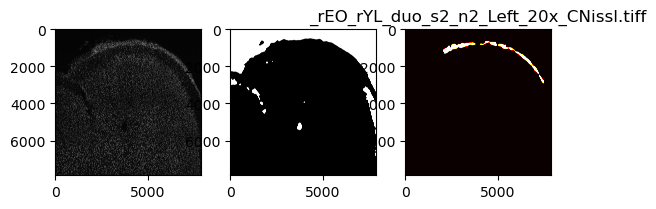

_rEO_rYL_duo_s2_n2_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52456377.0       39.333081      29.966061          1.000000
1      2    790216.0       42.528304      34.209141          1.081235
2      3    695128.0       41.491966      33.637743          1.054887
3      4    600040.0       42.071780      34.018165          1.069628
4      5    505048.0       38.779665      32.637053          0.985930
5      6    409976.0       39.975294      31.949185          1.016328
6      7    311521.0       36.205148      29.631683          0.920476
7      8    219872.0       35.942180      29.219305          0.913790
8      9    124792.0       36.009063      29.354191          0.915491
9   9999   5674337.0       23.166434      36.422618          0.588981


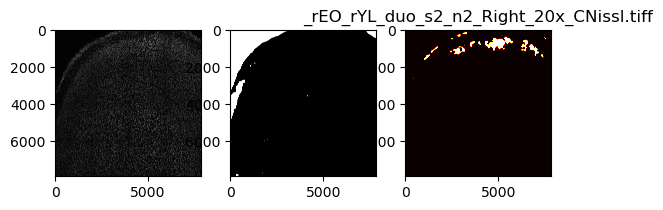

_rEO_rYL_duo_s2_n2_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  45026697.0       80.183569      90.765461          1.000000
1      2    790216.0       82.126719      92.728206          1.024234
2      3    695128.0       80.534090      93.180458          1.004371
3      4    600040.0       82.368500     105.626657          1.027249
4      5    505048.0       80.718278      95.436616          1.006669
5      6    409976.0       81.372122      94.132920          1.014823
6      7    314872.0       81.212048      93.575370          1.012827
7      8    219872.0       78.311750      95.678302          0.976656
8      9    124792.0       69.027165      53.396311          0.860864
9   9999  13344826.0      108.372582     210.210908          1.351556


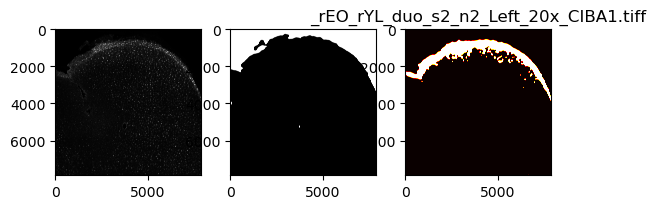

_rEO_rYL_duo_s2_n2_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49522772.0      114.446739     149.501111          1.000000
1      2    790216.0      110.375796     142.295749          0.964429
2      3    695128.0      117.136008     169.090901          1.023498
3      4    600040.0      109.765657     145.256837          0.959098
4      5    505048.0      106.313176     141.929980          0.928931
5      6    409976.0      103.226384     131.551828          0.901960
6      7    314872.0      101.625502     123.706861          0.887972
7      8    219872.0      103.937655     136.980987          0.908175
8      9    124792.0       88.361313     111.019994          0.772074
9   9999   8604591.0      195.119362     302.888420          1.704892


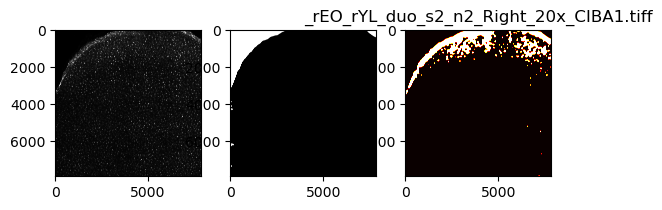

_rEO_rYL_duo_s2_n2_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54642736.0       39.112914      72.405816          1.000000
1      2    790216.0       69.796482     101.983190          1.784487
2      3    695128.0       71.530228      92.032789          1.828814
3      4    600040.0       73.927996      92.035718          1.890117
4      5    505048.0       97.691693     128.724378          2.497684
5      6    409976.0      139.812745     153.754332          3.574593
6      7    314872.0      196.241949     200.352570          5.017318
7      8    219872.0      234.509087     215.814144          5.995695
8      9    124792.0      416.327665     408.798211         10.644251
9   9999   3728787.0      876.091271     633.835037         22.399028


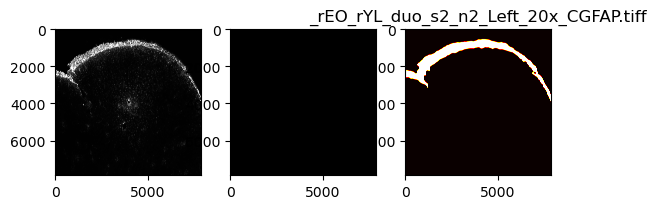

_rEO_rYL_duo_s2_n2_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51365378.0       22.224953      21.291035          1.000000
1      2    790216.0       21.068552      20.714963          0.947968
2      3    695128.0       22.453275      27.945845          1.010273
3      4    600040.0       20.399427      20.683678          0.917861
4      5    505048.0       18.608532      10.119450          0.837281
5      6    409976.0       19.909643      10.915353          0.895824
6      7    314872.0       22.137046      17.141360          0.996045
7      8    219872.0       24.795399      38.974556          1.115656
8      9    124792.0       17.788688       8.850633          0.800393
9   9999   6761985.0      301.083447     411.234195         13.547090


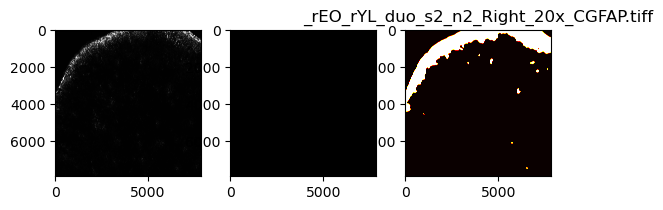

_rEO_rYL_duo_s3_n1_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  50399835.0       30.786855      20.887298          1.000000
1      2    790216.0       30.272694      20.323334          0.983299
2      3    695128.0       29.387775      19.994583          0.954556
3      4    600040.0       29.772367      19.952074          0.967048
4      5    505048.0       29.215312      18.943879          0.948954
5      6    409976.0       29.509262      19.012128          0.958502
6      7    314872.0       27.486763      17.498439          0.892808
7      8    219872.0       26.576576      16.054272          0.863244
8      9    124792.0       21.947344      12.562397          0.712880
9   9999   7868476.0       17.896411      24.572140          0.581300


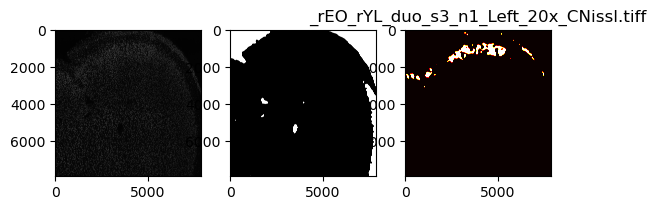

_rEO_rYL_duo_s3_n1_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  50566997.0       31.287373      21.131743          1.000000
1      2    790216.0       33.555673      24.664551          1.072499
2      3    695128.0       33.394896      24.030487          1.067360
3      4    600040.0       33.882293      24.649058          1.082938
4      5    504883.0       31.373395      23.605848          1.002749
5      6    403955.0       32.907901      23.678933          1.051795
6      7    314872.0       30.494712      21.874787          0.974665
7      8    219872.0       33.596543      22.601909          1.073805
8      9    124792.0       28.983965      19.399715          0.926379
9   9999   7810712.0       12.627322      17.484980          0.403592


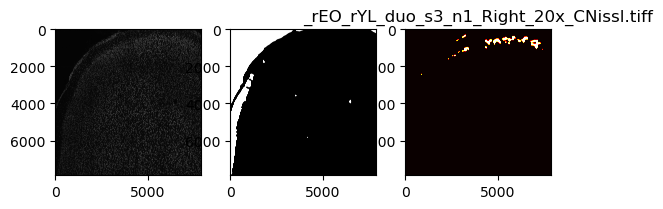

_rEO_rYL_duo_s3_n1_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  47379789.0       69.099628      72.910654          1.000000
1      2    790216.0       70.553127      75.930913          1.021035
2      3    695128.0       73.685808      82.070610          1.066371
3      4    600040.0       73.798212      78.027815          1.067997
4      5    505048.0       71.909308      79.785583          1.040661
5      6    409976.0       76.823956      87.989909          1.111785
6      7    314872.0       76.325888      83.339543          1.104577
7      8    219872.0       64.164459      56.002761          0.928579
8      9    124792.0       64.181286      56.536805          0.928822
9   9999  10881442.0      127.895971     172.522964          1.850892


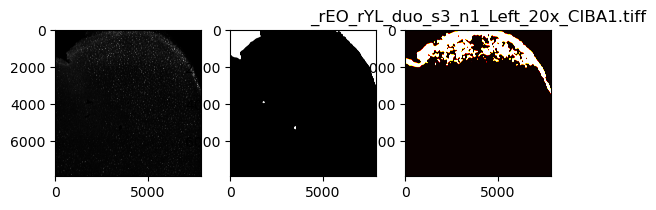

_rEO_rYL_duo_s3_n1_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  48933914.0       76.026305      92.339053          1.000000
1      2    790216.0       75.585527      88.950443          0.994202
2      3    695128.0       77.759142      97.375802          1.022793
3      4    600040.0       73.841376      85.740441          0.971261
4      5    505048.0       77.240039     103.521070          1.015965
5      6    409976.0       71.644474      82.385707          0.942364
6      7    314872.0       72.547283      87.303815          0.954239
7      8    219872.0       78.683943     103.780653          1.034957
8      9    124792.0       65.588187      80.084633          0.862704
9   9999   9437609.0       97.433892     175.884768          1.281581


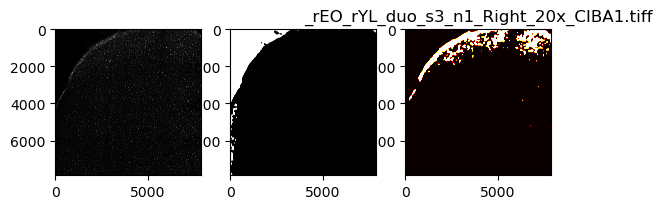

_rEO_rYL_duo_s3_n1_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54934048.0       38.680565      68.859795          1.000000
1      2    790216.0       53.797860      65.285392          1.390824
2      3    695128.0       60.645278      75.758760          1.567849
3      4    600040.0       71.765701      83.816389          1.855343
4      5    505048.0       87.914444      99.649007          2.272832
5      6    409976.0      111.495434     129.916885          2.882467
6      7    314872.0      170.767486     200.772939          4.414814
7      8    219872.0      240.155027     213.297771          6.208674
8      9    124792.0      469.739727     387.291588         12.144076
9   9999   3327183.0      754.068505     570.695517         19.494765


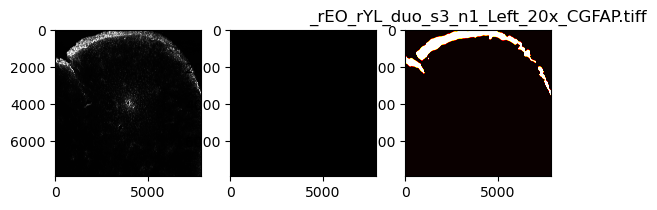

_rEO_rYL_duo_s3_n1_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52529141.0       19.124542      16.520613          1.000000
1      2    790216.0       22.817363      23.541376          1.193093
2      3    695128.0       22.779910      23.401971          1.191135
3      4    600040.0       23.914489      27.672990          1.250461
4      5    505048.0       22.425461      25.711345          1.172601
5      6    409976.0       19.961656      19.949848          1.043772
6      7    314872.0       16.764746       6.636601          0.876609
7      8    219872.0       16.094196       5.706853          0.841547
8      9    124792.0       16.923096       7.610321          0.884889
9   9999   5842382.0      240.476920     347.346003         12.574258


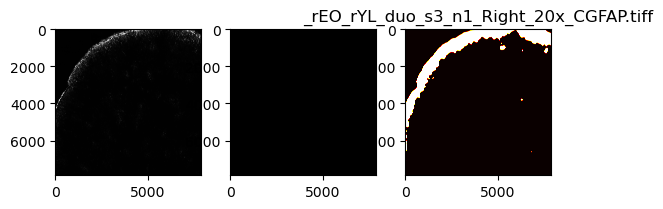

_rEO_rYL_duo_s3_n2_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53850355.0       34.393619      25.779596          1.000000
1      2    790216.0       35.657170      27.845597          1.036738
2      3    695128.0       38.124111      29.047195          1.108465
3      4    600040.0       35.620847      26.993288          1.035682
4      5    505048.0       34.005788      25.707117          0.988724
5      6    409976.0       35.537236      26.242632          1.033251
6      7    314872.0       33.441903      24.034046          0.972329
7      8    219872.0       31.011270      22.272708          0.901658
8      9    124792.0       30.248846      19.248424          0.879490
9   9999   4064644.0       13.122223      20.764561          0.381531


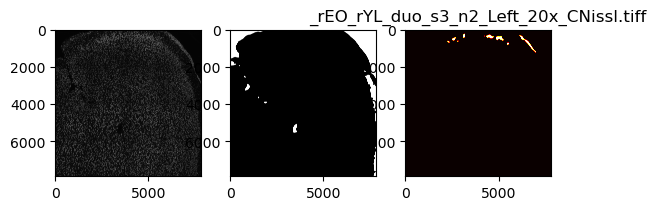

_rEO_rYL_duo_s3_n2_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55163636.0       39.075396      29.716861          1.000000
1      2    790216.0       43.720617      34.271884          1.118878
2      3    695128.0       38.889771      33.080740          0.995250
3      4    600040.0       38.099165      31.478702          0.975017
4      5    505048.0       40.701624      32.032017          1.041618
5      6    409976.0       38.554693      30.259593          0.986674
6      7    314872.0       35.168507      27.406584          0.900017
7      8    219872.0       33.277057      26.067738          0.851612
8      9    124792.0       30.950854      22.950685          0.792080
9   9999   3105515.0        9.023503       8.529504          0.230925


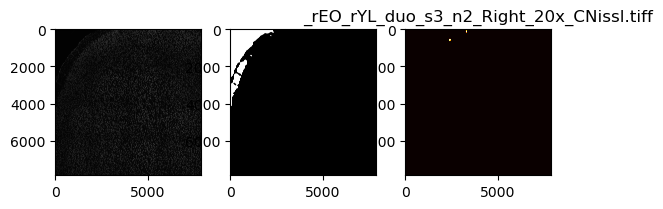

_rEO_rYL_duo_s3_n2_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51833987.0       93.893563     114.638498          1.000000
1      2    790216.0       94.003266     110.506084          1.001168
2      3    695128.0      102.060520     132.424500          1.086981
3      4    600040.0       98.394462     121.721773          1.047936
4      5    505048.0      102.939566     137.260827          1.096343
5      6    409976.0      102.017974     130.435328          1.086528
6      7    314872.0       93.653119     105.830978          0.997439
7      8    219872.0      105.879389     125.328704          1.127653
8      9    124792.0      107.099173      87.650153          1.140644
9   9999   6081012.0      166.150569     260.979833          1.769563


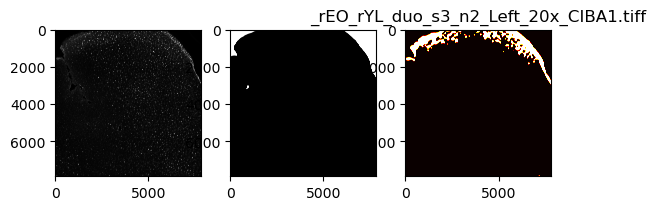

_rEO_rYL_duo_s3_n2_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54109500.0      117.982267     157.738989          1.000000
1      2    790216.0      113.886130     160.052807          0.965282
2      3    695128.0      106.168570     143.342181          0.899869
3      4    600040.0      109.735236     157.703527          0.930099
4      5    505048.0       99.487991     139.357084          0.843245
5      6    409976.0       97.575321     151.391435          0.827034
6      7    314872.0       99.533868     137.447979          0.843634
7      8    219872.0       84.766987     108.857934          0.718472
8      9    124792.0       86.692841     116.781885          0.734796
9   9999   4159651.0      159.491847     295.782278          1.351829


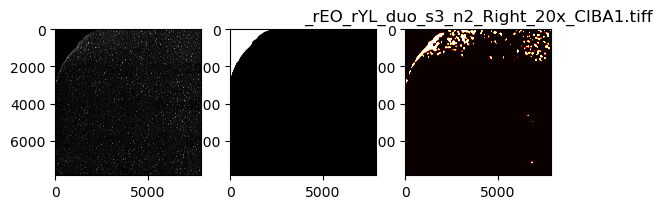

_rEO_rYL_duo_s3_n2_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56510869.0       41.333054      82.238381          1.000000
1      2    790216.0       74.224840     111.890023          1.795774
2      3    695128.0       74.095723     108.817177          1.792651
3      4    600040.0       83.166326     117.290937          2.012102
4      5    505048.0      104.934596     151.006148          2.538757
5      6    409976.0      119.124224     160.998515          2.882057
6      7    314872.0      188.872771     235.074351          4.569533
7      8    219872.0      298.710118     318.730582          7.226907
8      9    124792.0      665.737026     571.452200         16.106650
9   9999   1404130.0      908.949280     658.606064         21.990857


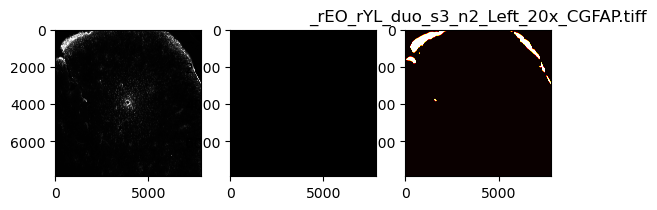

_rEO_rYL_duo_s3_n2_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55762512.0       22.945476      23.880520          1.000000
1      2    790216.0       21.840041      20.534258          0.951823
2      3    695128.0       26.917031      41.986863          1.173087
3      4    600040.0       24.101440      24.700795          1.050379
4      5    505048.0       23.250325      22.169252          1.013286
5      6    409976.0       28.498051      34.578756          1.241990
6      7    314872.0       35.485254      56.380035          1.546503
7      8    219872.0       27.481253      46.285811          1.197676
8      9    124792.0       19.599526      15.372721          0.854178
9   9999   2506639.0      278.694513     420.844557         12.145946


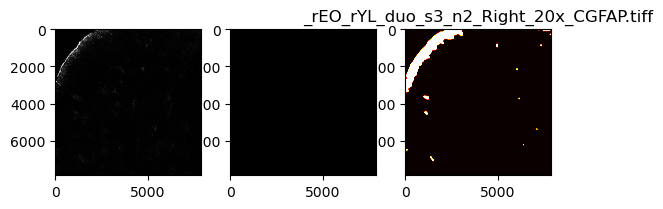

_rEO_rYL_duo_s4_n1_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55414086.0       38.100943      24.532186          1.000000
1      2    782480.0       44.356643      28.719077          1.164188
2      3    687520.0       44.164152      28.576393          1.159135
3      4    592312.0       43.292125      28.169292          1.136248
4      5    497240.0       42.791451      27.889354          1.123107
5      6    402280.0       41.397561      26.129636          1.086523
6      7    307208.0       39.830802      23.634832          1.045402
7      8    212136.0       37.974144      22.950686          0.996672
8      9    117048.0       36.132604      21.901917          0.948339
9   9999   2773240.0        8.296495       4.316653          0.217750


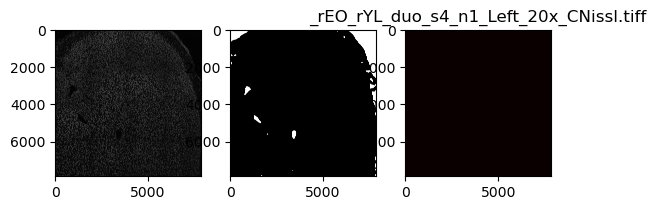

_rEO_rYL_duo_s4_n1_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57557001.0       37.516021      25.094363          1.000000
1      2    782480.0       37.640967      26.452615          1.003330
2      3    687520.0       37.853655      26.942513          1.009000
3      4    592312.0       38.271300      26.898224          1.020132
4      5    497240.0       35.691674      25.094149          0.951372
5      6    402280.0       36.582818      25.395327          0.975125
6      7    307208.0       33.255355      22.700696          0.886431
7      8    212136.0       29.909388      21.881119          0.797243
8      9    117048.0       28.667726      19.735781          0.764146
9   9999    874336.0        6.898237       1.710689          0.183874


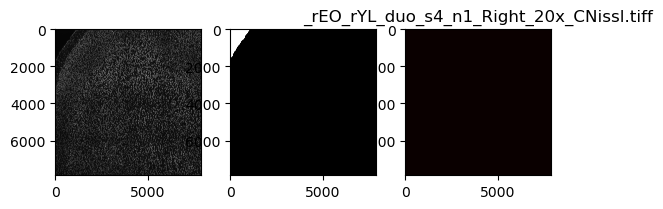

_rEO_rYL_duo_s4_n1_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56068297.0      125.069285     138.908497          1.000000
1      2    782480.0      136.346915     153.355253          1.090171
2      3    687520.0      132.859578     152.455483          1.062288
3      4    592312.0      133.680548     148.542729          1.068852
4      5    497240.0      131.256691     137.223529          1.049472
5      6    402280.0      144.204271     164.980214          1.152995
6      7    307208.0      141.940067     150.458310          1.134891
7      8    212136.0      145.165941     138.593295          1.160684
8      9    117048.0      139.738219     116.657730          1.117286
9   9999   2119029.0       96.635022     235.367118          0.772652


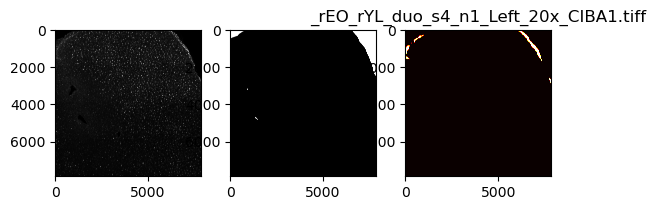

_rEO_rYL_duo_s4_n1_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57394780.0      121.786706     152.586587          1.000000
1      2    782480.0      104.217121     132.524264          0.855735
2      3    687520.0       98.607187     126.006814          0.809671
3      4    592312.0       93.876449     119.974440          0.770827
4      5    497240.0       94.102717     120.115505          0.772685
5      6    402280.0       93.577620     119.331667          0.768373
6      7    307208.0       89.871100      97.619873          0.737939
7      8    212136.0       94.282215     115.568215          0.774159
8      9    117048.0       72.386619      66.759014          0.594372
9   9999   1036557.0      120.665613     249.906624          0.990795


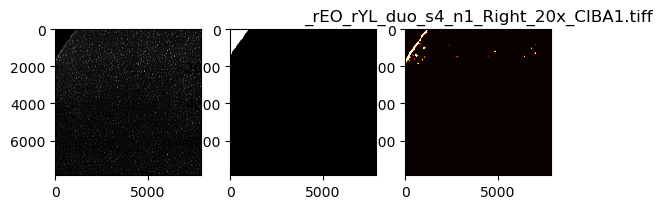

_rEO_rYL_duo_s4_n1_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57381138.0       42.647633      85.093886          1.000000
1      2    782480.0       84.369152     112.757555          1.978285
2      3    687520.0       91.543559     112.756853          2.146510
3      4    592312.0      106.633820     132.756358          2.500346
4      5    497240.0      133.395141     174.641917          3.127844
5      6    402280.0      176.319407     208.049419          4.134330
6      7    307208.0      285.952859     385.158954          6.705011
7      8    212136.0      398.431789     494.229684          9.342413
8      9    117048.0      525.846687     536.957696         12.330032
9   9999    806188.0     1028.952669     640.226512         24.126841


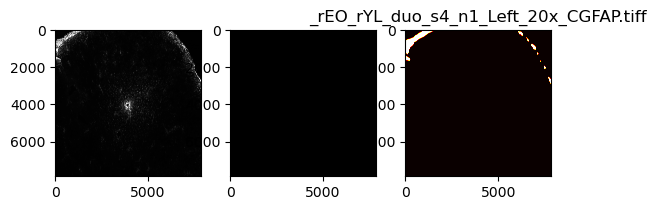

_rEO_rYL_duo_s4_n1_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56586935.0       21.338746      18.283166          1.000000
1      2    782480.0       22.099981      21.176925          1.035674
2      3    687520.0       20.225611      13.347577          0.947835
3      4    592312.0       23.104458      26.268605          1.082747
4      5    497240.0       20.826110      14.204225          0.975976
5      6    402280.0       23.208076      25.701698          1.087603
6      7    307208.0       27.245391      33.096208          1.276804
7      8    212136.0       26.646533      33.052205          1.248739
8      9    117048.0       23.523349      22.153422          1.102377
9   9999   1844402.0      284.933734     420.850508         13.352881


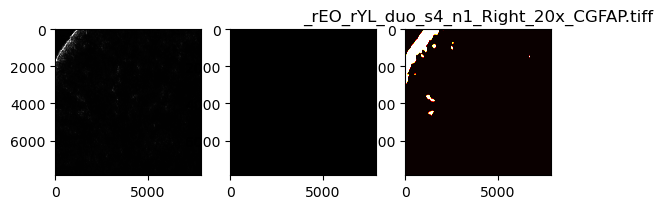

_rEO_rYL_duo_s4_n2_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57040488.0       40.938191      29.413505          1.000000
1      2    774800.0       39.918165      29.357055          0.975084
2      3    679720.0       39.385609      28.309098          0.962075
3      4    584616.0       35.062152      25.578041          0.856466
4      5    489560.0       38.264051      26.772929          0.934679
5      6    394608.0       33.829507      24.193306          0.826356
6      7    299400.0       34.392475      24.300008          0.840107
7      8    204416.0       31.170897      20.869343          0.761414
8      9    109312.0       32.446154      17.291868          0.792564
9   9999   1048545.0       14.466051      25.901319          0.353363


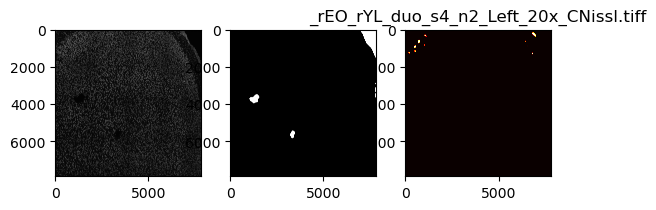

_rEO_rYL_duo_s4_n2_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57040470.0       43.127719      32.276312          1.000000
1      2    774800.0       43.395403      31.063444          1.006207
2      3    679720.0       40.898901      29.948456          0.948321
3      4    584616.0       42.515703      29.820074          0.985809
4      5    489560.0       41.093927      29.284176          0.952843
5      6    394608.0       37.101448      27.348227          0.860269
6      7    299400.0       38.469866      26.530080          0.891999
7      8    204416.0       36.208834      24.668511          0.839572
8      9    109312.0       34.561850      23.332648          0.801384
9   9999    939065.0       19.549107      36.643704          0.453284


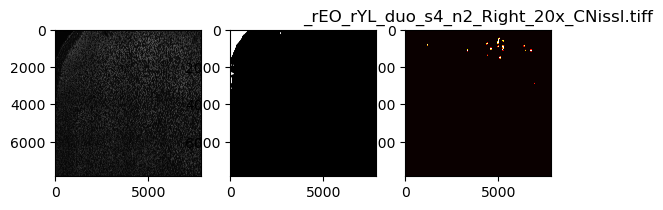

_rEO_rYL_duo_s4_n2_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55537478.0      110.171111     137.158277          1.000000
1      2    774800.0       89.632665     101.439282          0.813577
2      3    679720.0       95.595885     113.659870          0.867704
3      4    584616.0       91.270848     111.136739          0.828446
4      5    489560.0       93.877707     113.703353          0.852108
5      6    394608.0       87.411702     105.418072          0.793418
6      7    299400.0       93.370758     118.757129          0.847507
7      8    204416.0      100.999853     130.957431          0.916754
8      9    109312.0      126.355231     101.189710          1.146900
9   9999   2551555.0      276.284598     359.730773          2.507777


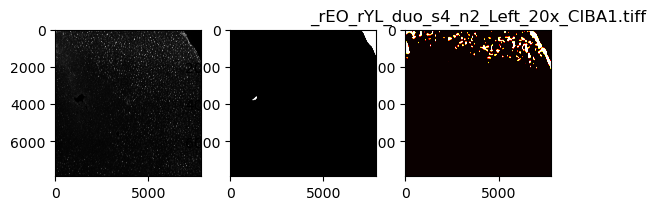

_rEO_rYL_duo_s4_n2_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54214056.0      118.720284     159.410269          1.000000
1      2    774800.0       99.743005     131.514341          0.840151
2      3    679720.0      102.715865     142.142625          0.865192
3      4    584616.0      102.315446     139.999177          0.861819
4      5    489560.0       99.299205     127.186408          0.836413
5      6    394608.0       97.481143     139.726166          0.821099
6      7    299400.0       98.160825     133.778118          0.826824
7      8    204416.0       93.304761     143.539881          0.785921
8      9    109312.0       75.030125     112.458218          0.631991
9   9999   3765479.0      277.960167     363.455222          2.341303


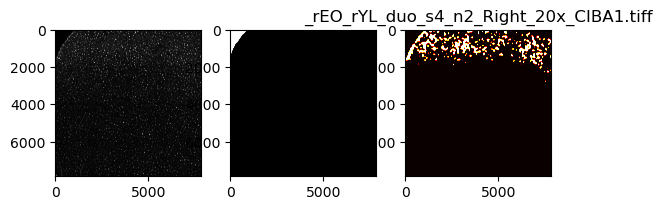

_rEO_rYL_duo_s4_n2_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57516742.0       40.702145      74.434291          1.000000
1      2    774800.0       87.260583     127.614818          2.143882
2      3    679720.0      100.354528     149.190546          2.465583
3      4    584616.0       99.813589     147.287732          2.452293
4      5    489560.0      100.345925     136.620881          2.465372
5      6    394608.0      121.775210     153.627827          2.991862
6      7    299400.0      204.517565     246.669077          5.024737
7      8    204416.0      372.172208     355.170755          9.143798
8      9    109312.0      809.023255     609.310329         19.876674
9   9999    572291.0      875.739613     638.481406         21.515810


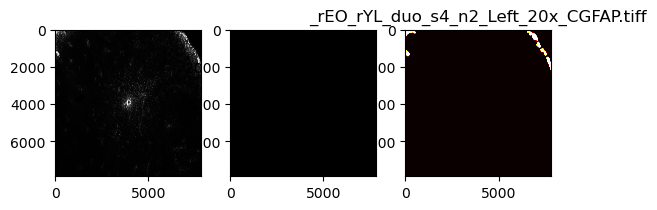

_rEO_rYL_duo_s4_n2_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56245803.0       23.619792      24.208879          1.000000
1      2    774800.0       21.813033      16.685117          0.923507
2      3    679720.0       23.796560      25.232352          1.007484
3      4    584616.0       23.762316      19.819513          1.006034
4      5    489560.0       21.491656      13.534220          0.909900
5      6    394608.0       21.013145      13.566749          0.889641
6      7    299400.0       18.147989       6.041998          0.768338
7      8    204416.0       18.165956       7.584891          0.769099
8      9    109312.0       19.844299      12.827702          0.840156
9   9999   1733732.0      286.936091     429.885124         12.148121


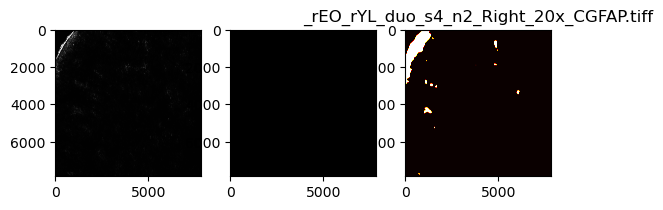

_rEO_rYL_duo_s5_n1_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56219637.0       34.719695      24.066906          1.000000
1      2    755376.0       36.088994      25.577383          1.039439
2      3    660376.0       36.438905      24.933419          1.049517
3      4    565352.0       35.606022      24.086091          1.025528
4      5    470256.0       35.545252      22.703038          1.023778
5      6    375224.0       34.963672      21.812443          1.007027
6      7    280168.0       30.388588      19.700079          0.875255
7      8    185088.0       30.122644      18.402362          0.867595
8      9     90000.0       25.938189      17.072735          0.747074
9   9999   2388906.0       12.881425      11.521928          0.371012


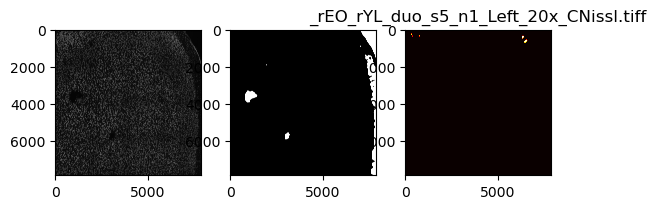

_rEO_rYL_duo_s5_n1_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58124709.0       35.420407      24.984227          1.000000
1      2    755376.0       37.972287      27.251469          1.072045
2      3    660376.0       34.720126      25.737971          0.980229
3      4    565352.0       37.577994      26.996626          1.060914
4      5    470256.0       35.813793      25.506092          1.011106
5      6    375224.0       33.747458      23.875732          0.952769
6      7    280168.0       37.088868      25.515436          1.047105
7      8    185088.0       30.449230      21.050054          0.859652
8      9     90000.0       31.097311      20.431894          0.877949
9   9999    381458.0       10.634877       6.342742          0.300247


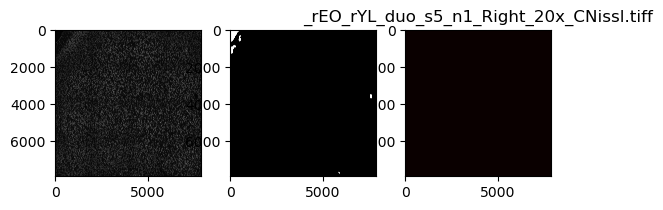

_rEO_rYL_duo_s5_n1_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56240998.0       88.512853     107.762279          1.000000
1      2    755376.0       81.375655      93.381099          0.919365
2      3    660376.0       87.351482     108.311626          0.986879
3      4    565352.0       86.900460     101.453164          0.981784
4      5    470256.0       80.664345      86.987850          0.911329
5      6    375224.0       89.104015     103.583862          1.006679
6      7    280168.0       91.807198     115.618933          1.037219
7      8    185088.0       93.863649      85.908253          1.060452
8      9     90000.0       85.071433      80.478616          0.961120
9   9999   2367545.0      192.001205     277.957188          2.169190


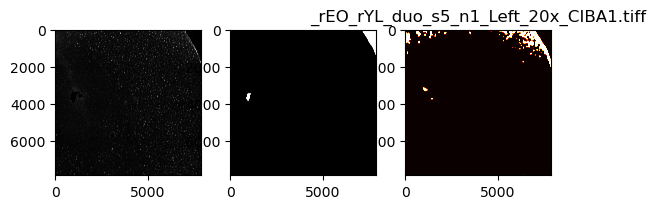

_rEO_rYL_duo_s5_n1_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57823271.0       96.729565     131.330610          1.000000
1      2    755376.0       86.637272     117.690234          0.895665
2      3    660376.0       85.810625     119.500216          0.887119
3      4    565352.0       88.792006     120.974563          0.917941
4      5    470256.0       91.645287     133.956300          0.947438
5      6    375224.0       85.585154     111.448589          0.884788
6      7    280168.0       77.478823     102.607306          0.800984
7      8    185088.0       73.367814      89.139664          0.758484
8      9     90000.0       68.798822      93.383463          0.711249
9   9999    682896.0      202.950666     296.933642          2.098124


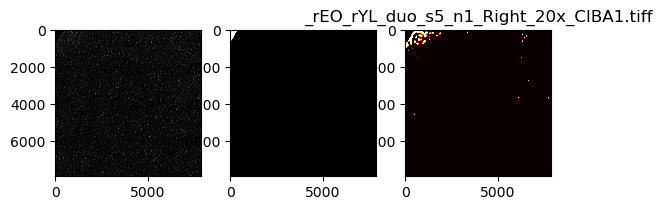

_rEO_rYL_duo_s5_n1_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58244291.0       33.809669      54.507019          1.000000
1      2    755376.0       61.905022      81.774989          1.830986
2      3    660376.0       68.348029      92.888544          2.021553
3      4    565352.0       88.647172     117.426975          2.621947
4      5    470256.0      115.558183     153.320753          3.417903
5      6    375224.0      150.322498     176.896489          4.446139
6      7    280168.0      209.322021     291.050642          6.191188
7      8    185088.0      341.999200     420.198756         10.115426
8      9     90000.0      337.997444     398.994673          9.997065
9   9999    364252.0      651.879372     603.793199         19.280856


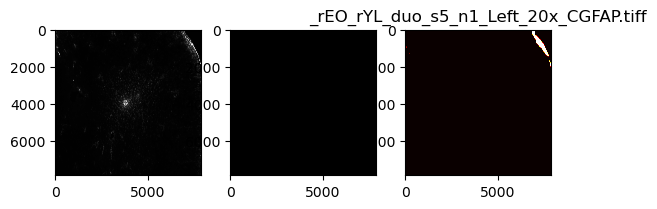

_rEO_rYL_duo_s5_n1_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57421027.0       21.375879      20.080009          1.000000
1      2    755376.0       22.198419      17.501107          1.038480
2      3    660376.0       20.546675      12.379816          0.961208
3      4    565352.0       19.508152       9.124348          0.912625
4      5    470256.0       19.252824      11.488780          0.900680
5      6    375224.0       18.033460       7.688634          0.843636
6      7    280168.0       16.695443       4.569291          0.781041
7      8    185088.0       18.080589       8.302595          0.845841
8      9     90000.0       31.340522      38.140959          1.466163
9   9999   1085140.0      235.236605     373.701145         11.004769


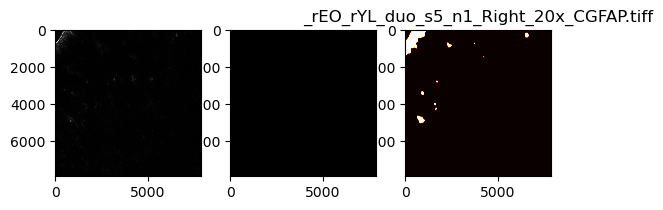

_rEO_rYL_duo_s5_n2_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55913500.0       31.854274      21.639716          1.000000
1      2    747712.0       36.155561      24.330338          1.135030
2      3    652608.0       34.375388      23.027101          1.079145
3      4    557592.0       33.392294      22.110371          1.048283
4      5    462496.0       34.503944      22.421215          1.083181
5      6    367520.0       32.009725      21.284179          1.004880
6      7    272360.0       31.704916      19.680420          0.995311
7      8    177392.0       28.290768      17.759457          0.888131
8      9     82272.0       24.962016      15.396206          0.783632
9   9999   2728535.0       11.567799       5.890045          0.363147


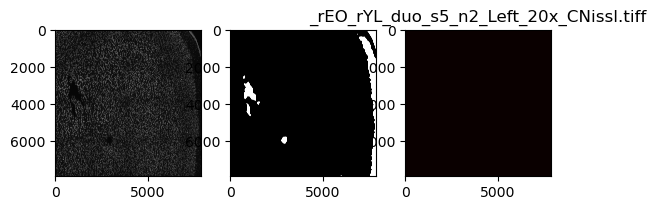

_rEO_rYL_duo_s5_n2_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58479694.0       34.943422      24.200940          1.000000
1      2    747712.0       36.614067      25.631596          1.047810
2      3    652608.0       36.912562      25.171610          1.056352
3      4    557592.0       35.814963      25.110645          1.024941
4      5    462496.0       35.117359      25.447020          1.004978
5      6    367520.0       34.398727      23.845577          0.984412
6      7    272360.0       33.048094      22.439066          0.945760
7      8    177392.0       30.446001      20.579185          0.871294
8      9     82272.0       29.936734      20.826130          0.856720
9   9999    130829.0       16.206437      11.090603          0.463791


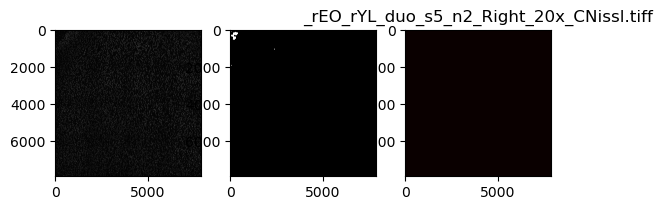

_rEO_rYL_duo_s5_n2_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57918955.0       72.942648      86.149584          1.000000
1      2    747712.0       77.620489      97.908803          1.064130
2      3    652608.0       74.464881      87.775612          1.020869
3      4    557592.0       75.518583      84.260359          1.035315
4      5    462496.0       76.614903      92.781853          1.050344
5      6    367520.0       78.616973      92.260766          1.077792
6      7    272360.0       87.032600      97.239638          1.193165
7      8    177392.0       79.258304      80.601026          1.086584
8      9     82272.0       89.473636     104.720215          1.226630
9   9999    723080.0      129.970399     255.140930          1.781816


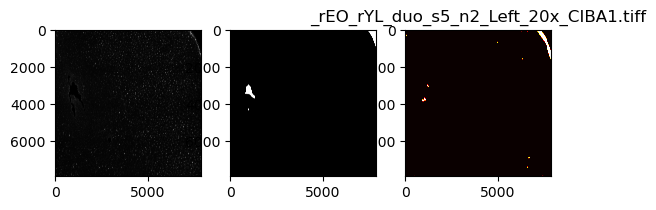

_rEO_rYL_duo_s5_n2_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58198338.0       86.692220     116.406665          1.000000
1      2    747712.0       88.534949     124.341564          1.021256
2      3    652608.0       79.895911     109.443178          0.921604
3      4    557592.0       77.065069     103.104783          0.888950
4      5    462496.0       75.507291     102.769812          0.870981
5      6    367520.0       70.737258      95.818629          0.815959
6      7    272360.0       72.923693      92.284863          0.841179
7      8    177392.0       74.798136     104.648366          0.862801
8      9     82272.0       66.186151      74.831431          0.763461
9   9999    412185.0      263.940730     342.308273          3.044572


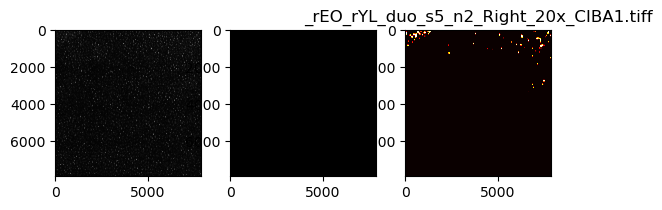

_rEO_rYL_duo_s5_n2_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58411040.0       30.691057      44.763685          1.000000
1      2    747712.0       62.089395      88.690800          2.023045
2      3    652608.0       75.249520     119.666220          2.451839
3      4    557592.0       86.651555     123.108642          2.823349
4      5    462496.0      103.550374     142.318602          3.373959
5      6    367520.0      144.097301     197.976460          4.695091
6      7    272360.0      239.535119     320.099901          7.804721
7      8    177392.0      312.657628     368.033409         10.187255
8      9     82272.0      287.447248     306.517359          9.365831
9   9999    230995.0      608.875023     630.379290         19.838842


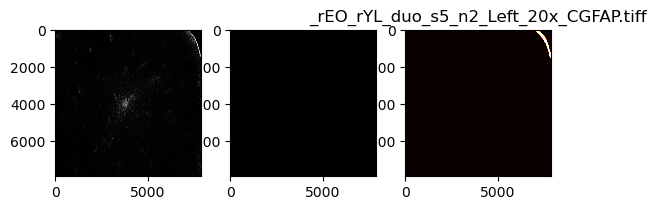

_rEO_rYL_duo_s5_n2_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57974451.0       20.481267      18.149019          1.000000
1      2    747712.0       19.275268      11.759547          0.941117
2      3    652608.0       17.769920       6.801320          0.867618
3      4    557592.0       17.206891       5.293500          0.840128
4      5    462496.0       17.465444       7.070772          0.852752
5      6    367520.0       19.525359      12.124253          0.953328
6      7    272360.0       19.208250      13.454055          0.937845
7      8    177392.0       22.806885      18.373590          1.113549
8      9     82272.0       20.473187      12.204613          0.999605
9   9999    636072.0      146.435146     223.388853          7.149711


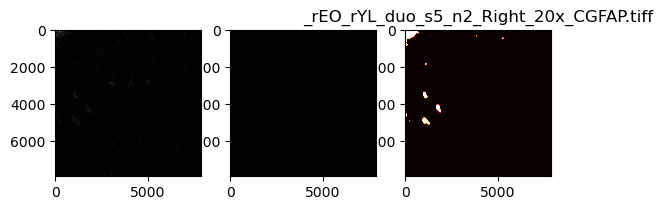

_rEO_rYL_trio_s1_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49612906.0       37.964189      28.781883          1.000000
1      2    755376.0       36.071979      27.337251          0.950158
2      3    660376.0       35.352437      26.616983          0.931205
3      4    565352.0       32.855913      25.414130          0.865445
4      5    470256.0       33.010216      24.758700          0.869509
5      6    375224.0       30.839205      23.009475          0.812324
6      7    280168.0       30.600740      23.122890          0.806042
7      8    185088.0       29.985315      22.689530          0.789832
8      9     90000.0       27.606344      21.629773          0.727168
9   9999   8995637.0       13.421801      16.754823          0.353538


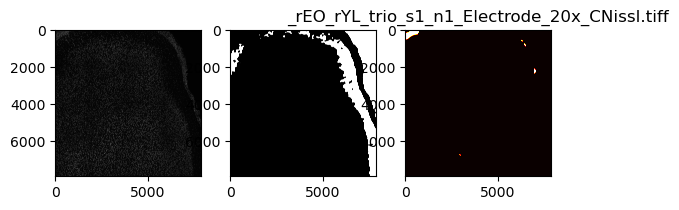

_rEO_rYL_trio_s1_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  44023729.0       39.897539      29.727277          1.000000
1      2    584807.0       40.222222      29.023733          1.008138
2      3    550229.0       39.541876      28.654173          0.991086
3      4    548915.0       38.997133      26.382963          0.977432
4      5    470256.0       38.033584      26.030373          0.953281
5      6    375224.0       37.167007      24.302282          0.931561
6      7    280168.0       34.671968      22.007951          0.869025
7      8    185088.0       36.208949      23.428688          0.907548
8      9     90000.0       34.851589      21.857827          0.873527
9   9999  14905601.0       11.439968       9.374052          0.286734


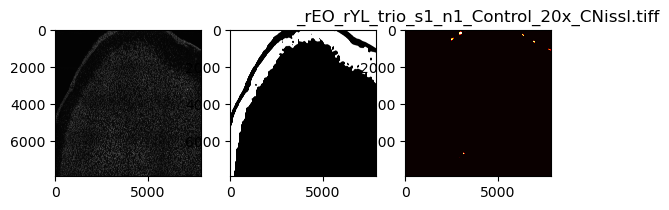

_rEO_rYL_trio_s1_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54442222.0       62.437390     108.618218          1.000000
1      2    755376.0       59.034852     104.814629          0.945505
2      3    660376.0       55.252238      93.561382          0.884922
3      4    565352.0       57.843437     107.328121          0.926423
4      5    470256.0       55.042283     102.822238          0.881560
5      6    375224.0       51.161501      86.459673          0.819405
6      7    280168.0       52.645017      91.797464          0.843165
7      8    185088.0       41.863551      57.518402          0.670488
8      9     90000.0       46.000989     101.273828          0.736754
9   9999   4166321.0       65.864516     175.938941          1.054889


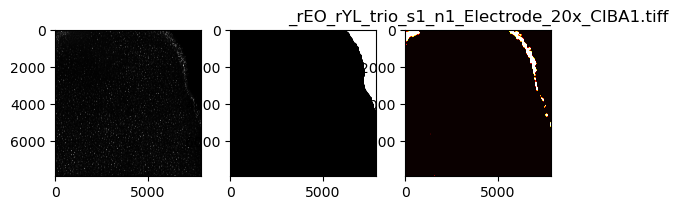

_rEO_rYL_trio_s1_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51854629.0       67.951560     122.328298          1.000000
1      2    755376.0       64.075668     109.471918          0.942961
2      3    660376.0       68.124428     117.258156          1.002544
3      4    565352.0       69.373344     111.681334          1.020923
4      5    470256.0       65.709969      98.990778          0.967012
5      6    375224.0       63.670269     108.738898          0.936995
6      7    280168.0       62.166729     100.169534          0.914868
7      8    185088.0       73.914408     129.620194          1.087751
8      9     90000.0       64.747178     100.613962          0.952843
9   9999   6777548.0       23.960676      99.867420          0.352614


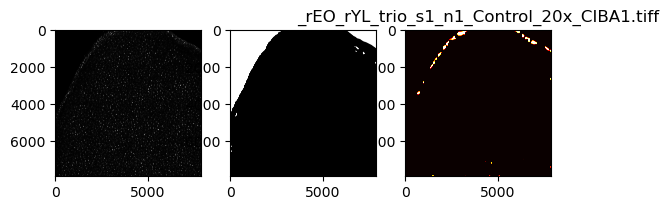

_rEO_rYL_trio_s1_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57397995.0       61.027531     140.000026          1.000000
1      2    755376.0       21.556867      19.369996          0.353232
2      3    660376.0       21.354983      14.699576          0.349924
3      4    565352.0       20.131831      15.258576          0.329881
4      5    470256.0       19.143284      10.751739          0.313683
5      6    375224.0       18.783577      11.170727          0.307789
6      7    280168.0       17.007139       7.179846          0.278680
7      8    185088.0       15.239967       4.560715          0.249723
8      9     90000.0       14.870022       4.476762          0.243661
9   9999   1210548.0     1000.246668     625.987129         16.390089


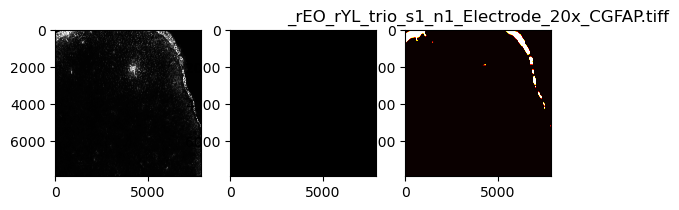

_rEO_rYL_trio_s1_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  50514528.0       26.241709      37.979716          1.000000
1      2    644706.0       27.605873      28.009415          1.051985
2      3    619275.0       28.840738      37.027312          1.099042
3      4    560894.0       27.733329      30.575662          1.056842
4      5    470256.0       26.890910      32.048743          1.024739
5      6    375224.0       25.087382      26.068916          0.956012
6      7    280168.0       22.903594      17.342890          0.872794
7      8    185088.0       27.654678      25.614127          1.053844
8      9     90000.0       27.987444      17.842286          1.066525
9   9999   8273878.0      284.729515     433.666958         10.850266


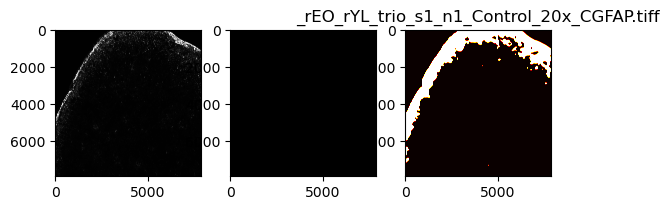

_rEO_rYL_trio_s1_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  47397147.0       37.637915      31.812340          1.000000
1      2    755376.0       46.135615      36.073046          1.225775
2      3    660376.0       41.745381      33.381943          1.109131
3      4    565352.0       42.553515      33.753619          1.130602
4      5    470256.0       39.739601      31.295970          1.055840
5      6    375224.0       36.785621      28.059227          0.977355
6      7    280168.0       34.590956      25.572709          0.919045
7      8    185088.0       33.123109      22.537802          0.880046
8      9     90000.0       30.164656      20.972065          0.801443
9   9999  11274420.0        8.075683       5.213754          0.214562


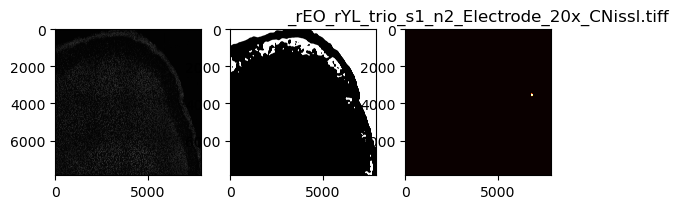

_rEO_rYL_trio_s1_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  42654250.0       45.948097      35.602071          1.000000
1      2    755376.0       43.647115      32.040160          0.949922
2      3    660376.0       40.801122      30.257538          0.887983
3      4    565352.0       40.527721      28.728866          0.882033
4      5    470256.0       39.314333      29.080206          0.855625
5      6    375224.0       37.885250      26.162640          0.824523
6      7    280168.0       36.159658      25.639964          0.786967
7      8    185088.0       32.321193      23.080014          0.703428
8      9     90000.0       29.442311      20.523366          0.640773
9   9999  15851987.0       10.355026       7.626535          0.225364


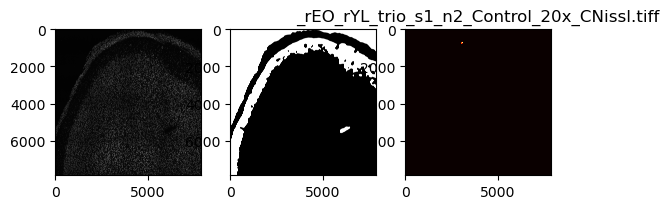

_rEO_rYL_trio_s1_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  48444349.0       63.290162     110.281430          1.000000
1      2    755376.0       76.735848     143.379557          1.212445
2      3    660376.0       72.837655     134.065565          1.150853
3      4    565352.0       72.844592     133.533221          1.150962
4      5    470256.0       75.916409     143.903109          1.199498
5      6    375224.0       71.627878     131.922080          1.131738
6      7    280168.0       69.250282     127.592726          1.094171
7      8    185088.0       86.539797     145.165493          1.367350
8      9     90000.0       88.267878     141.203433          1.394654
9   9999  10227218.0       42.575083     144.453191          0.672697


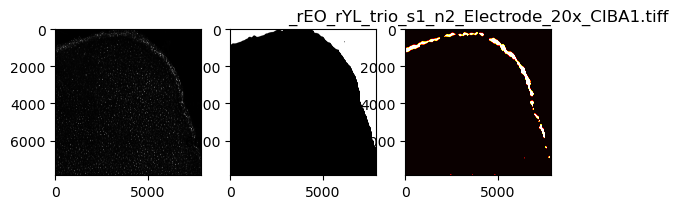

_rEO_rYL_trio_s1_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49001937.0       75.214931     130.205093          1.000000
1      2    755376.0       82.273930     145.369778          1.093851
2      3    660376.0       81.737348     141.874140          1.086717
3      4    565352.0       81.630761     143.840952          1.085300
4      5    470256.0       76.567712     139.111317          1.017986
5      6    375224.0       77.653354     136.105962          1.032419
6      7    280168.0       74.669509     133.139007          0.992748
7      8    185088.0       62.836780     106.510730          0.835430
8      9     90000.0       67.085733     112.013844          0.891920
9   9999   9504300.0       33.852053     122.492908          0.450071


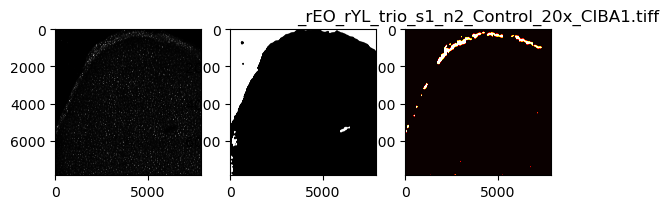

_rEO_rYL_trio_s1_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56228134.0       55.314585     116.016823          1.000000
1      2    755376.0       73.522982     117.504378          1.329179
2      3    660376.0       77.262791     119.342765          1.396789
3      4    565352.0       83.296405     125.392122          1.505867
4      5    470256.0      110.803749     168.715464          2.003156
5      6    375224.0      159.687659     204.113078          2.886900
6      7    280168.0      277.907477     331.094927          5.024127
7      8    185088.0      448.176608     458.223153          8.102323
8      9     90000.0      730.845689     588.999340         13.212531
9   9999   2443433.0     1014.497594     663.443179         18.340508


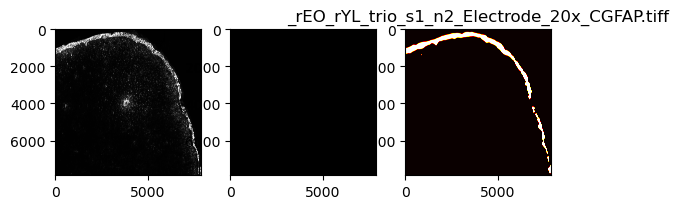

_rEO_rYL_trio_s1_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51162973.0       33.450233      52.531223          1.000000
1      2    755376.0       32.091491      38.498686          0.959380
2      3    660376.0       34.698557      44.568635          1.037319
3      4    565352.0       34.906803      49.014091          1.043544
4      5    470256.0       28.883113      30.364062          0.863465
5      6    375224.0       28.203465      23.183433          0.843147
6      7    280168.0       27.103160      28.160515          0.810253
7      8    185088.0       28.740345      26.821861          0.859197
8      9     90000.0       29.385678      31.025390          0.878489
9   9999   7343264.0      399.618486     497.286680         11.946658


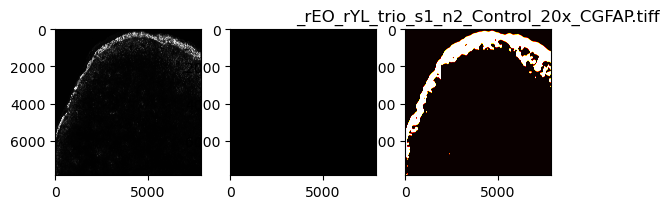

_rEO_rYL_trio_s2_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49501952.0       39.728567      31.614196          1.000000
1      2    765536.0       38.784904      30.854270          0.976247
2      3    670400.0       37.757412      30.152414          0.950384
3      4    575376.0       36.769909      27.693238          0.925528
4      5    480344.0       37.722364      28.226964          0.949502
5      6    385236.0       33.376154      24.773543          0.840105
6      7    290176.0       32.455654      24.077833          0.816935
7      8    195128.0       29.436396      20.679072          0.740938
8      9    100048.0       28.193247      17.122137          0.709647
9   9999   8934535.0       18.039905      29.000592          0.454079


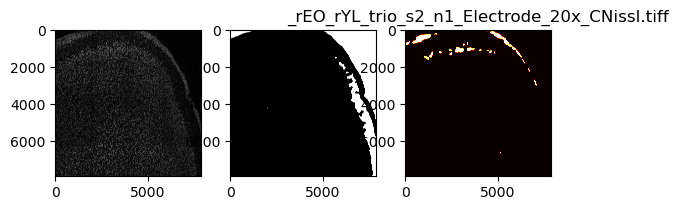

_rEO_rYL_trio_s2_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  50115576.0       41.120937      32.779520          1.000000
1      2    765536.0       40.719898      31.852565          0.990247
2      3    670400.0       41.587224      31.161933          1.011339
3      4    575376.0       39.609973      29.024861          0.963256
4      5    480344.0       36.633128      27.184640          0.890863
5      6    385236.0       37.427634      27.978528          0.910184
6      7    290176.0       34.292678      23.321981          0.833947
7      8    195128.0       32.904396      23.646096          0.800186
8      9    100048.0       31.107708      20.162267          0.756493
9   9999   8140120.0       10.487481      10.572248          0.255040


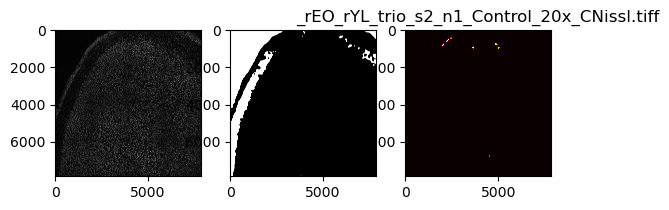

_rEO_rYL_trio_s2_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49901532.0       64.560163     111.499295          1.000000
1      2    765536.0       63.579461     124.005810          0.984809
2      3    670400.0       60.001518     110.979202          0.929389
3      4    575376.0       64.931956     118.388676          1.005759
4      5    480344.0       67.651221     122.979447          1.047879
5      6    385236.0       63.947539     124.834687          0.990511
6      7    290176.0       67.389815     125.697963          1.043830
7      8    195128.0       77.158885     129.580737          1.195147
8      9    100048.0       70.341156      97.789019          1.089544
9   9999   8534955.0       87.135971     187.837889          1.349686


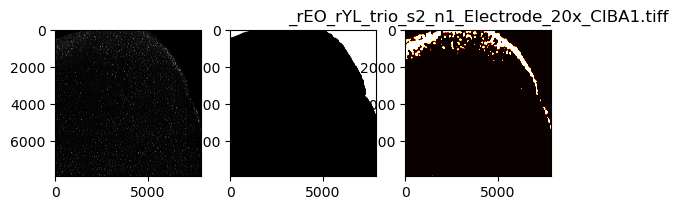

_rEO_rYL_trio_s2_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52363167.0       71.071292     122.243867          1.000000
1      2    765536.0       67.521597     112.983156          0.950054
2      3    670400.0       73.451228     132.978928          1.033487
3      4    575376.0       71.321710     129.563164          1.003523
4      5    480344.0       72.423728     130.523336          1.019029
5      6    385236.0       72.870461     139.240367          1.025315
6      7    290176.0       67.853155     115.354759          0.954720
7      8    195128.0       69.743732     144.565421          0.981321
8      9    100048.0       51.746901      82.747046          0.728099
9   9999   5892529.0       46.792675     147.577511          0.658391


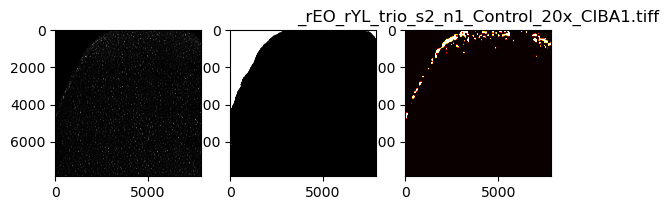

_rEO_rYL_trio_s2_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54788994.0       45.453965      98.310146          1.000000
1      2    765536.0       52.282188      77.224175          1.150223
2      3    670400.0       56.422163      84.363817          1.241303
3      4    575376.0       68.703677     105.037695          1.511500
4      5    480344.0       69.655817      99.185689          1.532448
5      6    385236.0      107.892809     143.998191          2.373672
6      7    290176.0      179.468864     237.890156          3.948365
7      8    195128.0      282.299998     272.721446          6.210679
8      9    100048.0      602.320236     482.455473         13.251214
9   9999   3647493.0      779.621790     604.880660         17.151898


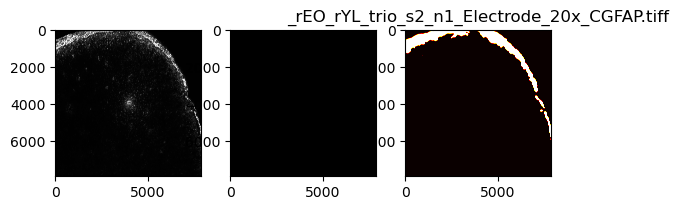

_rEO_rYL_trio_s2_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  49303884.0       23.625883      26.398704          1.000000
1      2    765536.0       24.181226      24.558803          1.023506
2      3    670400.0       23.898314      21.164105          1.011531
3      4    575376.0       24.925256      20.472082          1.054998
4      5    480344.0       25.070739      22.521064          1.061156
5      6    385236.0       23.035692      16.733911          0.975019
6      7    290176.0       26.292729      36.190980          1.112878
7      8    195128.0       28.168771      33.810504          1.192284
8      9    100048.0       34.524608      41.493490          1.461304
9   9999   8951812.0      267.215047     383.785739         11.310267


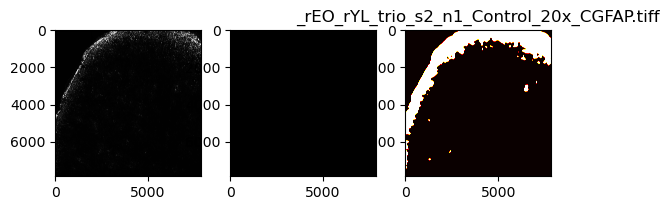

_rEO_rYL_trio_s2_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51329399.0       42.607875      34.854233          1.000000
1      2    755376.0       46.583261      37.659037          1.093302
2      3    660376.0       44.402094      35.356926          1.042110
3      4    565352.0       43.822339      35.783939          1.028503
4      5    470256.0       42.565526      34.066987          0.999006
5      6    375224.0       42.013469      32.205782          0.986049
6      7    280168.0       44.921012      33.048183          1.054289
7      8    185088.0       38.369197      28.701883          0.900519
8      9     90000.0       31.339211      23.771573          0.735526
9   9999   7279144.0       12.543809      17.650085          0.294401


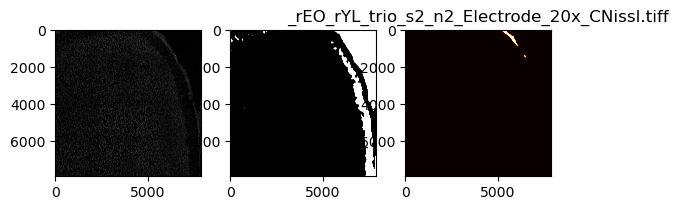

_rEO_rYL_trio_s2_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52895309.0       46.648395      37.632180          1.000000
1      2    755376.0       48.394438      39.301270          1.037430
2      3    660376.0       47.720732      37.800648          1.022988
3      4    565352.0       47.411844      38.451779          1.016366
4      5    470256.0       45.367598      35.741850          0.972544
5      6    375224.0       45.093989      36.472621          0.966678
6      7    280168.0       42.384948      33.252847          0.908605
7      8    185088.0       42.863395      32.591814          0.918861
8      9     90000.0       41.586622      32.327105          0.891491
9   9999   5241541.0       12.657083      16.149986          0.271329


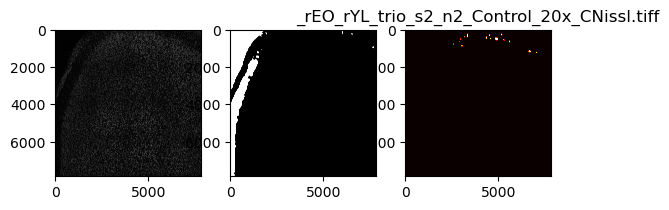

_rEO_rYL_trio_s2_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53470383.0       62.887867     108.921240          1.000000
1      2    755376.0       70.312774     132.127418          1.118066
2      3    660376.0       64.016145     110.434686          1.017941
3      4    565352.0       66.015334     117.172349          1.049731
4      5    470256.0       64.839366     121.752240          1.031031
5      6    375224.0       68.031653     116.133595          1.081793
6      7    280168.0       69.222270     120.600127          1.100725
7      8    185088.0       70.931400     114.048440          1.127903
8      9     90000.0       67.496389     103.620206          1.073282
9   9999   5138160.0       57.223743     171.459622          0.909933


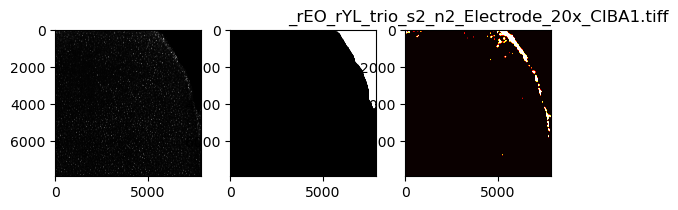

_rEO_rYL_trio_s2_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54738679.0       75.781206     125.080893          1.000000
1      2    755376.0       74.585238     127.083242          0.984218
2      3    660376.0       76.155472     131.317246          1.004939
3      4    565352.0       75.699421     144.264150          0.998921
4      5    470256.0       73.291199     128.296260          0.967142
5      6    375224.0       69.254754     112.359562          0.913878
6      7    280168.0       73.661667     129.140198          0.972031
7      8    185088.0       60.854323      94.013990          0.803027
8      9     90000.0       66.280567      94.999884          0.874631
9   9999   3398171.0       64.983038     186.793902          0.857509


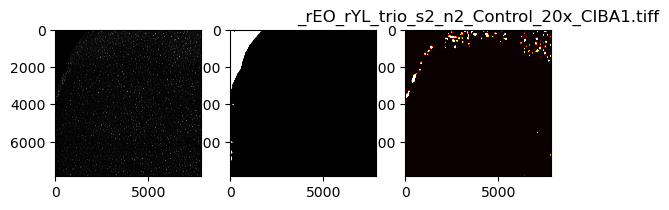

_rEO_rYL_trio_s2_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56532276.0       40.077780      77.090577          1.000000
1      2    755376.0       61.769737      86.508387          1.541246
2      3    660376.0       67.721398     101.228814          1.689749
3      4    565352.0       67.954083      98.220224          1.695555
4      5    470256.0       81.688348     114.669841          2.038245
5      6    375224.0      124.105590     174.355144          3.096618
6      7    280168.0      191.897454     221.840638          4.788126
7      8    185088.0      289.368041     284.609127          7.220161
8      9     90000.0      417.013044     325.416369         10.405093
9   9999   2076267.0      603.723309     557.813979         15.063791


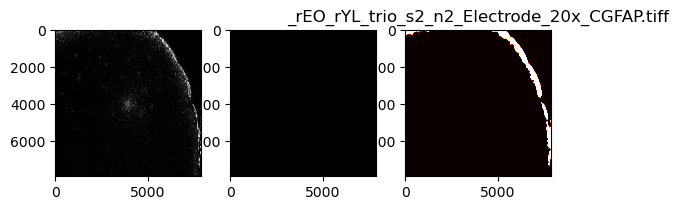

_rEO_rYL_trio_s2_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  51177192.0       25.764640      25.793805          1.000000
1      2    755376.0       27.636188      31.370839          1.072640
2      3    660376.0       25.873160      27.144868          1.004212
3      4    565352.0       24.150460      14.877633          0.937349
4      5    470256.0       28.213124      25.807305          1.095033
5      6    375224.0       28.499715      39.700732          1.106156
6      7    280168.0       27.232336      32.484298          1.056966
7      8    185088.0       28.915975      32.640063          1.122312
8      9     90000.0       27.153800      24.125586          1.053917
9   9999   6959658.0      257.210330     360.655130          9.983075


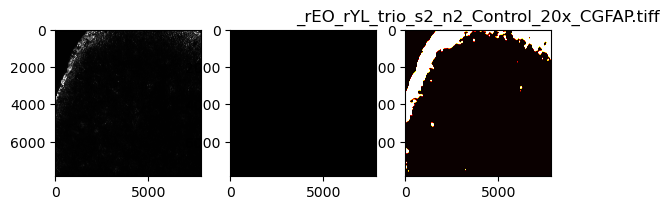

_rEO_rYL_trio_s3_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52829159.0       34.666705      24.015253          1.000000
1      2    755376.0       36.296540      25.200194          1.047014
2      3    660376.0       34.647680      24.909488          0.999451
3      4    565352.0       36.445680      24.389317          1.051317
4      5    470256.0       33.716612      23.873993          0.972594
5      6    375224.0       32.710013      22.499335          0.943557
6      7    280168.0       31.288941      20.874272          0.902565
7      8    185088.0       30.333069      19.112627          0.874991
8      9     90000.0       25.609611      16.207435          0.738738
9   9999   5511804.0       13.198897      17.408123          0.380737


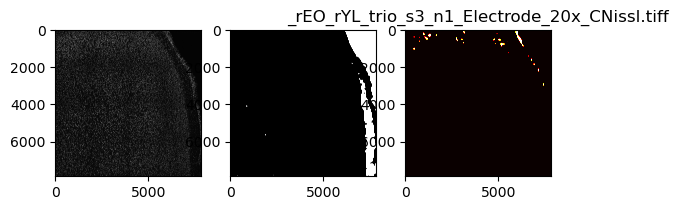

_rEO_rYL_trio_s3_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53759761.0       35.779069      24.333405          1.000000
1      2    755376.0       37.415899      25.859331          1.045748
2      3    660376.0       36.154992      25.560897          1.010507
3      4    565352.0       36.581792      25.300992          1.022436
4      5    470256.0       34.939505      25.089591          0.976535
5      6    375224.0       35.655470      24.119693          0.996545
6      7    280168.0       32.408933      22.687771          0.905807
7      8    185088.0       29.899864      19.277646          0.835680
8      9     90000.0       32.538289      19.924875          0.909422
9   9999   4518362.0       12.705164      13.577515          0.355100


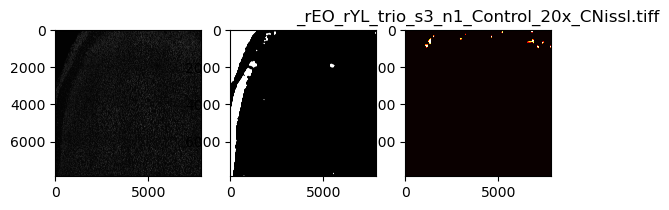

_rEO_rYL_trio_s3_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53617640.0       47.422088      61.291693          1.000000
1      2    755376.0       47.489561      64.857841          1.001423
2      3    660376.0       46.854073      63.230801          0.988022
3      4    565352.0       49.447189      70.033371          1.042704
4      5    470256.0       47.258289      57.991431          0.996546
5      6    375224.0       48.287428      65.556041          1.018248
6      7    280168.0       50.192820      67.322713          1.058427
7      8    185088.0       49.326153      52.527663          1.040151
8      9     90000.0       49.435244      39.744568          1.042452
9   9999   4723323.0       59.225811     118.328921          1.248908


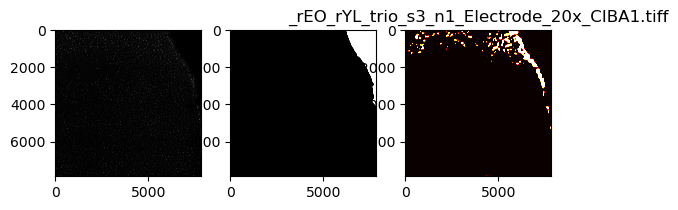

_rEO_rYL_trio_s3_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53819105.0       50.991119      66.439824          1.000000
1      2    755376.0       51.459443      75.337069          1.009184
2      3    660376.0       48.888409      64.067475          0.958763
3      4    565352.0       50.002747      66.615889          0.980617
4      5    470256.0       49.174705      65.618585          0.964378
5      6    375224.0       48.370515      63.525009          0.948607
6      7    280168.0       47.645802      70.294275          0.934394
7      8    185088.0       47.534551      62.899350          0.932212
8      9     90000.0       40.358033      40.552341          0.791472
9   9999   4459018.0       77.026001     128.630413          1.510577


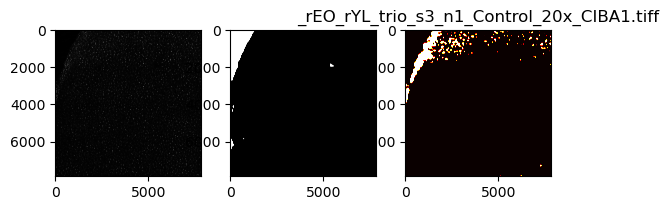

_rEO_rYL_trio_s3_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56602383.0       29.806259      38.468984          1.000000
1      2    755376.0       41.946036      41.516110          1.407290
2      3    660376.0       42.970271      41.873404          1.441653
3      4    565352.0       52.963936      50.229067          1.776940
4      5    470256.0       58.617023      54.863374          1.966601
5      6    375224.0       78.517339      73.816778          2.634257
6      7    280168.0      123.924103     104.445875          4.157654
7      8    185088.0      192.828082     150.185961          6.469382
8      9     90000.0      393.849178     291.123136         13.213640
9   9999   1738580.0      444.348165     384.193976         14.907881


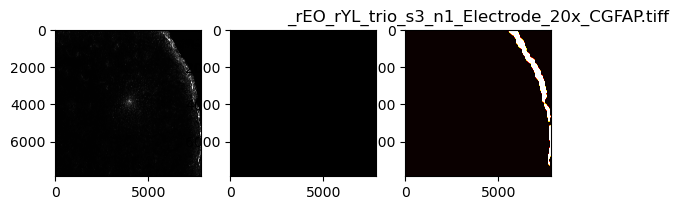

_rEO_rYL_trio_s3_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53203547.0       21.754968      15.417421          1.000000
1      2    755376.0       22.382170      12.696038          1.028830
2      3    660376.0       23.391354      15.249273          1.075219
3      4    565352.0       25.687103      22.791984          1.180747
4      5    470256.0       24.652972      16.681892          1.133211
5      6    375224.0       21.912119      12.008633          1.007224
6      7    280168.0       22.558618      17.118167          1.036941
7      8    185088.0       21.134617      10.709652          0.971485
8      9     90000.0       20.703811      10.762177          0.951682
9   9999   5074576.0      207.080592     274.755706          9.518773


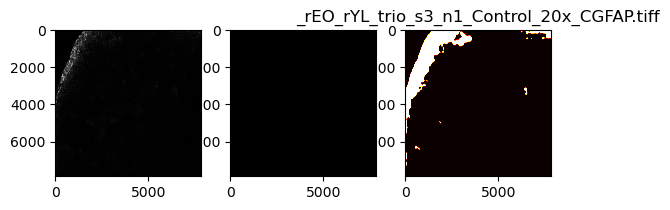

_rEO_rYL_trio_s3_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53676473.0       33.622870      24.018991          1.000000
1      2    755376.0       33.198796      24.325482          0.987387
2      3    660376.0       33.273399      24.089259          0.989606
3      4    565352.0       34.749172      25.031594          1.033498
4      5    470256.0       31.620200      22.306141          0.940437
5      6    375224.0       30.149116      20.864051          0.896685
6      7    280168.0       29.759501      20.042587          0.885097
7      8    185088.0       28.058199      18.525994          0.834497
8      9     90000.0       25.952767      17.305442          0.771878
9   9999   4821890.0       12.863286      17.786039          0.382575


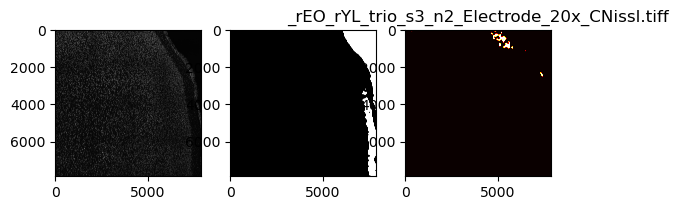

_rEO_rYL_trio_s3_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54078558.0       41.470015      30.182529          1.000000
1      2    755376.0       40.429332      29.836735          0.974905
2      3    660376.0       40.377341      29.263554          0.973651
3      4    565352.0       39.813621      28.922068          0.960058
4      5    470256.0       38.847141      27.924868          0.936753
5      6    375224.0       39.220156      28.013027          0.945747
6      7    280168.0       37.504312      25.995032          0.904372
7      8    185088.0       31.861601      22.792636          0.768305
8      9     90000.0       30.652078      19.011251          0.739138
9   9999   4309500.0       10.656456       6.533598          0.256968


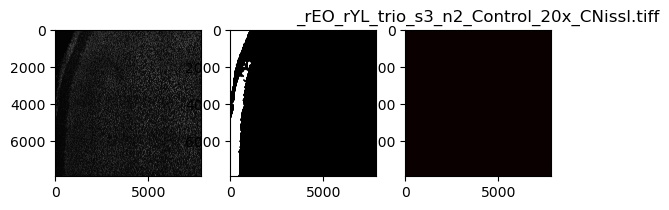

_rEO_rYL_trio_s3_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53730870.0       45.515124      66.060537          1.000000
1      2    755376.0       45.191679      66.477109          0.992894
2      3    660376.0       46.436454      69.264032          1.020242
3      4    565352.0       45.051775      62.522467          0.989820
4      5    470256.0       45.673099      66.927913          1.003471
5      6    375224.0       46.586228      65.669386          1.023533
6      7    280168.0       45.940978      66.816351          1.009356
7      8    185088.0       43.849088      53.793564          0.963396
8      9     90000.0       84.802667     200.749482          1.863176
9   9999   4767493.0       69.899142     144.452820          1.535734


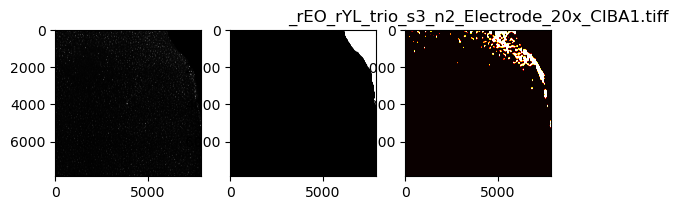

_rEO_rYL_trio_s3_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55430306.0       58.547972      86.813534          1.000000
1      2    755376.0       52.925776      76.968007          0.903973
2      3    660376.0       56.641837      87.412194          0.967443
3      4    565352.0       48.604986      66.228074          0.830174
4      5    470256.0       57.562755      83.854590          0.983172
5      6    375224.0       51.559500      81.987153          0.880637
6      7    280168.0       49.379729      70.529153          0.843406
7      8    185088.0       41.069291      49.704021          0.701464
8      9     90000.0       48.441689      70.587834          0.827385
9   9999   2957752.0       97.678343     186.314278          1.668347


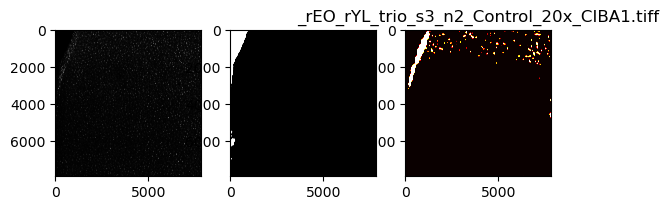

_rEO_rYL_trio_s3_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56804727.0       26.829696      35.289063          1.000000
1      2    755376.0       40.569367      46.681718          1.512107
2      3    660376.0       48.245097      55.606444          1.798198
3      4    565352.0       55.577992      65.982569          2.071510
4      5    470256.0       64.081368      70.998311          2.388449
5      6    375224.0       88.434903     101.227324          3.296157
6      7    280168.0      114.682569     112.298618          4.274464
7      8    185088.0      165.707474     144.904142          6.176271
8      9     90000.0      246.567244     191.807074          9.190087
9   9999   1693636.0      443.677597     443.755104         16.536810


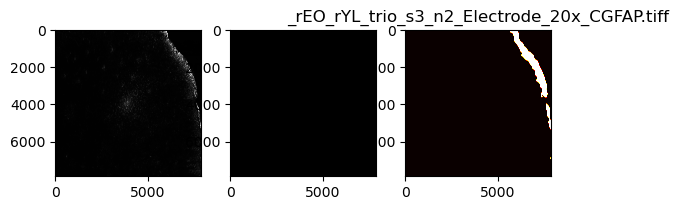

_rEO_rYL_trio_s3_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53980715.0       21.914623      17.452972          1.000000
1      2    755376.0       23.834542      20.405347          1.087609
2      3    660376.0       22.391291      13.769593          1.021751
3      4    565352.0       21.939478      13.239077          1.001134
4      5    470256.0       22.686260      16.843670          1.035211
5      6    375224.0       23.308179      17.917940          1.063590
6      7    280168.0       24.445326      20.096763          1.115480
7      8    185088.0       20.797048       8.939662          0.949003
8      9     90000.0       23.426744      12.845480          1.069001
9   9999   4407343.0      262.377363     384.243706         11.972707


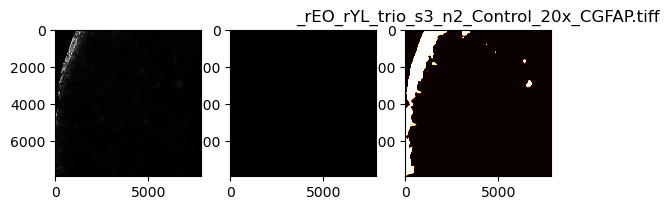

_rEO_rYL_trio_s4_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55382332.0       30.332718      20.639632          1.000000
1      2    755376.0       33.572144      22.667882          1.106796
2      3    660376.0       33.013253      22.296790          1.088371
3      4    565352.0       30.776338      20.577470          1.014625
4      5    470256.0       32.535038      21.607951          1.072605
5      6    375224.0       29.890385      18.485815          0.985417
6      7    280168.0       28.589343      17.557097          0.942525
7      8    185088.0       25.231063      15.779205          0.831810
8      9     90000.0       22.365733      14.301335          0.737347
9   9999   2935075.0       11.982249      16.381455          0.395027


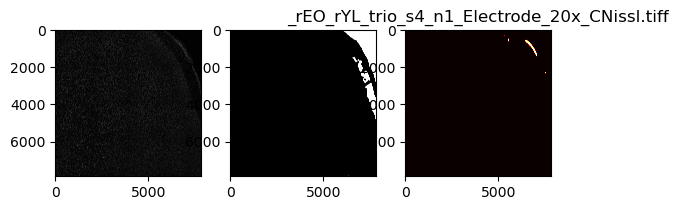

_rEO_rYL_trio_s4_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57606480.0       32.167115      21.576362          1.000000
1      2    755376.0       33.054275      22.503533          1.027580
2      3    660376.0       34.782931      22.950043          1.081320
3      4    565352.0       32.561104      21.562250          1.012248
4      5    470256.0       32.076567      21.182189          0.997185
5      6    375224.0       29.795077      19.626236          0.926259
6      7    280168.0       29.815461      19.364487          0.926893
7      8    185088.0       28.726017      19.238052          0.893024
8      9     90000.0       29.675189      18.871975          0.922532
9   9999    939054.0       18.131570      19.475041          0.563668


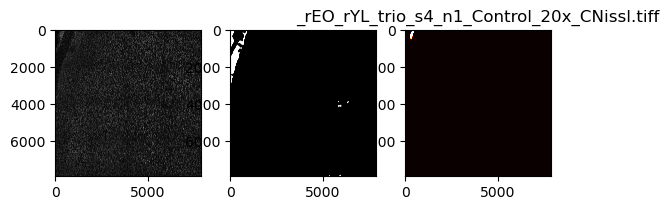

_rEO_rYL_trio_s4_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56121002.0       39.424904      55.048226          1.000000
1      2    755376.0       38.955079      54.651029          0.988083
2      3    660376.0       42.723986      62.590633          1.083680
3      4    565352.0       41.039788      58.928307          1.040961
4      5    470256.0       38.291061      52.779861          0.971240
5      6    375224.0       41.160875      53.453103          1.044032
6      7    280168.0       39.820526      56.953404          1.010035
7      8    185088.0       47.311003      58.894829          1.200028
8      9     90000.0       38.429222      37.650635          0.974745
9   9999   2196405.0       33.758952      94.632568          0.856285


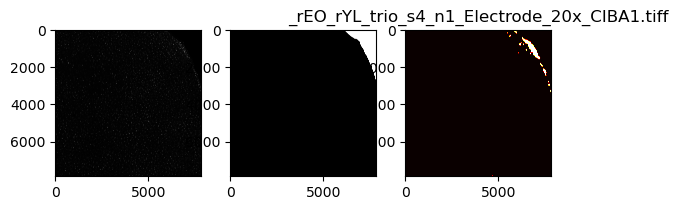

_rEO_rYL_trio_s4_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58092809.0       42.041991      56.687460          1.000000
1      2    755376.0       39.529416      51.184510          0.940237
2      3    660376.0       41.162756      58.883394          0.979087
3      4    565352.0       41.584551      60.817979          0.989119
4      5    470256.0       39.117834      50.054804          0.930447
5      6    375224.0       41.612767      55.257382          0.989791
6      7    280168.0       41.482568      59.593270          0.986694
7      8    185088.0       37.382526      49.477015          0.889171
8      9     90000.0       44.360889      66.475746          1.055157
9   9999    452725.0       97.225536     138.781468          2.312582


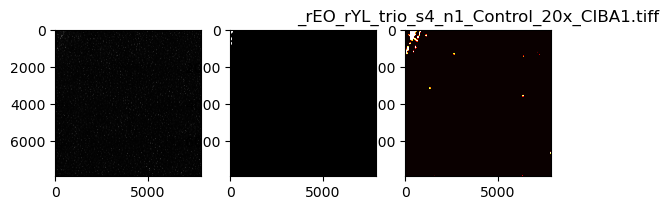

_rEO_rYL_trio_s4_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56643556.0       23.188432      22.821442          1.000000
1      2    755376.0       38.096106      37.410024          1.642893
2      3    660376.0       43.451250      41.898897          1.873833
3      4    565352.0       42.883368      41.888843          1.849343
4      5    470256.0       49.759076      51.138288          2.145858
5      6    375224.0       62.763469      63.669512          2.706672
6      7    280168.0       87.153729      70.491390          3.758500
7      8    185088.0      107.797080      72.210925          4.648744
8      9     90000.0      133.064689      73.776644          5.738408
9   9999   1673851.0      371.846873     427.680313         16.035879


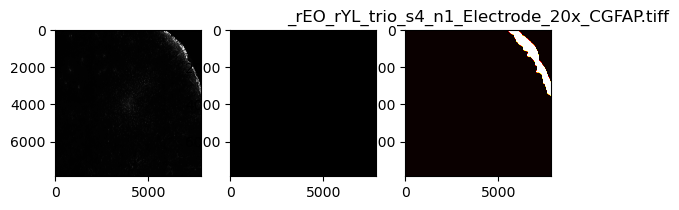

_rEO_rYL_trio_s4_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57196961.0       18.911293      11.218650          1.000000
1      2    755376.0       19.158959      10.574538          1.013096
2      3    660376.0       20.119608      13.005389          1.063894
3      4    565352.0       19.616729      10.824291          1.037302
4      5    470256.0       19.275201      13.113363          1.019243
5      6    375224.0       17.591004       4.539272          0.930185
6      7    280168.0       19.348687      14.101422          1.023129
7      8    185088.0       19.088093       9.303057          1.009349
8      9     90000.0       18.355278       7.549304          0.970599
9   9999   1348573.0      212.139785     313.234612         11.217624


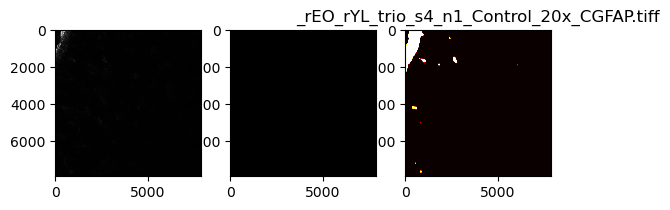

_rEO_rYL_trio_s4_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54694507.0       27.759236      17.012623          1.000000
1      2    755376.0       30.142777      18.017954          1.085865
2      3    660376.0       29.999637      17.686710          1.080708
3      4    565352.0       29.496128      17.125003          1.062570
4      5    470256.0       29.288460      16.517508          1.055089
5      6    375224.0       25.605159      14.661033          0.922401
6      7    280168.0       27.476860      15.523879          0.989828
7      8    185088.0       25.187549      14.147752          0.907357
8      9     90000.0       24.701867      12.943370          0.889861
9   9999   3914036.0       12.865226       7.537276          0.463458


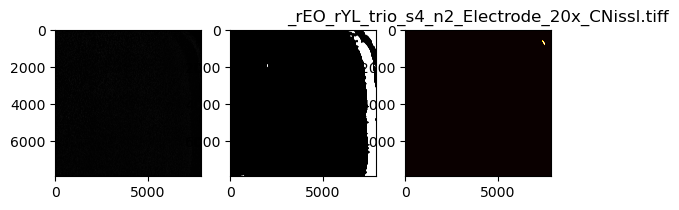

_rEO_rYL_trio_s4_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55083372.0       27.050487      16.298921          1.000000
1      2    755376.0       27.775185      16.170737          1.026791
2      3    660376.0       26.239797      14.853718          0.970030
3      4    565352.0       27.527160      15.823942          1.017622
4      5    470256.0       26.970193      14.749117          0.997032
5      6    375224.0       26.405867      14.857525          0.976170
6      7    280168.0       25.093844      13.757639          0.927667
7      8    185088.0       23.633347      12.400107          0.873675
8      9     90000.0       22.156956      12.149962          0.819096
9   9999   3588195.0       12.168842       7.271042          0.449857


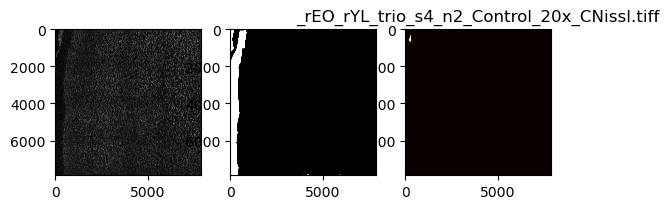

_rEO_rYL_trio_s4_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58195483.0       36.993118      47.708586          1.000000
1      2    755376.0       42.265192      52.097738          1.142515
2      3    660376.0       41.972220      55.174566          1.134595
3      4    565352.0       46.020232      64.019051          1.244021
4      5    470256.0       43.185656      55.189006          1.167397
5      6    375224.0       45.824630      58.217009          1.238734
6      7    280168.0       56.951715      67.638168          1.539522
7      8    185088.0       59.366345      66.253746          1.604794
8      9     90000.0       81.989933      63.336230          2.216356
9   9999    413060.0       87.422842     177.782192          2.363219


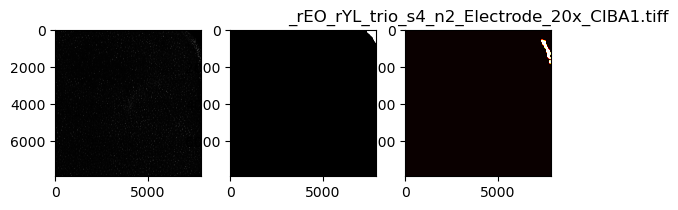

_rEO_rYL_trio_s4_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58190150.0       33.736593      40.321013          1.000000
1      2    755376.0       33.685399      38.954003          0.998483
2      3    660376.0       33.516600      41.621384          0.993479
3      4    565352.0       35.238342      46.857997          1.044514
4      5    470256.0       34.372450      41.125359          1.018848
5      6    375224.0       33.740949      40.396233          1.000129
6      7    280168.0       34.143039      42.042379          1.012048
7      8    185088.0       31.717270      34.420592          0.940144
8      9     90000.0       30.350956      35.595555          0.899645
9   9999    481417.0       58.791250     102.915547          1.742655


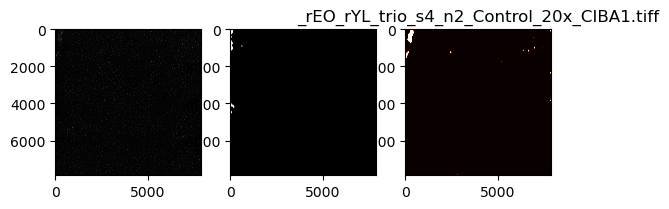

_rEO_rYL_trio_s4_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57508641.0       27.022756      29.209992          1.000000
1      2    755376.0       38.755817      39.850641          1.434192
2      3    660376.0       40.794659      39.069911          1.509641
3      4    565352.0       43.169625      42.911707          1.597529
4      5    470256.0       49.407888      46.852688          1.828381
5      6    375224.0       63.697154      60.174811          2.357167
6      7    280168.0       83.857853      63.916556          3.103231
7      8    185088.0      128.435328      83.632200          4.752858
8      9     90000.0      160.821267      87.789243          5.951327
9   9999   1099902.0      341.086893     346.723454         12.622210


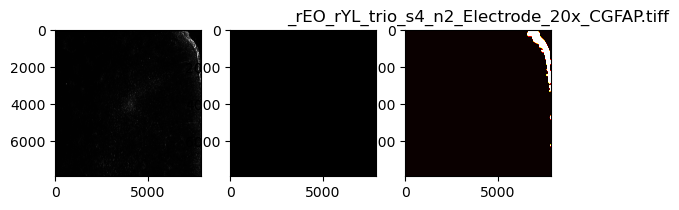

_rEO_rYL_trio_s4_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55491984.0       18.370812      10.277809          1.000000
1      2    755376.0       19.302817       9.145066          1.050733
2      3    660376.0       18.825346       7.721054          1.024742
3      4    565352.0       19.254613       9.121269          1.048109
4      5    470256.0       19.536151       8.358879          1.063434
5      6    375224.0       19.052894       8.941433          1.037129
6      7    280168.0       18.230076       6.581928          0.992339
7      8    185088.0       17.277663       5.362807          0.940495
8      9     90000.0       16.688533       6.365957          0.908427
9   9999   3179583.0      109.469405     165.348365          5.958877


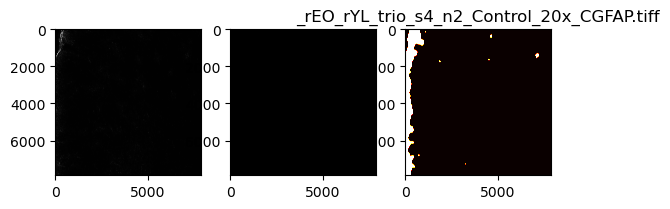

_rEO_rYL_trio_s5_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54336478.0       30.131773      20.474463          1.000000
1      2    755376.0       32.881734      20.612368          1.091265
2      3    660376.0       33.013523      20.482695          1.095638
3      4    565352.0       32.955677      20.148111          1.093718
4      5    470256.0       32.157589      20.950401          1.067232
5      6    375224.0       29.931638      18.012017          0.993358
6      7    280168.0       27.422739      16.292419          0.910094
7      8    185088.0       28.776987      16.403088          0.955038
8      9     90000.0       24.489922      13.812729          0.812761
9   9999   4114700.0       12.661629       6.496211          0.420209


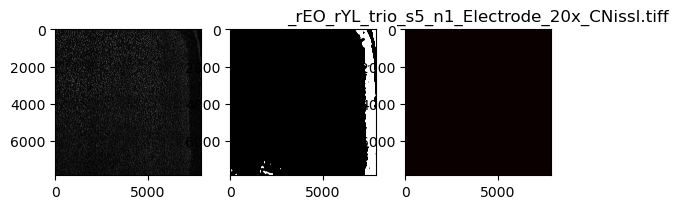

_rEO_rYL_trio_s5_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55321340.0       29.394356      19.214176          1.000000
1      2    755376.0       29.617928      18.111789          1.007606
2      3    660376.0       29.713718      17.366462          1.010865
3      4    565352.0       30.137594      17.495371          1.025285
4      5    470256.0       29.092607      16.676674          0.989734
5      6    375224.0       28.500426      15.905990          0.969588
6      7    280168.0       27.594729      15.512453          0.938776
7      8    185088.0       26.736974      15.245196          0.909595
8      9     90000.0       25.018678      13.647306          0.851139
9   9999   3287203.0       11.669565       5.372182          0.397000


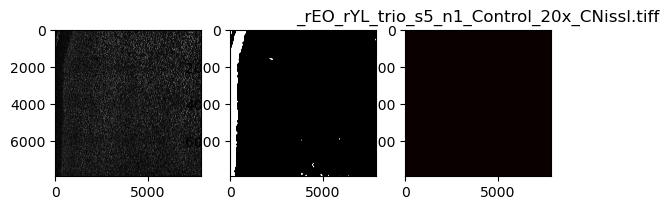

_rEO_rYL_trio_s5_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58439482.0       43.567069      65.950900          1.000000
1      2    755376.0       51.123087      72.341859          1.173434
2      3    660376.0       54.226813      83.261279          1.244674
3      4    565352.0       52.679479      73.262684          1.209158
4      5    470256.0       53.957763      77.079912          1.238499
5      6    375224.0       55.703356      80.302282          1.278566
6      7    280168.0       54.737504      78.694039          1.256396
7      8    185088.0       58.349196      79.208591          1.339296
8      9     90000.0       62.506444      73.693134          1.434718
9   9999     11696.0      283.690834     349.063697          6.511589


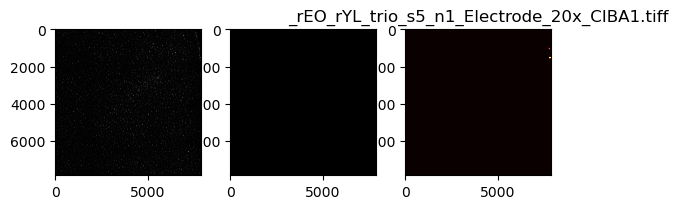

_rEO_rYL_trio_s5_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58445483.0       39.510704      53.859183          1.000000
1      2    755376.0       38.674729      50.283208          0.978842
2      3    660376.0       40.878378      53.335124          1.034615
3      4    565352.0       38.280763      52.413945          0.968871
4      5    470256.0       40.460802      53.228495          1.024047
5      6    375224.0       38.408284      47.992013          0.972098
6      7    280168.0       36.619835      46.008450          0.926833
7      8    185088.0       33.043055      44.714964          0.836306
8      9     90000.0       33.548978      38.118025          0.849111
9   9999    163060.0      106.296799     178.336156          2.690329


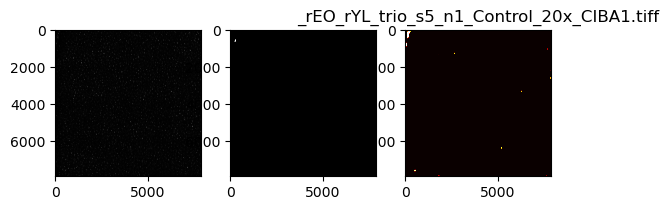

_rEO_rYL_trio_s5_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57634155.0       36.520676      49.166263          1.000000
1      2    755376.0       46.858673      58.534926          1.283072
2      3    660376.0       51.578180      60.192927          1.412301
3      4    565352.0       59.172503      83.654168          1.620247
4      5    470256.0       64.426719      84.151572          1.764116
5      6    375224.0       79.428845      94.475682          2.174901
6      7    280168.0      106.682733     109.520679          2.921160
7      8    185088.0      136.055282     115.570109          3.725432
8      9     90000.0      159.018067     116.378462          4.354193
9   9999    817023.0      323.141875     389.940575          8.848190


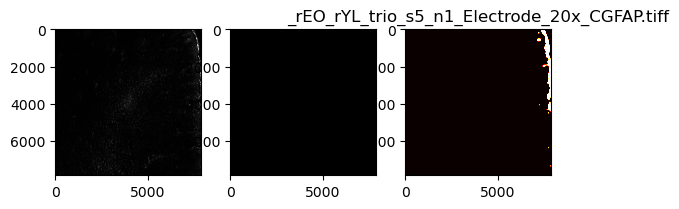

_rEO_rYL_trio_s5_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56196728.0       22.517834      18.015166          1.000000
1      2    755376.0       26.314204      22.431922          1.168594
2      3    660376.0       24.954150      21.906747          1.108195
3      4    565352.0       24.635135      23.299314          1.094028
4      5    470256.0       21.466252      11.945680          0.953300
5      6    375224.0       22.967886      19.221791          1.019986
6      7    280168.0       22.417724      15.448029          0.995554
7      8    185088.0       20.952180      13.087191          0.930470
8      9     90000.0       20.761967      11.024491          0.922023
9   9999   2411815.0       97.129573     146.014390          4.313451


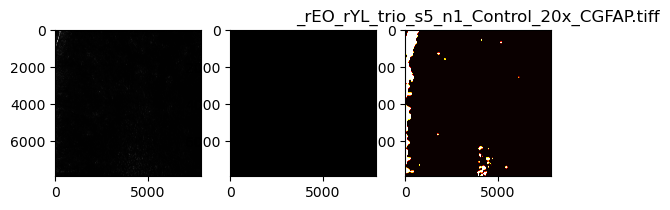

_rEO_rYL_trio_s5_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55452042.0       25.646833      15.977826          1.000000
1      2    755376.0       26.430449      14.977529          1.030554
2      3    660376.0       27.202965      15.655820          1.060675
3      4    565352.0       26.854103      14.738787          1.047073
4      5    470256.0       25.731859      13.552146          1.003315
5      6    375224.0       25.135559      13.203539          0.980065
6      7    280168.0       24.145299      12.779999          0.941453
7      8    185088.0       22.874498      11.772195          0.891903
8      9     90000.0       22.196589      11.020861          0.865471
9   9999   3219525.0       11.098799       4.299012          0.432755


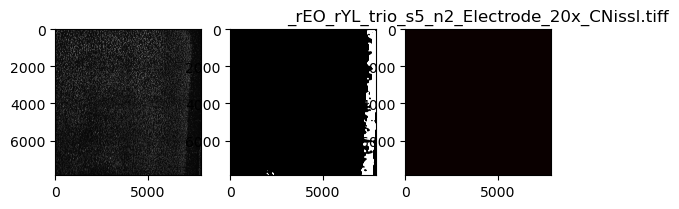

_rEO_rYL_trio_s5_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55112175.0       26.810848      16.431075          1.000000
1      2    755376.0       26.828029      15.399054          1.000641
2      3    660376.0       27.656537      15.392723          1.031543
3      4    565352.0       27.935711      15.255313          1.041956
4      5    470256.0       26.638548      14.314417          0.993574
5      6    375224.0       25.579147      13.460038          0.954060
6      7    280168.0       25.196514      13.189415          0.939788
7      8    185088.0       24.449662      12.339431          0.911932
8      9     90000.0       23.136167      13.147880          0.862941
9   9999   3417605.0       11.129670       5.466509          0.415118


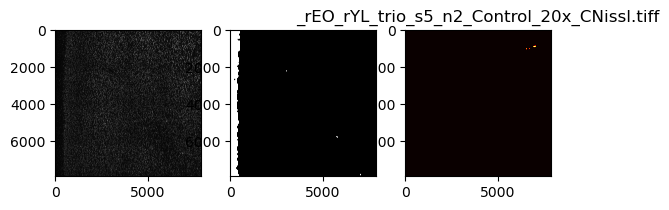

_rEO_rYL_trio_s5_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58642215.0       37.731646      51.218988          1.000000
1      2    755376.0       39.772946      48.086473          1.054100
2      3    660376.0       43.301831      55.687331          1.147626
3      4    565352.0       39.103138      48.263635          1.036349
4      5    470256.0       41.650643      53.160166          1.103865
5      6    375224.0       47.449955      61.865545          1.257564
6      7    280168.0       44.711277      57.247909          1.184981
7      8    185088.0       41.740740      53.442933          1.106253
8      9     90000.0       39.077000      40.965716          1.035656
9   9999     29352.0       75.256201     181.532966          1.994511


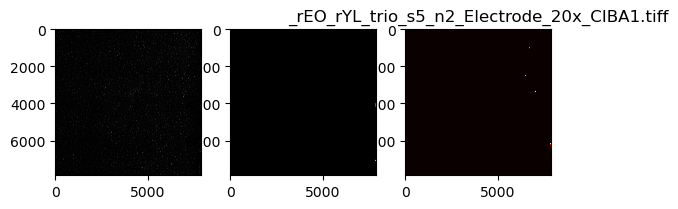

_rEO_rYL_trio_s5_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58340261.0       35.442530      45.284368          1.000000
1      2    755376.0       35.188312      41.582265          0.992827
2      3    660376.0       36.296352      49.388472          1.024090
3      4    565352.0       35.598956      43.401055          1.004414
4      5    470256.0       36.894885      48.621021          1.040978
5      6    375224.0       33.381116      40.131083          0.941838
6      7    280168.0       33.260594      40.840669          0.938437
7      8    185088.0       33.888172      43.909516          0.956144
8      9     90000.0       35.540733      48.239261          1.002771
9   9999    189519.0       40.133079      98.675296          1.132342


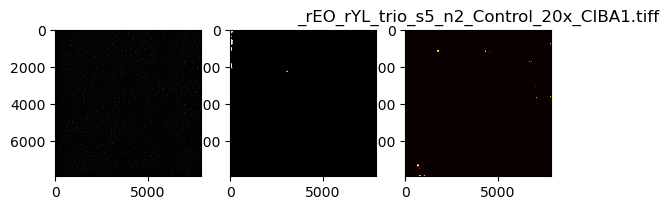

_rEO_rYL_trio_s5_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58357592.0       42.049611      54.466255          1.000000
1      2    755376.0       56.747080      72.552299          1.349527
2      3    660376.0       57.655257      73.220994          1.371125
3      4    565352.0       63.035201      75.523214          1.499067
4      5    470256.0       75.252548      93.475985          1.789613
5      6    375224.0       85.943724     100.781827          2.043865
6      7    280168.0      105.492576     106.668123          2.508765
7      8    185088.0      116.978572     110.952191          2.781918
8      9     90000.0      115.077944      84.873319          2.736718
9   9999    313975.0      300.197433     318.834788          7.139125


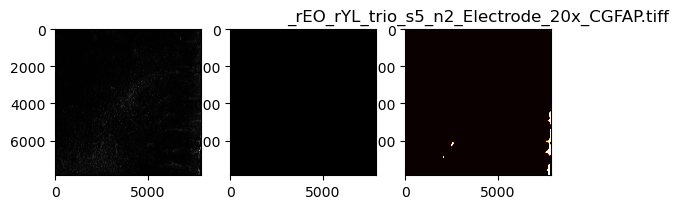

_rEO_rYL_trio_s5_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54577356.0       24.585224      22.428918          1.000000
1      2    755376.0       24.547699      22.007356          0.998474
2      3    660376.0       22.653284      17.332851          0.921419
3      4    565352.0       22.870421      16.512144          0.930251
4      5    470256.0       21.298104      13.139089          0.866297
5      6    375224.0       22.062072      15.838166          0.897371
6      7    280168.0       21.057048      13.618034          0.856492
7      8    185088.0       19.400410      11.562729          0.789109
8      9     90000.0       18.932989       7.687941          0.770096
9   9999   3952424.0       88.634511      83.496812          3.605194


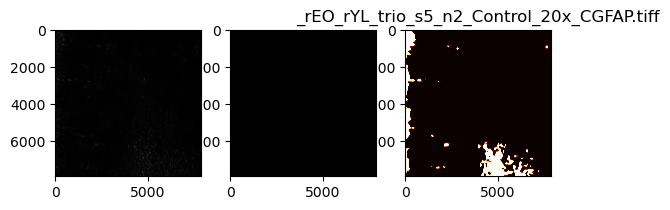

_rEO_rYL_trio_s6_n2_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54868373.0       34.887527      26.073041          1.000000
1      2    755376.0       36.255575      24.415066          1.039213
2      3    660376.0       35.182485      22.300579          1.008455
3      4    565352.0       34.412552      21.897051          0.986386
4      5    470256.0       34.765717      22.066741          0.996508
5      6    375224.0       33.834299      20.157186          0.969811
6      7    280168.0       32.027266      19.994038          0.918015
7      8    185088.0       31.870905      21.452417          0.913533
8      9     90000.0       29.217856      16.559547          0.837487
9   9999   3653512.0       12.872130      11.517440          0.368961


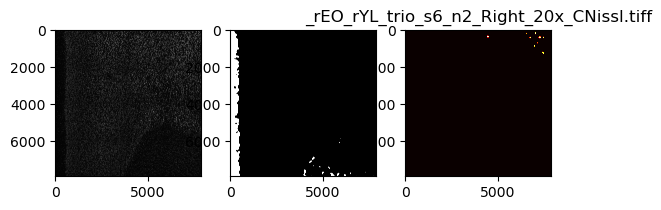

_rEO_rYL_trio_s6_n2_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58474753.0       28.407103      20.163108          1.000000
1      2    755376.0       30.697267      19.856631          1.080619
2      3    660376.0       31.300449      19.772811          1.101853
3      4    565352.0       29.974851      18.205942          1.055189
4      5    470256.0       29.077875      17.620037          1.023613
5      6    375224.0       28.039814      16.206715          0.987071
6      7    280168.0       28.165676      16.880918          0.991501
7      8    185088.0       24.946091      14.812116          0.878164
8      9     90000.0       24.527133      14.699568          0.863416


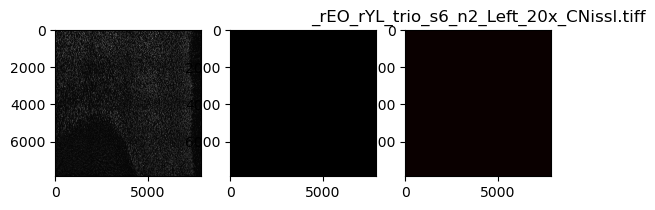

_rEO_rYL_trio_s6_n2_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58456943.0       51.733836      84.164743          1.000000
1      2    755376.0       53.864859      83.930889          1.041192
2      3    660376.0       60.853605     103.707670          1.176282
3      4    565352.0       56.518744      83.939345          1.092491
4      5    470256.0       57.059950      94.424479          1.102952
5      6    375224.0       52.473776      76.650118          1.014303
6      7    280168.0       60.351453      93.044802          1.166576
7      8    185088.0       60.793120      90.886921          1.175113
8      9     90000.0       50.781089      64.053521          0.981584
9   9999     64942.0      176.772258     342.511174          3.416956


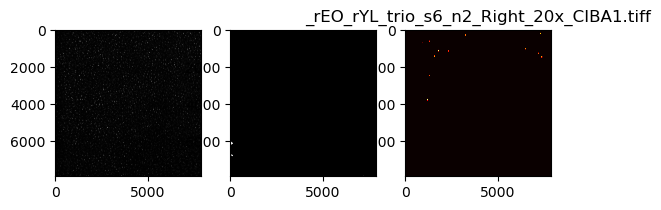

_rEO_rYL_trio_s6_n2_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58434191.0       43.439916      68.047710          1.000000
1      2    755376.0       43.520925      69.192837          1.001865
2      3    660376.0       46.023933      77.580407          1.059485
3      4    565352.0       42.621445      65.914132          0.981159
4      5    470256.0       42.131201      62.784497          0.969873
5      6    375224.0       41.403069      66.002094          0.953111
6      7    280168.0       38.981636      63.357288          0.897369
7      8    185088.0       37.810323      44.338704          0.870405
8      9     90000.0       30.764811      34.012701          0.708215
9   9999     40562.0      325.084340     368.518501          7.483540


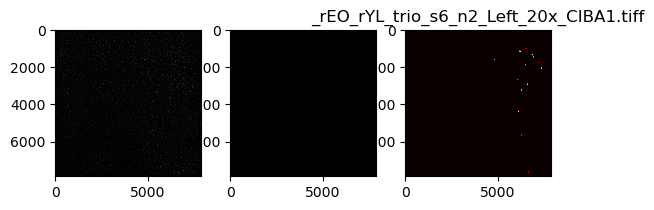

_rEO_rYL_trio_s6_n2_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58521885.0       59.932040      85.429342          1.000000
1      2    755376.0      100.675518     154.309047          1.679828
2      3    660376.0      106.647384     163.730090          1.779472
3      4    565352.0      121.701880     175.191426          2.030665
4      5    470256.0      140.415542     188.519139          2.342913
5      6    375224.0      154.691733     191.588592          2.581119
6      7    280168.0      169.326415     197.674081          2.825307
7      8    185088.0      127.789019     145.961949          2.132232
8      9     90000.0       79.978711      94.529168          1.334490


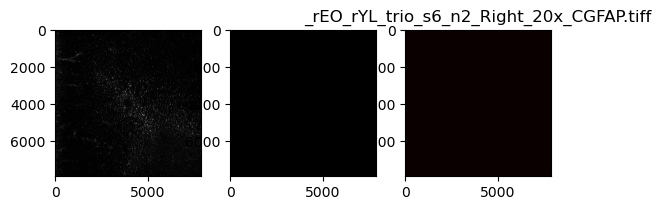

_rEO_rYL_trio_s6_n2_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58445617.0       48.236188      66.754876          1.000000
1      2    755376.0       45.832416      69.832273          0.950167
2      3    660376.0       45.745262      74.407428          0.948360
3      4    565352.0       40.201275      55.403306          0.833426
4      5    470256.0       39.987966      52.023931          0.829003
5      6    375224.0       38.701970      50.262126          0.802343
6      7    280168.0       32.908880      35.144256          0.682245
7      8    185088.0       37.043385      42.637483          0.767958
8      9     90000.0       33.451189      44.606193          0.693487
9   9999     29136.0      404.086010     329.675657          8.377238


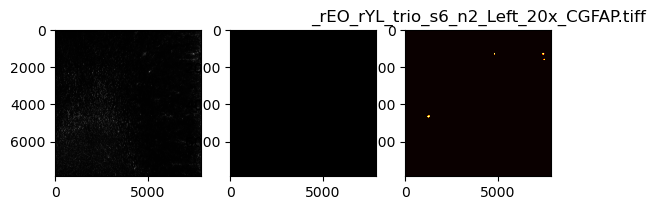

_rEO_rYL_trio_s6_n1_Right_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54244765.0       30.928856      22.259454          1.000000
1      2    755376.0       32.756392      21.299687          1.059088
2      3    660376.0       31.472532      20.139224          1.017578
3      4    565352.0       31.665180      19.674740          1.023807
4      5    470256.0       30.458778      18.775178          0.984801
5      6    375224.0       31.469773      18.596900          1.017489
6      7    280168.0       30.753983      18.668858          0.994346
7      8    185088.0       29.862692      17.808590          0.965529
8      9     90000.0       23.166733      13.595259          0.749033
9   9999   4143194.0       11.639273       6.490424          0.376324


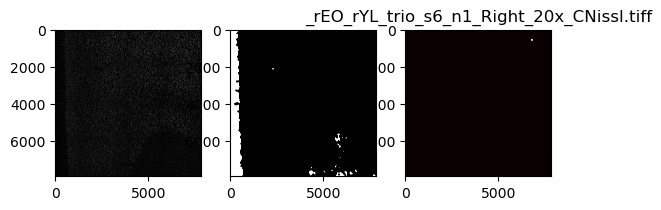

_rEO_rYL_trio_s6_n1_Left_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55355334.0       30.167436      21.014249          1.000000
1      2    755376.0       31.245458      21.474796          1.035735
2      3    660376.0       29.290842      19.133803          0.970942
3      4    565352.0       29.868169      19.415058          0.990080
4      5    470256.0       29.085541      18.967589          0.964137
5      6    375224.0       29.267821      17.954319          0.970179
6      7    280168.0       29.065878      16.951179          0.963485
7      8    185088.0       27.279575      16.371504          0.904272
8      9     90000.0       25.439489      14.251190          0.843276
9   9999   3174461.0       11.725687       5.459375          0.388687


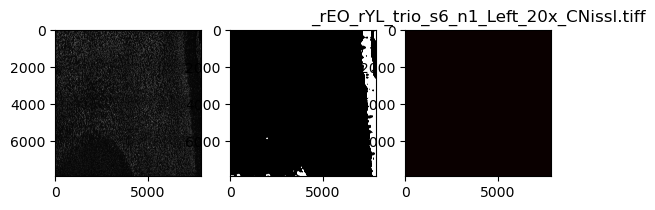

_rEO_rYL_trio_s6_n1_Right_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58351011.0       51.776916      84.647027          1.000000
1      2    755376.0       58.528485      94.648480          1.130397
2      3    660376.0       56.694341      93.178126          1.094973
3      4    565352.0       61.276631      99.228256          1.183474
4      5    470256.0       59.762166     101.270481          1.154224
5      6    375224.0       61.481195      91.673176          1.187425
6      7    280168.0       69.974405     115.649842          1.351460
7      8    185088.0       61.963742      92.223133          1.196745
8      9     90000.0       55.077878      85.488209          1.063754
9   9999     36948.0      109.966764     257.069030          2.123857


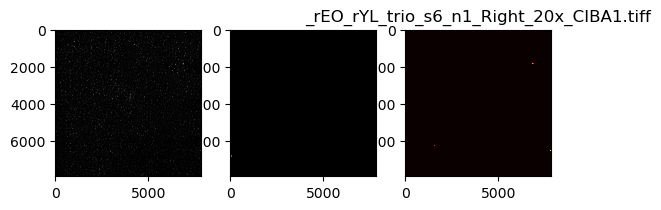

_rEO_rYL_trio_s6_n1_Left_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58477534.0       49.148100      81.281730          1.000000
1      2    755376.0       47.953296      78.365909          0.975690
2      3    660376.0       50.259554      85.444645          1.022614
3      4    565352.0       44.644333      68.649607          0.908363
4      5    470256.0       51.803114      77.789009          1.054021
5      6    375224.0       45.713278      67.527230          0.930113
6      7    280168.0       44.153676      71.134828          0.898380
7      8    185088.0       48.990853      75.353783          0.996801
8      9     90000.0       45.866000      69.763224          0.933220
9   9999     52261.0      138.996077     300.400701          2.828107


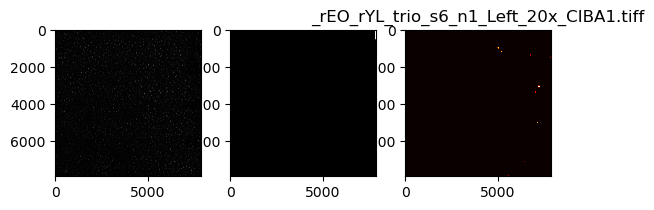

_rEO_rYL_trio_s6_n1_Right_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58387959.0       59.401955      87.614915          1.000000
1      2    755376.0       88.209087     137.886183          1.484953
2      3    660376.0       84.016294     119.955469          1.414369
3      4    565352.0       99.160010     145.859132          1.669305
4      5    470256.0      118.059008     172.262025          1.987460
5      6    375224.0       99.891979     128.814435          1.681628
6      7    280168.0      118.426762     161.651218          1.993651
7      8    185088.0      135.915078     173.144544          2.288057
8      9     90000.0      130.434956     147.548977          2.195802


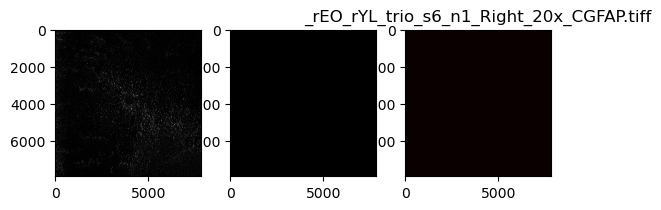

_rEO_rYL_trio_s6_n1_Left_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58214291.0       46.749829      69.811041          1.000000
1      2    755376.0       47.490475      80.522127          1.015843
2      3    660376.0       41.195337      60.843222          0.881187
3      4    565352.0       42.033073      63.767835          0.899106
4      5    470256.0       36.491626      49.884086          0.780572
5      6    375224.0       41.414480      62.409065          0.885874
6      7    280168.0       38.519738      61.442503          0.823955
7      8    185088.0       28.655612      34.877056          0.612957
8      9     90000.0       28.693256      27.195258          0.613762
9   9999    315504.0      389.950384     481.561365          8.341215


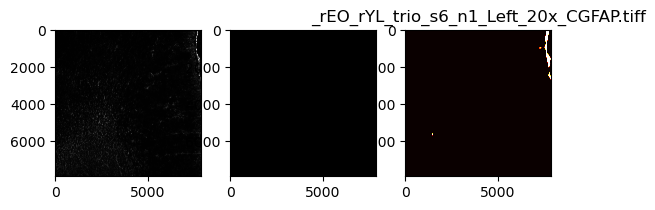

_rEO_rYL_quad_s1_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55388360.0       24.933425      16.862234          1.000000
1      2    822632.0       27.917569      19.522702          1.119685
2      3    727672.0       27.995686      19.254514          1.122818
3      4    632560.0       29.092625      20.035053          1.166812
4      5    537488.0       26.957411      18.358230          1.081176
5      6    442448.0       26.194732      18.106893          1.050587
6      7    347360.0       26.150351      17.962421          1.048807
7      8    252312.0       22.964924      14.279353          0.921050
8      9    157272.0       22.286942      13.401513          0.893858
9   9999   2691475.0        9.187165       3.872204          0.368468


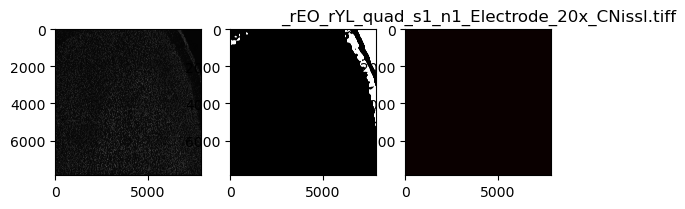

_rEO_rYL_quad_s1_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56078505.0       25.889333      17.501239          1.000000
1      2    822632.0       29.584722      23.205197          1.142738
2      3    727672.0       29.038686      21.589756          1.121647
3      4    632560.0       29.443033      22.712828          1.137265
4      5    537488.0       27.780123      20.188143          1.073034
5      6    442448.0       26.347297      19.939152          1.017689
6      7    347360.0       26.546053      17.877364          1.025366
7      8    252312.0       25.539126      18.198305          0.986473
8      9    157272.0       24.285105      17.398098          0.938035
9   9999   2001330.0       10.357363       3.876501          0.400063


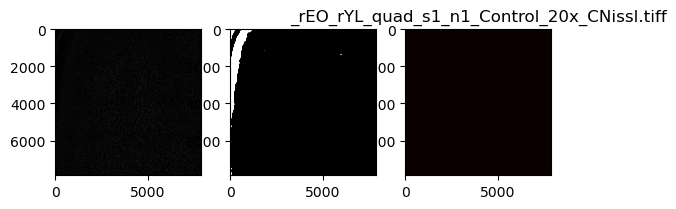

_rEO_rYL_quad_s1_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56623492.0       64.665636      89.134294          1.000000
1      2    822632.0       77.399647     110.149624          1.196921
2      3    727672.0       78.993898     116.256979          1.221575
3      4    632560.0       75.858006     110.619460          1.173081
4      5    537488.0       80.268866     116.353557          1.241291
5      6    442448.0       78.324400     102.244632          1.211221
6      7    347360.0       82.390249     124.081677          1.274096
7      8    252312.0       76.690134     104.891133          1.185949
8      9    157272.0       68.200449      69.950471          1.054663
9   9999   1456343.0       62.527608     182.990345          0.966937


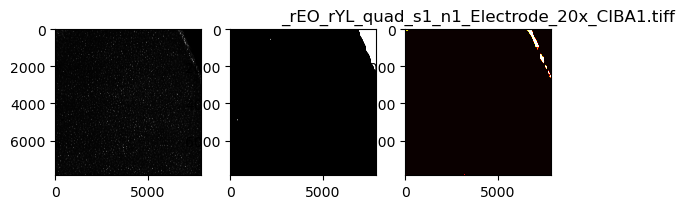

_rEO_rYL_quad_s1_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57306118.0       62.241279      80.934037          1.000000
1      2    822632.0       66.470154      88.728758          1.067943
2      3    727672.0       67.642302      85.565887          1.086776
3      4    632560.0       64.488309      92.112258          1.036102
4      5    537488.0       61.849319      81.019458          0.993703
5      6    442448.0       62.187823      78.546777          0.999141
6      7    347360.0       64.499093      95.279974          1.036275
7      8    252312.0       57.600320      78.211702          0.925436
8      9    157272.0       55.199908      74.130185          0.886870
9   9999    773717.0       83.749500     171.121291          1.345562


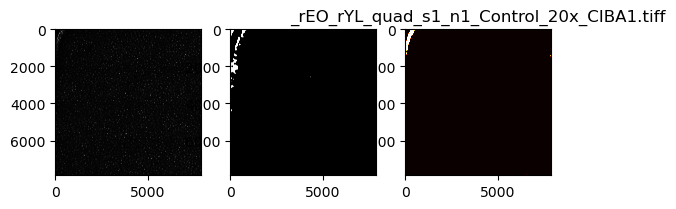

_rEO_rYL_quad_s1_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57852677.0       32.502775      51.764120          1.000000
1      2    822632.0       59.062933      76.835655          1.817166
2      3    727672.0       68.603538      92.079467          2.110698
3      4    632560.0       78.423561     100.987685          2.412827
4      5    537488.0       91.499466     114.924225          2.815128
5      6    442448.0      116.366628     136.056343          3.580206
6      7    347360.0      170.209152     184.179824          5.236758
7      8    252312.0      243.893235     219.427211          7.503767
8      9    157272.0      441.239254     385.117753         13.575433
9   9999    227158.0      807.549521     609.176054         24.845556


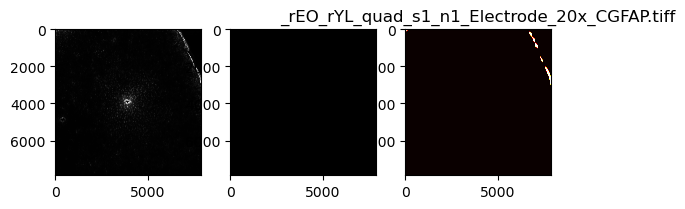

_rEO_rYL_quad_s1_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56294821.0       24.608878      21.848558          1.000000
1      2    822632.0       22.489624      16.401325          0.913883
2      3    727672.0       22.403139      19.002044          0.910368
3      4    632560.0       20.356391      12.790568          0.827197
4      5    537488.0       20.424227      14.926667          0.829954
5      6    442448.0       22.315264      17.191010          0.906797
6      7    347360.0       21.865730      11.263548          0.888530
7      8    252312.0       20.416746      12.169185          0.829650
8      9    157272.0       21.592814      12.024308          0.877440
9   9999   1785014.0      174.848128     280.092846          7.105083


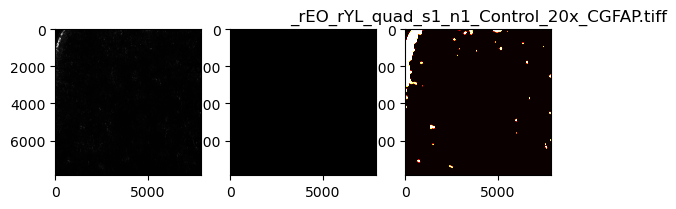

_rEO_rYL_quad_s1_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56135296.0       25.606176      16.924887          1.000000
1      2    822632.0       27.521333      18.621722          1.074793
2      3    727672.0       27.311612      18.411889          1.066602
3      4    632560.0       26.930503      17.483496          1.051719
4      5    537488.0       25.680836      16.611123          1.002916
5      6    442448.0       24.705703      15.810884          0.964834
6      7    347360.0       24.978135      15.406785          0.975473
7      8    252312.0       22.686158      13.133627          0.885964
8      9    157272.0       20.285963      11.867372          0.792229
9   9999   1952091.0       10.725598       8.513593          0.418868


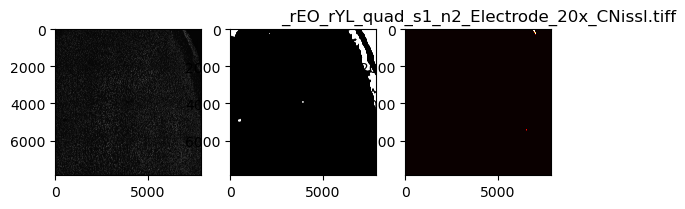

_rEO_rYL_quad_s1_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57592009.0       30.804793      21.397164          1.000000
1      2    822632.0       33.385113      26.195246          1.083764
2      3    727672.0       33.817049      25.905147          1.097785
3      4    632560.0       31.497532      24.170352          1.022488
4      5    537488.0       31.735687      23.329891          1.030219
5      6    442448.0       30.989420      23.357105          1.005993
6      7    347360.0       28.213744      20.732530          0.915888
7      8    252312.0       31.661602      22.644395          1.027814
8      9    157272.0       27.019469      20.292251          0.877119
9   9999    424802.0       12.991980       7.065105          0.421752


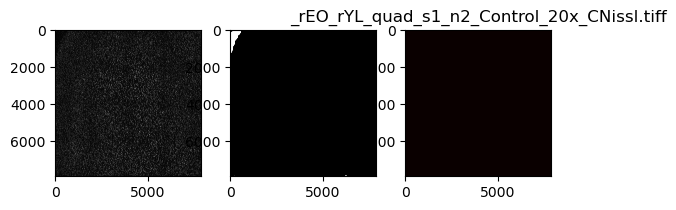

_rEO_rYL_quad_s1_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57055263.0       40.973210      48.986051          1.000000
1      2    822632.0       46.234202      58.520878          1.128401
2      3    727672.0       45.388722      54.069048          1.107766
3      4    632560.0       45.905713      60.729221          1.120384
4      5    537488.0       44.372274      49.406254          1.082958
5      6    442448.0       46.245708      60.303949          1.128682
6      7    347360.0       50.291971      61.549226          1.227435
7      8    252312.0       43.284148      52.619253          1.056401
8      9    157272.0       35.148933      23.344555          0.857852
9   9999   1024572.0       54.907757     129.147232          1.340089


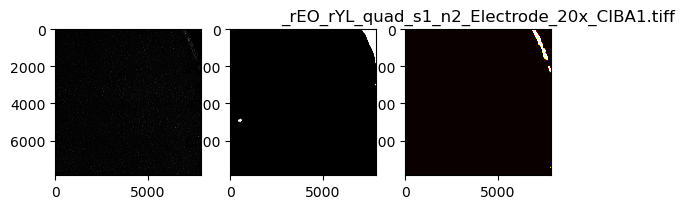

_rEO_rYL_quad_s1_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57968914.0       49.291376      62.096464          1.000000
1      2    822632.0       47.842747      60.952491          0.970611
2      3    727672.0       45.650382      54.472304          0.926133
3      4    632560.0       49.695869      68.838351          1.008206
4      5    537488.0       46.025359      58.265837          0.933741
5      6    442448.0       48.686833      66.886714          0.987735
6      7    347360.0       42.884647      52.099366          0.870023
7      8    252312.0       45.179330      63.283620          0.916577
8      9    157272.0       44.250769      59.422625          0.897739
9   9999     47897.0      164.963401     241.101250          3.346699


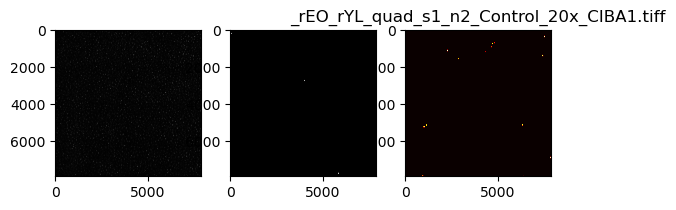

_rEO_rYL_quad_s1_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57787699.0       25.879095      36.162632          1.000000
1      2    822632.0       42.935123      43.351788          1.659066
2      3    727672.0       48.373444      49.774341          1.869209
3      4    632560.0       61.284721      64.167910          2.368117
4      5    537488.0       82.271280      84.313477          3.179063
5      6    442448.0      116.477143     114.818368          4.500820
6      7    347360.0      172.273071     143.096291          6.656843
7      8    252312.0      232.107363     159.113130          8.968913
8      9    157272.0      469.801757     337.384237         18.153716
9   9999    292136.0      700.253255     469.326708         27.058645


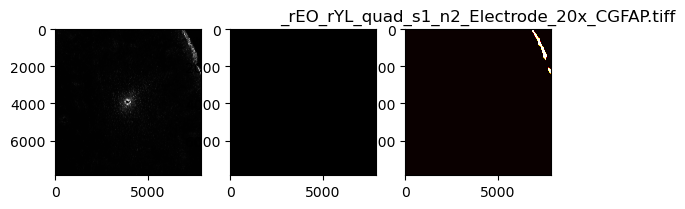

_rEO_rYL_quad_s1_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57084383.0       22.183187      16.688284          1.000000
1      2    822632.0       20.336048      13.937863          0.916733
2      3    727672.0       17.740368       8.673183          0.799721
3      4    632560.0       17.503527       9.119026          0.789045
4      5    537488.0       17.327014       7.613463          0.781088
5      6    442448.0       18.906805       9.058269          0.852303
6      7    347360.0       20.108375      10.029067          0.906469
7      8    252312.0       24.870529      33.754592          1.121143
8      9    157272.0       23.184616      22.657502          1.045144
9   9999    932428.0       94.328008      87.110950          4.252230


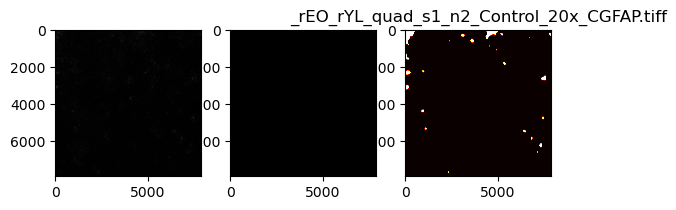

_rEO_rYL_quad_s2_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56750956.0       26.089584      18.165745          1.000000
1      2    813424.0       28.148717      20.232265          1.078925
2      3    718336.0       26.551236      19.277869          1.017695
3      4    623240.0       25.849488      17.856836          0.990797
4      5    528248.0       26.489353      18.044565          1.015323
5      6    433128.0       24.889910      17.072985          0.954017
6      7    338104.0       22.255055      14.598692          0.853025
7      8    243064.0       23.681512      14.627746          0.907700
8      9    147952.0       20.258111      10.768955          0.776483
9   9999   1415423.0       10.757381       4.727528          0.412325


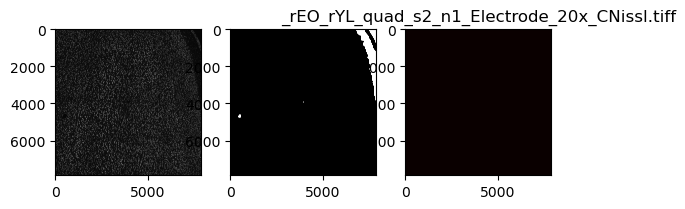

_rEO_rYL_quad_s2_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55333792.0       28.534007      20.146456          1.000000
1      2    813424.0       30.788168      23.393210          1.078999
2      3    718336.0       30.098441      22.543188          1.054827
3      4    623240.0       28.769729      21.748661          1.008261
4      5    528248.0       30.149595      22.578055          1.056620
5      6    433128.0       29.750577      21.786473          1.042636
6      7    338104.0       28.603826      20.270559          1.002447
7      8    243064.0       25.777651      18.733475          0.903401
8      9    147952.0       23.962468      16.702177          0.839786
9   9999   2696653.0       10.537922       4.639137          0.369311


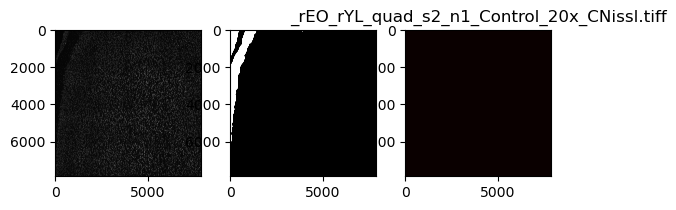

_rEO_rYL_quad_s2_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57995337.0       55.041000      88.117053          1.000000
1      2    813424.0       62.503051     104.091858          1.135573
2      3    718336.0       61.768550     101.988929          1.122228
3      4    623240.0       57.798947      86.175665          1.050107
4      5    528248.0       67.804404     117.299800          1.231889
5      6    433128.0       55.037102      79.367415          0.999929
6      7    338104.0       66.046060     106.092236          1.199943
7      8    243064.0       53.052262      71.762866          0.963868
8      9    147952.0       44.789621      38.767690          0.813750
9   9999    168974.0       52.588031     159.903513          0.955434


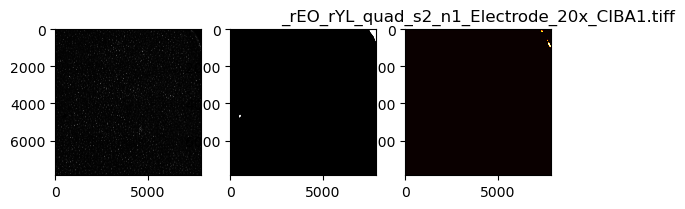

_rEO_rYL_quad_s2_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57347500.0       57.572451      91.112471          1.000000
1      2    813424.0       55.832166      87.032228          0.969772
2      3    718336.0       55.297596      85.086809          0.960487
3      4    623240.0       55.625515      85.749497          0.966183
4      5    528248.0       54.682151      87.202516          0.949797
5      6    433128.0       53.946279      87.268004          0.937016
6      7    338104.0       52.377819      81.651968          0.909772
7      8    243064.0       49.375810      84.931988          0.857629
8      9    147952.0       48.204093      71.812407          0.837277
9   9999    682945.0      102.247846     235.276481          1.775986


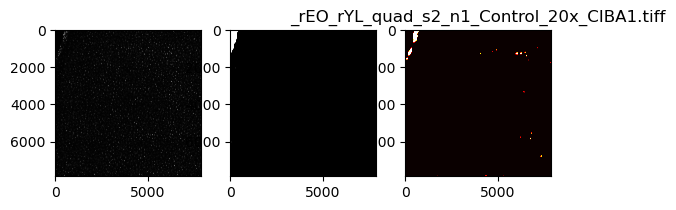

_rEO_rYL_quad_s2_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58095353.0       29.491464      45.111590          1.000000
1      2    813424.0       57.760230      79.056685          1.958541
2      3    718336.0       65.271383      91.892215          2.213230
3      4    623240.0       79.864360     105.651067          2.708050
4      5    528248.0      106.484365     131.321540          3.610684
5      6    433128.0      151.207033     183.926273          5.127146
6      7    338104.0      215.834424     228.059310          7.318539
7      8    243064.0      308.149664     294.103670         10.448775
8      9    147952.0      624.762004     500.536836         21.184503
9   9999     68958.0      959.403318     629.664365         32.531560


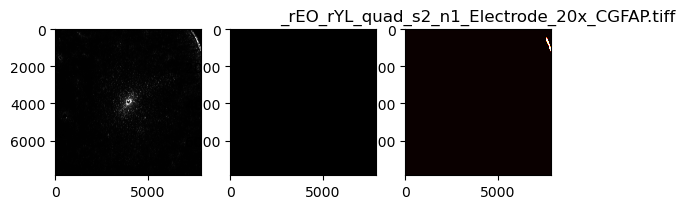

_rEO_rYL_quad_s2_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55618631.0       26.394721      30.468414          1.000000
1      2    813424.0       22.121570      21.050729          0.838106
2      3    718336.0       23.581284      23.413528          0.893409
3      4    623240.0       22.804202      19.901319          0.863968
4      5    528248.0       20.840618      15.949919          0.789575
5      6    433128.0       21.922840      18.419542          0.830577
6      7    338104.0       21.197762      15.956276          0.803106
7      8    243064.0       20.480001      19.816687          0.775913
8      9    147952.0       17.822246       9.174328          0.675220
9   9999   2411814.0      187.504096     300.410445          7.103848


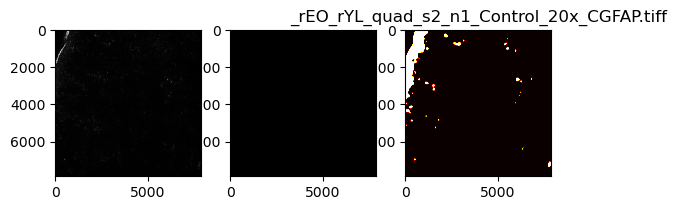

_rEO_rYL_quad_s2_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57268865.0       28.137830      18.664049          1.000000
1      2    794072.0       27.721775      18.811925          0.985214
2      3    699016.0       28.394197      18.085194          1.009111
3      4    603984.0       27.819502      18.423955          0.988687
4      5    508904.0       27.836747      18.035756          0.989300
5      6    413840.0       25.965547      16.631416          0.922798
6      7    318768.0       24.581326      15.742760          0.873604
7      8    223728.0       23.721939      14.233448          0.843062
8      9    125968.0       21.036938      12.688109          0.747639
9   9999    938329.0       12.015129       6.377322          0.427010


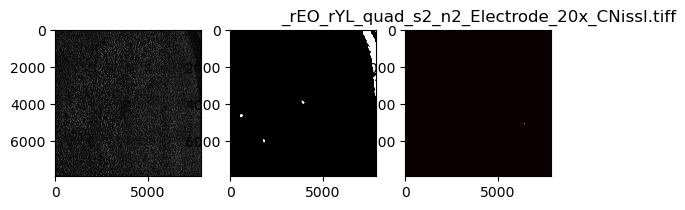

_rEO_rYL_quad_s2_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57390342.0       31.244329      20.875881          1.000000
1      2    794072.0       33.741992      24.186292          1.079940
2      3    699016.0       34.438207      25.415340          1.102223
3      4    603984.0       33.705419      24.579504          1.078769
4      5    508904.0       31.573680      21.973412          1.010541
5      6    413840.0       30.210610      20.803307          0.966915
6      7    318768.0       30.812541      21.808678          0.986180
7      8    223728.0       30.287747      20.946292          0.969384
8      9    128632.0       29.430398      20.080603          0.941944
9   9999    844563.0       12.893997       6.926053          0.412683


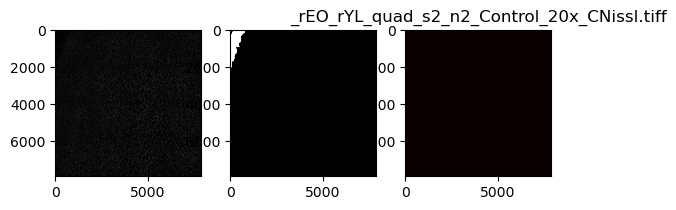

_rEO_rYL_quad_s2_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58124465.0       48.945844      64.239186          1.000000
1      2    794072.0       49.831088      67.108784          1.018086
2      3    699016.0       50.169424      70.565641          1.024999
3      4    603984.0       51.748520      69.913502          1.057261
4      5    508904.0       53.775728      73.113605          1.098678
5      6    413840.0       57.097576      84.688023          1.166546
6      7    318768.0       49.615642      67.944207          1.013684
7      8    223728.0       38.619976      46.313737          0.789035
8      9    128632.0       46.200285      37.853345          0.943906
9   9999     63172.0       91.165216     167.199977          1.862573


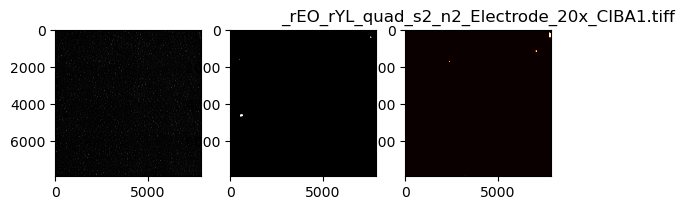

_rEO_rYL_quad_s2_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58146114.0       52.369481      67.829264          1.000000
1      2    794072.0       49.012368      63.385076          0.935896
2      3    699016.0       48.881445      67.444065          0.933396
3      4    603984.0       49.381389      64.304233          0.942942
4      5    508904.0       48.649498      63.218591          0.928967
5      6    413840.0       44.691949      58.649682          0.853397
6      7    318768.0       47.903030      65.782089          0.914713
7      8    223728.0       43.449251      54.950321          0.829667
8      9    128632.0       47.353831      60.197282          0.904226
9   9999     88791.0      147.084389     236.941802          2.808590


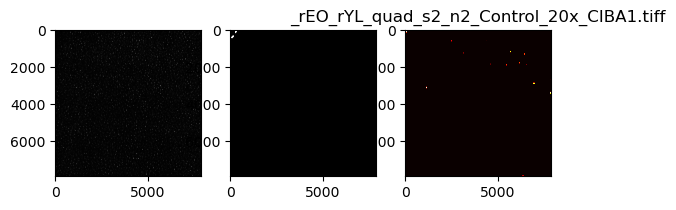

_rEO_rYL_quad_s2_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58173784.0       28.534317      31.580547          1.000000
1      2    794072.0       53.500402      59.595835          1.874949
2      3    699016.0       60.812757      69.625538          2.131215
3      4    603984.0       69.982059      76.424521          2.452558
4      5    508904.0       92.703190     101.486517          3.248832
5      6    413840.0      117.554775     114.483268          4.119768
6      7    318768.0      170.423073     148.656769          5.972565
7      8    223728.0      271.600595     207.374904          9.518384
8      9    128632.0      643.604539     493.121226         22.555456
9   9999     13853.0      750.380567     473.501004         26.297478


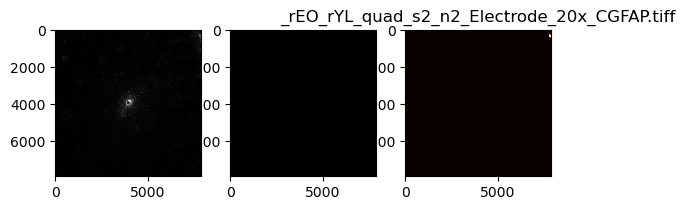

_rEO_rYL_quad_s2_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55956060.0       26.223064      19.765971          1.000000
1      2    794072.0       21.473885      16.539538          0.818893
2      3    699016.0       20.556674      11.206518          0.783916
3      4    603984.0       20.100993       9.152432          0.766539
4      5    508904.0       21.322346      11.571744          0.813114
5      6    413840.0       21.978794      11.496184          0.838147
6      7    318768.0       22.529548      14.660647          0.859150
7      8    223728.0       22.488982      15.880481          0.857603
8      9    128632.0       22.315170      14.242770          0.850975
9   9999   2278845.0       96.001903     112.835228          3.660972


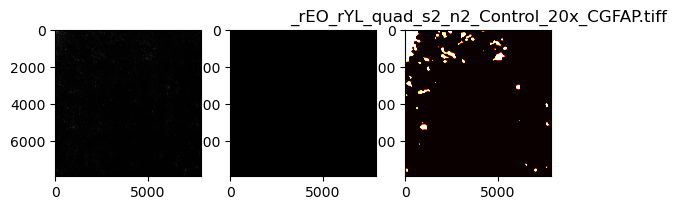

_rEO_rYL_quad_s3_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57115339.0       36.573914      27.683422          1.000000
1      2    794072.0       38.323922      28.981290          1.047849
2      3    699016.0       36.412008      26.585972          0.995573
3      4    603550.0       36.743216      27.156771          1.004629
4      5    502925.0       36.135137      26.745248          0.988003
5      6    413840.0       34.642992      24.322639          0.947205
6      7    318768.0       35.570151      24.649778          0.972555
7      8    223728.0       34.847248      23.312568          0.952790
8      9    123085.0       27.398318      19.468438          0.749122
9   9999    857411.0       13.420481       8.082830          0.366941


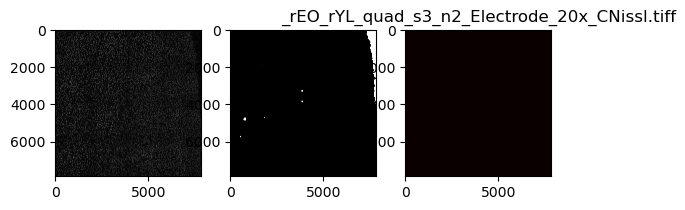

_rEO_rYL_quad_s3_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57203312.0       36.867658      27.805651          1.000000
1      2    794072.0       38.844561      29.254879          1.053622
2      3    699016.0       39.719417      27.989942          1.077351
3      4    603984.0       40.570737      28.633597          1.100442
4      5    508904.0       37.489861      26.996831          1.016877
5      6    413840.0       35.495310      25.463159          0.962776
6      7    318768.0       34.706235      25.044031          0.941373
7      8    223728.0       32.300021      22.252481          0.876107
8      9    128632.0       29.769132      19.302083          0.807459
9   9999   1008007.0       12.592936       7.103564          0.341571


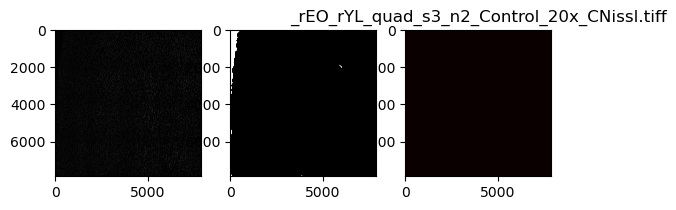

_rEO_rYL_quad_s3_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57947090.0       81.880577     141.656959          1.000000
1      2    794072.0       90.875914     159.960707          1.109859
2      3    699016.0       92.448239     168.372576          1.129062
3      4    603984.0       90.561738     166.877144          1.106022
4      5    508904.0       92.609087     163.630862          1.131026
5      6    413840.0       89.354601     149.507360          1.091280
6      7    318768.0      103.998541     182.867708          1.270125
7      8    223728.0       83.033997     121.114548          1.014087
8      9    128632.0       59.273182      58.943557          0.723898
9   9999     12492.0      141.232229     348.109328          1.724856


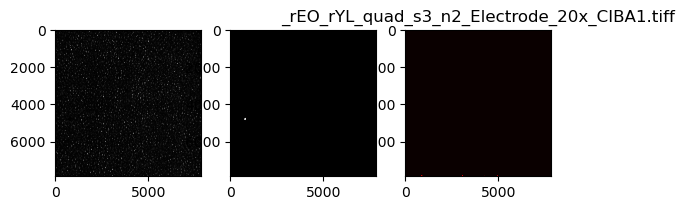

_rEO_rYL_quad_s3_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58077663.0       80.232595     134.349725          1.000000
1      2    794072.0       81.598636     141.962413          1.017026
2      3    699016.0       80.854402     132.098027          1.007750
3      4    603984.0       77.019843     129.064315          0.959957
4      5    508904.0       69.842764     106.793386          0.870504
5      6    413840.0       71.155280     116.989239          0.886863
6      7    318768.0       82.381767     146.530141          1.026787
7      8    223728.0       70.196176     113.897532          0.874908
8      9    128632.0       71.424358     130.250560          0.890216
9   9999    133656.0      138.916914     326.048573          1.731427


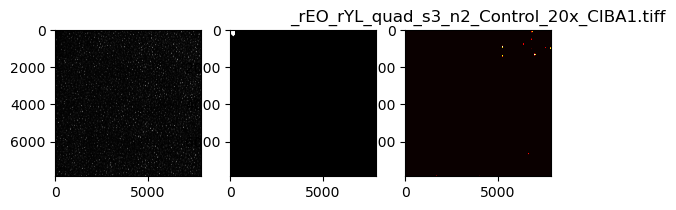

_rEO_rYL_quad_s3_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57959582.0       38.896934      61.194375          1.000000
1      2    794072.0       98.167543     162.974586          2.523786
2      3    699016.0      106.216042     170.884878          2.730705
3      4    603984.0      109.049869     164.103677          2.803559
4      5    508904.0      147.081314     234.077219          3.781309
5      6    413840.0      176.812768     240.596345          4.545674
6      7    318768.0      267.303390     316.197071          6.872094
7      8    223728.0      384.490707     406.577746          9.884859
8      9    128632.0      615.489894     558.542733         15.823609


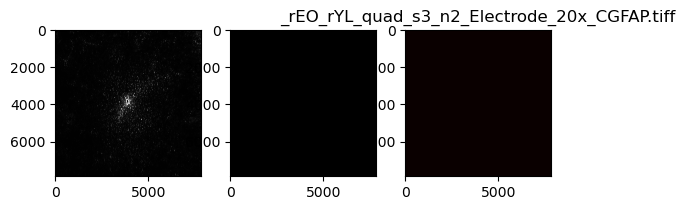

_rEO_rYL_quad_s3_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57934609.0       37.204581      55.258128          1.000000
1      2    794072.0       36.340727      45.824808          0.976781
2      3    699016.0       38.168304      42.009054          1.025903
3      4    603984.0       36.635949      49.167199          0.984716
4      5    508904.0       32.628763      39.739413          0.877009
5      6    413840.0       29.761666      29.302826          0.799946
6      7    318768.0       29.267085      27.526644          0.786653
7      8    223728.0       27.717702      22.551116          0.745008
8      9    128632.0       25.418263      23.624433          0.683203
9   9999    276710.0      233.546579     280.260947          6.277361


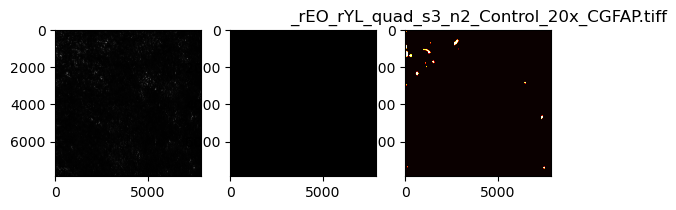

_rEO_rYL_quad_s4_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57565082.0       29.210501      19.516585          1.000000
1      2    794072.0       30.442846      19.328459          1.042188
2      3    699016.0       29.515884      18.317236          1.010455
3      4    603984.0       27.979827      17.170034          0.957869
4      5    508904.0       28.873457      17.490790          0.988462
5      6    413840.0       28.489805      17.211937          0.975328
6      7    318768.0       26.799312      16.456823          0.917455
7      8    223728.0       27.316840      16.548341          0.935172
8      9    128632.0       25.199422      14.793308          0.862684
9   9999    529204.0       12.246684       6.530921          0.419256


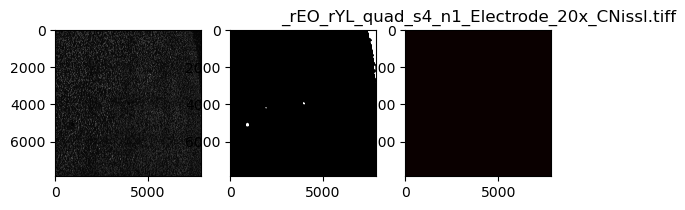

_rEO_rYL_quad_s4_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58315373.0       28.795496      18.759247          1.000000
1      2    794072.0       29.879981      18.833734          1.037662
2      3    699016.0       29.010583      17.678232          1.007469
3      4    603984.0       29.319792      16.957195          1.018208
4      5    508904.0       27.092874      15.946824          0.940872
5      6    413840.0       28.638396      17.740070          0.994544
6      7    318768.0       26.515193      14.775751          0.920810
7      8    223728.0       25.655975      13.884104          0.890972
8      9    128632.0       25.909812      14.944399          0.899787
9   9999     21946.0       19.546979      21.819782          0.678821


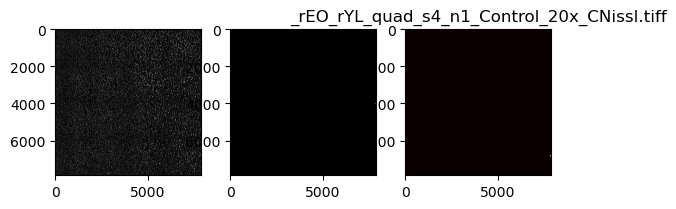

_rEO_rYL_quad_s4_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58060149.0       55.032601      82.416536          1.000000
1      2    794072.0       58.845242      96.839792          1.069280
2      3    699016.0       65.578485     104.736867          1.191630
3      4    603984.0       65.696772     105.973785          1.193779
4      5    508904.0       62.210393      97.086424          1.130428
5      6    413840.0       64.382904      91.894096          1.169905
6      7    318768.0       63.781512      96.224225          1.158977
7      8    223728.0       54.778986      78.345372          0.995392
8      9    128632.0       44.775795      40.872627          0.813623
9   9999     25266.0      127.715230     240.923775          2.320720


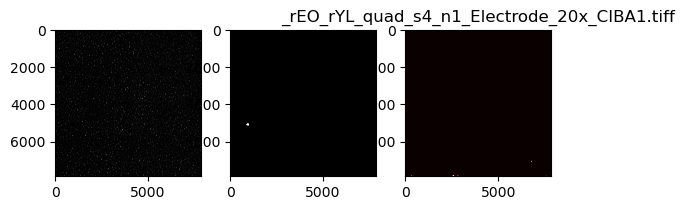

_rEO_rYL_quad_s4_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58292581.0       51.883855      74.726508          1.000000
1      2    794072.0       52.969373      76.088741          1.020922
2      3    699016.0       53.403914      78.162950          1.029297
3      4    603984.0       51.960376      77.602065          1.001475
4      5    508904.0       49.644479      66.234597          0.956839
5      6    413840.0       51.359054      73.030794          0.989885
6      7    318768.0       50.916369      73.821242          0.981353
7      8    223728.0       44.118345      56.458166          0.850329
8      9    128632.0       47.328674      76.323824          0.912204
9   9999     44738.0      274.130650     333.767320          5.283544


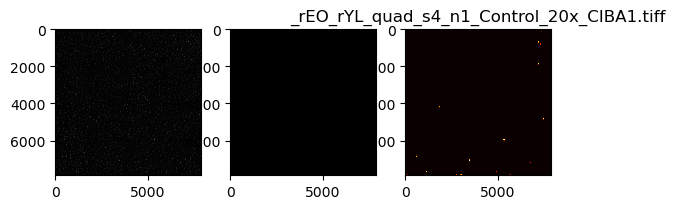

_rEO_rYL_quad_s4_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58085415.0       28.575596      36.177830          1.000000
1      2    794072.0       64.311834      90.754851          2.250586
2      3    699016.0       76.067901     111.997764          2.661988
3      4    603984.0       77.888724     105.942854          2.725708
4      5    508904.0       83.953176     108.119070          2.937933
5      6    413840.0      103.485262     129.268760          3.621456
6      7    318768.0      134.629288     155.297410          4.711338
7      8    223728.0      213.910145     209.272456          7.485763
8      9    128632.0      555.954343     497.593389         19.455564


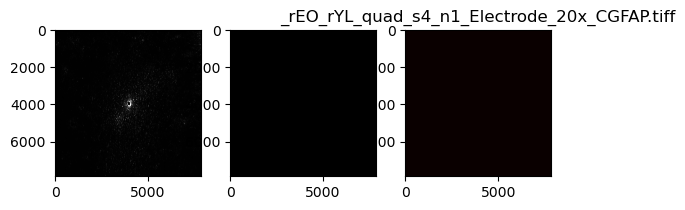

_rEO_rYL_quad_s4_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57520360.0       24.202113      23.720737          1.000000
1      2    794072.0       25.224540      23.663930          1.042245
2      3    699016.0       24.147045      22.659464          0.997725
3      4    603984.0       24.622447      20.856521          1.017368
4      5    508904.0       24.468523      19.791664          1.011008
5      6    413840.0       23.597243      25.033338          0.975008
6      7    318768.0       25.197476      28.713789          1.041127
7      8    223728.0       20.933155      25.166751          0.864931
8      9    128632.0       16.776494       5.907588          0.693183
9   9999    816959.0      109.926513     136.165080          4.542021


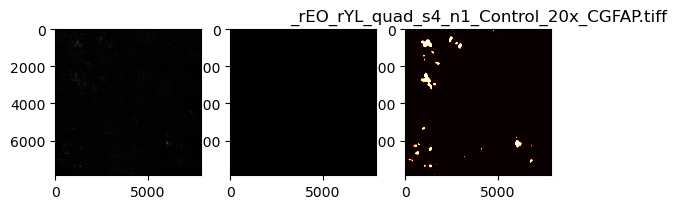

_rEO_rYL_quad_s4_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57900878.0       26.287068      15.933034          1.000000
1      2    794072.0       26.636567      15.071529          1.013295
2      3    699016.0       27.013971      15.029825          1.027653
3      4    603984.0       26.837463      14.597782          1.020938
4      5    508904.0       25.929547      14.383987          0.986399
5      6    413840.0       24.740284      14.531312          0.941158
6      7    318768.0       25.631933      14.351664          0.975078
7      8    223728.0       24.704020      14.113223          0.939778
8      9    128632.0       22.671808      11.787395          0.862470
9   9999    452897.0       12.101396       5.562917          0.460355


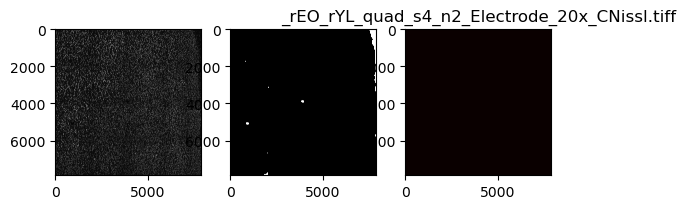

_rEO_rYL_quad_s4_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58131780.0       28.708715      18.118862          1.000000
1      2    794072.0       29.510736      17.001080          1.027936
2      3    699016.0       28.634309      16.528169          0.997408
3      4    603984.0       29.310151      16.401028          1.020950
4      5    508904.0       29.004740      15.843678          1.010311
5      6    413840.0       26.530222      14.844841          0.924117
6      7    318768.0       25.770451      13.941210          0.897653
7      8    223728.0       24.680062      12.354716          0.859671
8      9    128632.0       23.561237      11.968222          0.820700
9   9999      8743.0       37.806359      40.667049          1.316895


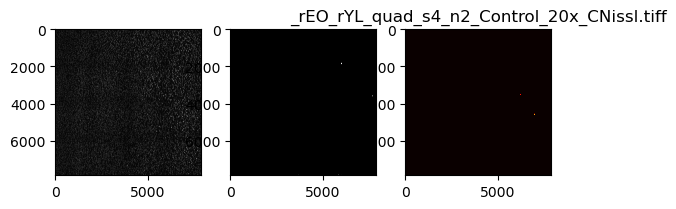

_rEO_rYL_quad_s4_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58329792.0       53.496239      74.617395          1.000000
1      2    794072.0       59.833020      84.991340          1.118453
2      3    699016.0       62.920812      90.957078          1.176173
3      4    603984.0       61.541347      88.192431          1.150386
4      5    508904.0       68.378022     101.023224          1.278184
5      6    413840.0       66.201344      90.124036          1.237495
6      7    318768.0       65.813545      88.314793          1.230246
7      8    223728.0       56.108404      73.981039          1.048829
8      9    128632.0       53.103800      35.756135          0.992664
9   9999      7527.0       30.000930     110.178825          0.560804


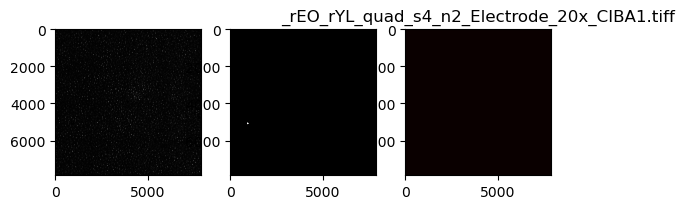

_rEO_rYL_quad_s4_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58071542.0       57.828758      80.037223          1.000000
1      2    794072.0       54.942290      70.073219          0.950086
2      3    699016.0       58.648380      83.993776          1.014173
3      4    603984.0       59.293713      88.519885          1.025333
4      5    508904.0       57.194811      80.201123          0.989038
5      6    413840.0       53.366270      66.171954          0.922833
6      7    318768.0       55.942758      74.305687          0.967386
7      8    223728.0       48.396964      55.835119          0.836901
8      9    128632.0       50.171621      68.614186          0.867589
9   9999     68981.0      196.517911     268.597190          3.398273


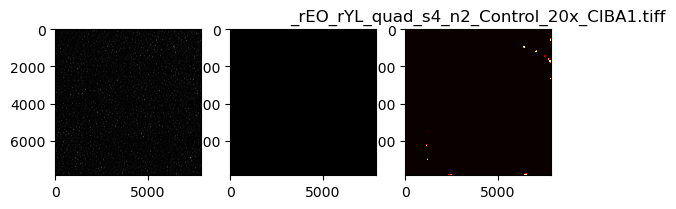

_rEO_rYL_quad_s4_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58337319.0       29.238729      33.830229          1.000000
1      2    794072.0       57.500074      72.314475          1.966572
2      3    699016.0       66.851370      85.762053          2.286398
3      4    603984.0       70.719522      86.167052          2.418693
4      5    508904.0       73.236192      85.919819          2.504767
5      6    413840.0       90.416886     105.546821          3.092367
6      7    318768.0      115.599656     112.684120          3.953648
7      8    223728.0      171.060395     144.252628          5.850473
8      9    128632.0      431.846142     364.866372         14.769662


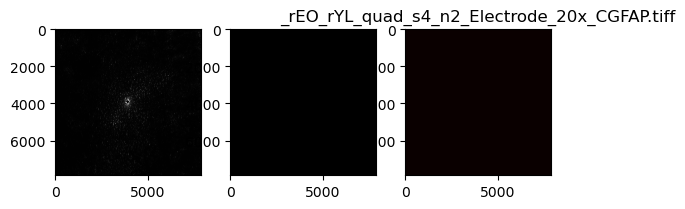

_rEO_rYL_quad_s4_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56592793.0       27.157214      26.597825          1.000000
1      2    794072.0       28.735362      28.336053          1.058112
2      3    699016.0       30.818036      30.356786          1.134801
3      4    603984.0       30.576648      27.104705          1.125913
4      5    508904.0       26.965353      21.377371          0.992935
5      6    413840.0       25.682145      22.333087          0.945684
6      7    318768.0       24.846136      18.788302          0.914900
7      8    223728.0       22.422406      16.188636          0.825652
8      9    128632.0       20.229531       8.966803          0.744904
9   9999   1547730.0      106.457484     118.083651          3.920044


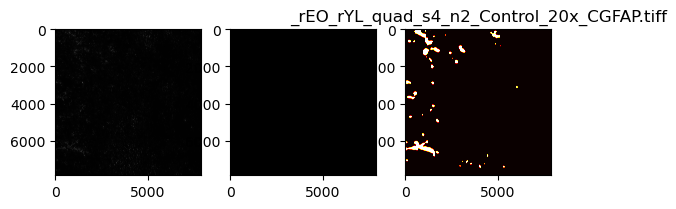

_rEO_rYL_quad_s5_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57417368.0       29.135399      18.804913          1.000000
1      2    794072.0       30.686550      18.740037          1.053239
2      3    699016.0       29.142156      17.065091          1.000232
3      4    603984.0       29.652724      17.066186          1.017756
4      5    508904.0       27.432455      16.220355          0.941551
5      6    413840.0       28.336169      16.784757          0.972568
6      7    318768.0       27.645629      16.847923          0.948867
7      8    223728.0       26.814900      16.567856          0.920355
8      9    127574.0       24.975026      13.620490          0.857206
9   9999    875843.0       12.955245       8.306933          0.444657


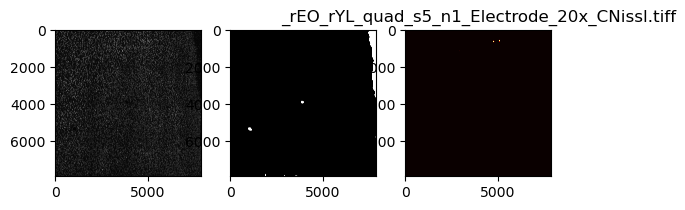

_rEO_rYL_quad_s5_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56672050.0       27.963022      17.614444          1.000000
1      2    794072.0       27.714096      16.762396          0.991098
2      3    699016.0       27.122783      16.685288          0.969952
3      4    603984.0       26.280094      14.929868          0.939816
4      5    508904.0       26.691319      14.916457          0.954522
5      6    413840.0       25.796088      14.136800          0.922507
6      7    318768.0       25.159712      14.188610          0.899749
7      8    223728.0       25.250831      14.064901          0.903008
8      9    128632.0       22.668496      13.035489          0.810660
9   9999   1665269.0       12.487373       8.700672          0.446567


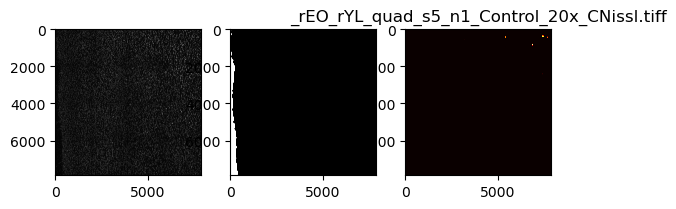

_rEO_rYL_quad_s5_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58261645.0       58.111321      86.149079          1.000000
1      2    794072.0       60.012096      88.500789          1.032709
2      3    699016.0       71.626562     109.741948          1.232575
3      4    603984.0       68.245099     103.468304          1.174386
4      5    508904.0       73.524641     114.660465          1.265238
5      6    413840.0       74.051445     111.519914          1.274303
6      7    318768.0       69.301232     105.414209          1.192560
7      8    223728.0       64.047392      97.382849          1.102150
8      9    128632.0       57.500645      47.659342          0.989491
9   9999     12650.0       40.781581     141.720609          0.701784


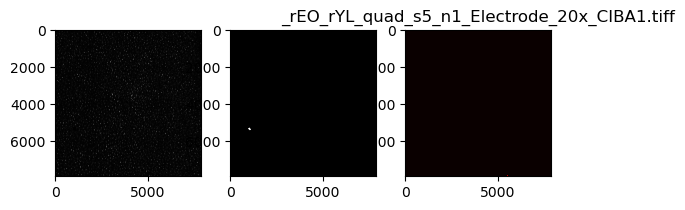

_rEO_rYL_quad_s5_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58302466.0       53.645093      76.883032          1.000000
1      2    794072.0       55.206339      75.058480          1.029103
2      3    699016.0       51.803736      74.024035          0.965675
3      4    603984.0       51.254517      65.314418          0.955437
4      5    508904.0       52.431710      69.361873          0.977381
5      6    413840.0       46.529874      63.381026          0.867365
6      7    318768.0       50.524030      74.978282          0.941820
7      8    223728.0       52.210322      76.628251          0.973254
8      9    128632.0       45.911849      64.575352          0.855844
9   9999     34853.0      182.077956     282.616668          3.394121


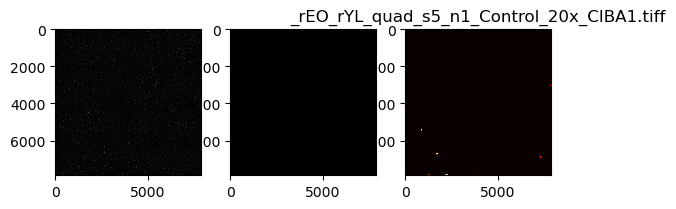

_rEO_rYL_quad_s5_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58274295.0       34.867548      47.750987          1.000000
1      2    794072.0       77.447606     106.177246          2.221195
2      3    699016.0       77.936805     110.604837          2.235225
3      4    603984.0       93.380316     125.436494          2.678144
4      5    508904.0       95.164064     126.335185          2.729302
5      6    413840.0      102.202588     128.458800          2.931167
6      7    318768.0      117.863694     130.002677          3.380326
7      8    223728.0      203.463120     227.714002          5.835315
8      9    128632.0      444.149838     406.791020         12.738201


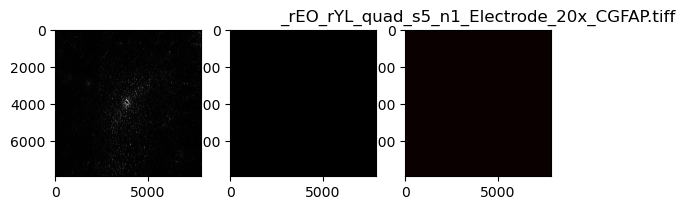

_rEO_rYL_quad_s5_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57637152.0       31.351180      37.617619          1.000000
1      2    794072.0       36.522120      47.292549          1.164936
2      3    699016.0       33.958509      40.961031          1.083165
3      4    603984.0       36.280049      40.977048          1.157215
4      5    508904.0       31.963431      33.558692          1.019529
5      6    413840.0       29.748988      28.332624          0.948895
6      7    318768.0       31.697172      36.332103          1.011036
7      8    223728.0       30.495048      31.268049          0.972692
8      9    128632.0       36.254027      44.481044          1.156385
9   9999    700167.0      127.663876     125.072539          4.072060


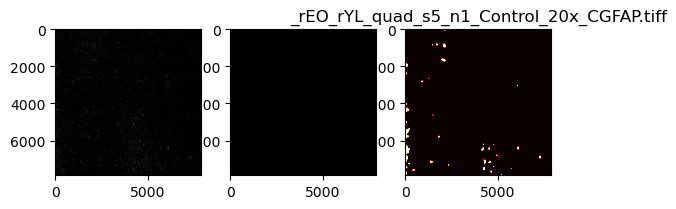

_rEO_rYL_quad_s5_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57881602.0       27.942556      16.793927          1.000000
1      2    794072.0       28.653957      16.403605          1.025459
2      3    699016.0       27.192648      14.904744          0.973162
3      4    603984.0       26.570636      14.826670          0.950902
4      5    508904.0       26.746815      14.778942          0.957207
5      6    413840.0       25.964187      15.087517          0.929199
6      7    318768.0       25.169352      14.530745          0.900753
7      8    223728.0       26.179213      14.237412          0.936894
8      9    128632.0       23.001679      14.435021          0.823177
9   9999    384815.0       12.229258       6.038521          0.437657


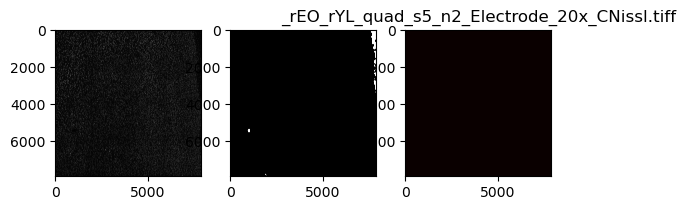

_rEO_rYL_quad_s5_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56300143.0       32.809461      20.320853          1.000000
1      2    794072.0       31.083849      18.975490          0.947405
2      3    699016.0       30.488748      18.092833          0.929267
3      4    603984.0       30.362988      17.589934          0.925434
4      5    508904.0       30.371630      17.054140          0.925697
5      6    413840.0       28.489121      17.286815          0.868320
6      7    318768.0       27.354211      16.379168          0.833729
7      8    223728.0       27.165402      15.373645          0.827975
8      9    128632.0       23.981692      14.302503          0.730938
9   9999   1706660.0       13.560186       7.228011          0.413301


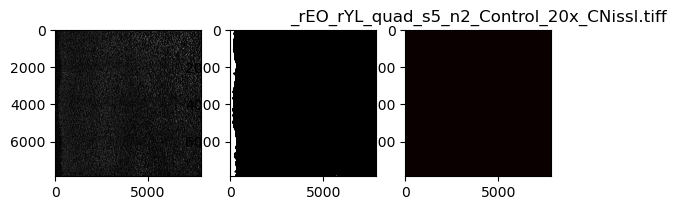

_rEO_rYL_quad_s5_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58226259.0       49.452635      65.897648          1.000000
1      2    794072.0       52.541281      70.018268          1.062457
2      3    699016.0       53.613429      68.864332          1.084137
3      4    603984.0       55.391681      74.100211          1.120096
4      5    508904.0       56.230362      72.308123          1.137055
5      6    413840.0       56.975058      72.886492          1.152114
6      7    318768.0       58.200287      80.551876          1.176889
7      8    223728.0       49.998471      53.031369          1.011038
8      9    128632.0       44.698248      40.386612          0.903860
9   9999     40158.0       90.799791     155.137199          1.836096


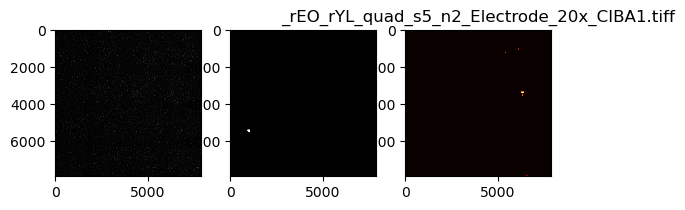

_rEO_rYL_quad_s5_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57989287.0       55.073010      74.427635          1.000000
1      2    794072.0       57.889557      79.428627          1.051142
2      3    699016.0       52.358066      68.411554          0.950703
3      4    603984.0       49.377853      64.136564          0.896589
4      5    508904.0       47.903029      56.243127          0.869810
5      6    413840.0       52.719169      73.070532          0.957260
6      7    318768.0       49.944100      68.504877          0.906871
7      8    223728.0       47.162523      58.607446          0.856364
8      9    128632.0       49.440668      68.157220          0.897730
9   9999     17516.0      141.552980     208.703358          2.570279


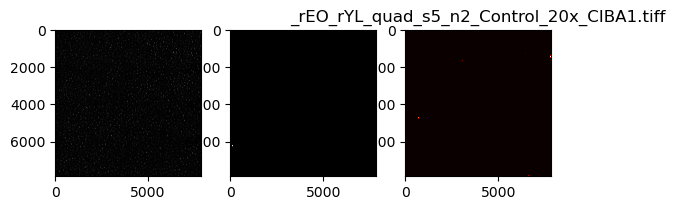

_rEO_rYL_quad_s5_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58266417.0       34.636891      45.420371          1.000000
1      2    794072.0       67.217730      80.835829          1.940640
2      3    699016.0       76.031735      92.651799          2.195109
3      4    603984.0       76.780534      90.454513          2.216727
4      5    508904.0       89.474068     100.165051          2.583201
5      6    413840.0       95.957887     105.252189          2.770396
6      7    318768.0      136.718014     153.794452          3.947179
7      8    223728.0      231.336923     282.413826          6.678917
8      9    128632.0      379.930243     408.713360         10.968948


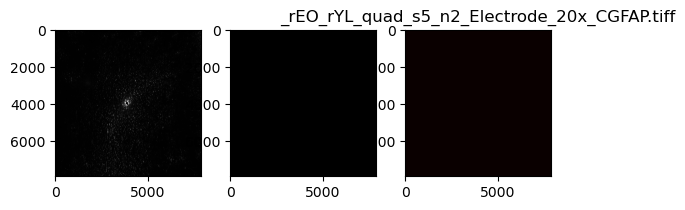

_rEO_rYL_quad_s5_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57531888.0       32.754817      34.716280          1.000000
1      2    794072.0       40.787560      46.571885          1.245239
2      3    699016.0       38.875335      42.609600          1.186859
3      4    603984.0       39.125472      41.889731          1.194495
4      5    508904.0       39.736157      39.905505          1.213139
5      6    413840.0       34.578289      33.657871          1.055670
6      7    318768.0       37.065066      41.994835          1.131591
7      8    223728.0       32.707877      29.767992          0.998567
8      9    128632.0       33.690956      35.814598          1.028580
9   9999    474915.0      134.947498     119.067004          4.119928


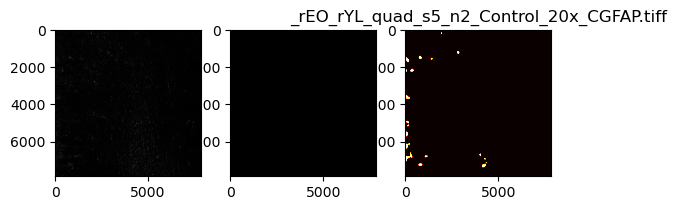

_rEO_rYL_quad_s6_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57872712.0       28.996024      17.335037          1.000000
1      2    794072.0       27.000700      15.359145          0.931186
2      3    699016.0       26.905354      15.050130          0.927898
3      4    603984.0       26.158653      15.223285          0.902146
4      5    508904.0       27.138865      15.048537          0.935951
5      6    413840.0       27.770638      15.051733          0.957740
6      7    318768.0       26.842378      15.524403          0.925726
7      8    223728.0       26.248105      14.997580          0.905231
8      9    128632.0       24.625785      14.180580          0.849281
9   9999    464607.0       14.216045      12.357853          0.490276


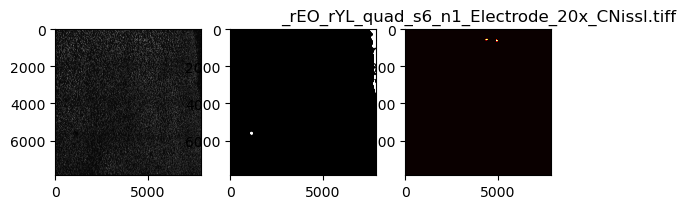

_rEO_rYL_quad_s6_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56537908.0       29.865041      18.183479          1.000000
1      2    794072.0       28.694387      16.248501          0.960802
2      3    699016.0       28.101247      16.226451          0.940941
3      4    603984.0       28.341151      15.906032          0.948974
4      5    508904.0       27.275726      15.971008          0.913299
5      6    413840.0       26.587860      14.663264          0.890267
6      7    318768.0       26.285659      13.579599          0.880148
7      8    223728.0       22.713433      11.717185          0.760536
8      9    128632.0       22.815621      12.362087          0.763957
9   9999   1657687.0       13.125878      10.110117          0.439506


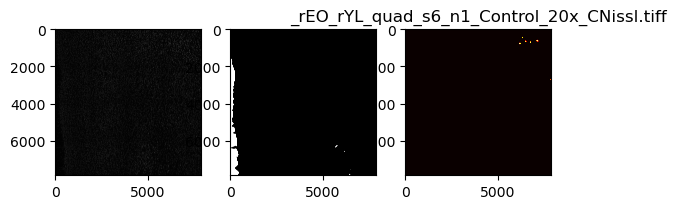

_rEO_rYL_quad_s6_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58305459.0       52.215724      70.657761          1.000000
1      2    794072.0       58.845145      74.737463          1.126962
2      3    699016.0       56.697699      72.585575          1.085836
3      4    603984.0       56.942033      71.615797          1.090515
4      5    508904.0       61.906287      79.978995          1.185587
5      6    413840.0       62.795361      84.761190          1.202614
6      7    318768.0       67.580849      97.631265          1.294262
7      8    223728.0       50.098875      60.348872          0.959460
8      9    128632.0       56.332996     100.251840          1.078851
9   9999     31860.0       79.731764     158.407046          1.526968


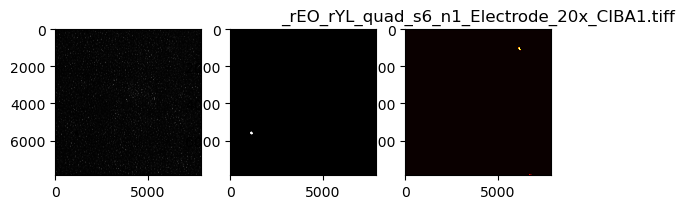

_rEO_rYL_quad_s6_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58147131.0       51.236080      69.341073          1.000000
1      2    794072.0       48.797799      62.621662          0.952411
2      3    699016.0       51.553919      65.215372          1.006203
3      4    603984.0       50.121803      71.149867          0.978252
4      5    508904.0       51.605379      72.827174          1.007208
5      6    413840.0       48.269510      65.531320          0.942100
6      7    318768.0       44.094024      51.035323          0.860605
7      8    223728.0       47.901242      68.093847          0.934912
8      9    128632.0       40.155840      47.737445          0.783741
9   9999     48464.0      187.838519     259.930333          3.666138


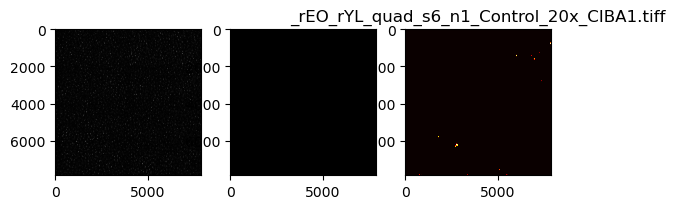

_rEO_rYL_quad_s6_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58337319.0       40.522722      57.349992          1.000000
1      2    794072.0       80.948323     100.904369          1.997603
2      3    699016.0       88.186290     108.432332          2.176218
3      4    603984.0       93.153504     113.417468          2.298797
4      5    508904.0       97.015414     113.959797          2.394099
5      6    413840.0      102.740407     110.861158          2.535378
6      7    318768.0      125.459478     130.359166          3.096028
7      8    223728.0      216.201709     195.058538          5.335320
8      9    128632.0      414.142414     337.528666         10.220005


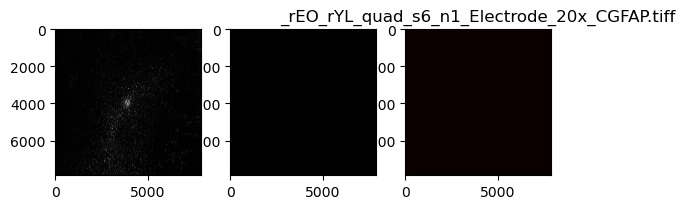

_rEO_rYL_quad_s6_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57887801.0       39.707959      52.240015          1.000000
1      2    794072.0       48.436906      63.358945          1.219829
2      3    699016.0       45.428731      56.648767          1.144071
3      4    603984.0       45.124175      54.196281          1.136401
4      5    508904.0       45.632945      55.715372          1.149214
5      6    413840.0       42.753279      51.112259          1.076693
6      7    318768.0       42.290653      45.493241          1.065042
7      8    223728.0       48.370007      62.677921          1.218144
8      9    128632.0       38.077819      42.835908          0.958947
9   9999    307794.0      197.869598     179.591824          4.983122


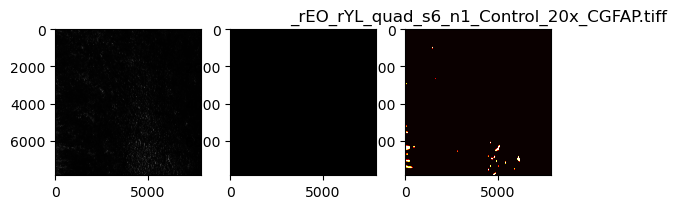

_rEO_rYL_quad_s6_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58186090.0       30.965476      18.778560          1.000000
1      2    774800.0       30.216349      18.389927          0.975808
2      3    679720.0       28.831981      17.134970          0.931101
3      4    584616.0       28.740726      16.559728          0.928154
4      5    489560.0       29.700288      17.049977          0.959142
5      6    394608.0       29.354988      16.703783          0.947991
6      7    299400.0       29.631326      17.934043          0.956915
7      8    204416.0       27.942103      16.634738          0.902363
8      9    109312.0       26.645528      16.668010          0.860491
9   9999    139219.0       11.831496       5.280023          0.382087


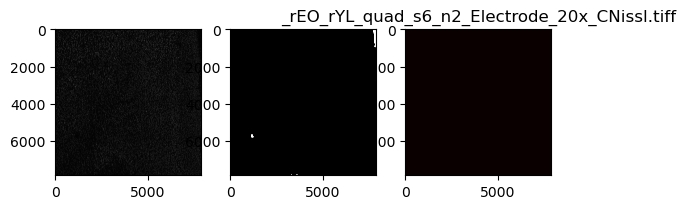

_rEO_rYL_quad_s6_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57894531.0       38.746085      25.527986          1.000000
1      2    774800.0       37.195245      24.188138          0.959974
2      3    679720.0       35.859876      23.594224          0.925510
3      4    584616.0       35.242125      22.457166          0.909566
4      5    489560.0       34.479245      22.421630          0.889877
5      6    394608.0       32.856675      20.884928          0.848000
6      7    299400.0       31.805294      19.900210          0.820865
7      8    204416.0       30.433210      18.690592          0.785453
8      9    109312.0       28.922643      18.858552          0.746466
9   9999    226388.0       26.043536      31.541263          0.672159


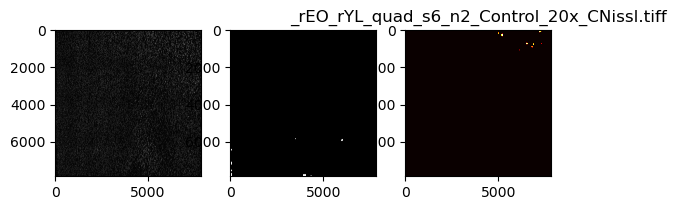

_rEO_rYL_quad_s6_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58299748.0       58.393280      81.833410          1.000000
1      2    774800.0       66.908911      93.805969          1.145832
2      3    679720.0       67.402298      89.334501          1.154282
3      4    584616.0       69.829059      93.636138          1.195841
4      5    489560.0       70.078955      89.723677          1.200120
5      6    394608.0       62.799563      77.587467          1.075459
6      7    299400.0       51.826837      54.528641          0.887548
7      8    204416.0       48.673157      46.798909          0.833540
8      9    109312.0       50.217030      31.279283          0.859980
9   9999     25561.0       79.576464     236.092055          1.362768


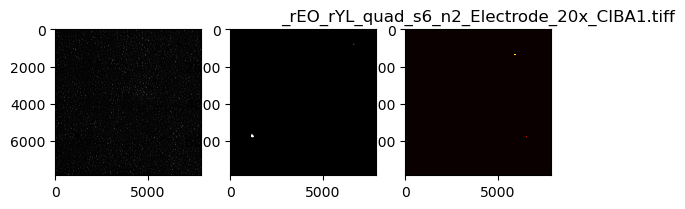

_rEO_rYL_quad_s6_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58071094.0       71.284672     103.067367          1.000000
1      2    774800.0       70.352719     103.530611          0.986926
2      3    679720.0       67.543917      98.747668          0.947524
3      4    584616.0       71.336106     110.108388          1.000722
4      5    489560.0       73.257893     111.449188          1.027681
5      6    394608.0       61.675012      93.964738          0.865193
6      7    299400.0       59.756440      70.974648          0.838279
7      8    204416.0       68.262714      99.831811          0.957607
8      9    109312.0       63.459629      96.489023          0.890228
9   9999     49825.0      308.401204     365.468150          4.326333


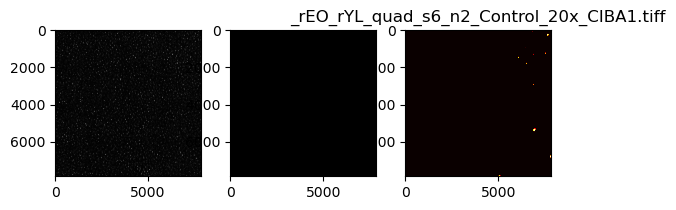

_rEO_rYL_quad_s6_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58325309.0       51.654801      81.245945          1.000000
1      2    774800.0      111.894680     139.450673          2.166201
2      3    679720.0      115.410434     144.612780          2.234263
3      4    584616.0      121.992215     145.313675          2.361682
4      5    489560.0      120.530143     140.017629          2.333377
5      6    394608.0      148.943878     160.493603          2.883447
6      7    299400.0      177.900251     182.584613          3.444022
7      8    204416.0      308.959988     291.367422          5.981244
8      9    109312.0      665.553718     532.142383         12.884644


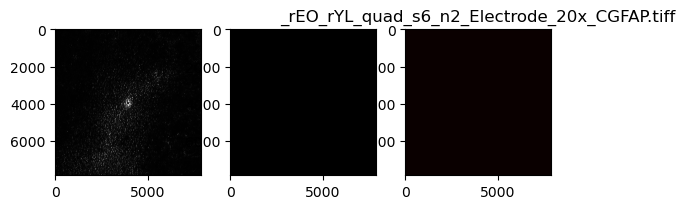

_rEO_rYL_quad_s6_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57641379.0       50.471950      75.895986          1.000000
1      2    774800.0       69.210892     101.651203          1.371274
2      3    679720.0       61.478654      87.771667          1.218076
3      4    584616.0       73.609953     104.880122          1.458433
4      5    489560.0       69.944834      93.483383          1.385816
5      6    394608.0       83.721883     115.409371          1.658780
6      7    299400.0       66.984305      84.601864          1.327159
7      8    204416.0       82.040344     109.163164          1.625464
8      9    109312.0       74.581848     108.941668          1.477689
9   9999    479540.0      275.738293     279.118247          5.463199


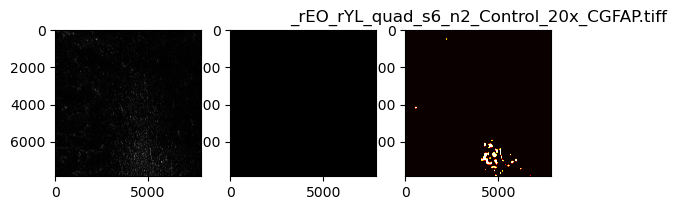

_rEO_rYL_penta_s1_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53883022.0       31.333047      21.288322          1.000000
1      2    744896.0       36.657990      25.418379          1.169947
2      3    626842.0       33.636988      24.033076          1.073531
3      4    548626.0       32.947589      22.459352          1.051528
4      5    462496.0       31.016491      21.263820          0.989897
5      6    367520.0       31.102427      21.165698          0.992640
6      7    272360.0       30.329399      21.112125          0.967968
7      8    177392.0       28.972118      20.487314          0.924651
8      9     82272.0       29.901631      18.153149          0.954316
9   9999   4891097.0       11.119762       5.358905          0.354889


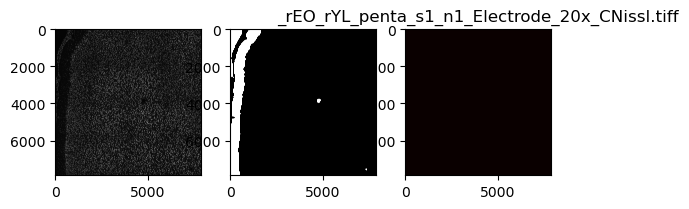

_rEO_rYL_penta_s1_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56692776.0       37.279646      27.177192          1.000000
1      2    747712.0       41.372464      32.384743          1.109787
2      3    652608.0       41.412459      31.670223          1.110860
3      4    557592.0       40.368036      30.627365          1.082844
4      5    462496.0       40.448596      30.272251          1.085005
5      6    367520.0       35.973259      28.328074          0.964957
6      7    272360.0       39.862623      29.880197          1.069287
7      8    177392.0       32.120772      24.354521          0.861617
8      9     82272.0       34.540342      23.816540          0.926520
9   9999   1972893.0       14.008401       9.218886          0.375765


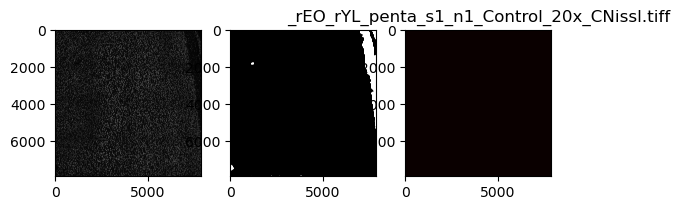

_rEO_rYL_penta_s1_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57304740.0       59.651669      88.038344          1.000000
1      2    747630.0       72.224579     103.242721          1.210772
2      3    636482.0       65.395658      93.679306          1.096292
3      4    550723.0       68.154653     100.978485          1.142544
4      5    462496.0       70.560939     106.324380          1.182883
5      6    367520.0       70.786795     100.789803          1.186669
6      7    272360.0       61.936573      92.528170          1.038304
7      8    177392.0       65.522989      86.057635          1.098427
8      9     82272.0       59.475411      68.521537          0.997045
9   9999   1454908.0       50.317274     145.506744          0.843518


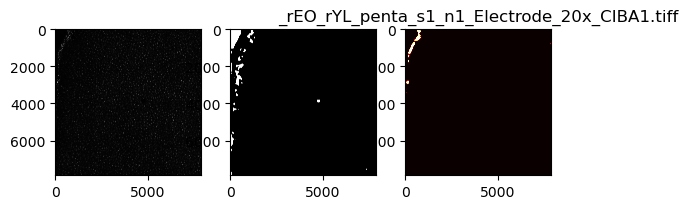

_rEO_rYL_penta_s1_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58471232.0       73.696009     109.483054          1.000000
1      2    747712.0       66.580606      82.837260          0.903449
2      3    652608.0       74.272988     108.815758          1.007829
3      4    557592.0       68.132427      94.893816          0.924506
4      5    462496.0       73.029667     111.089820          0.990958
5      6    367520.0       66.742762      95.162473          0.905650
6      7    272360.0       70.619452     102.871646          0.958253
7      8    177392.0       56.699118      66.223688          0.769365
8      9     82272.0       69.037583      99.251895          0.936789
9   9999    194437.0      156.564095     299.340663          2.124458


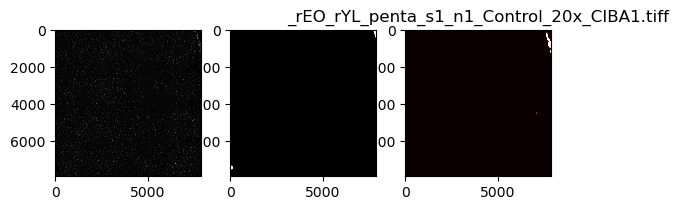

_rEO_rYL_penta_s1_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57276550.0       24.452754      32.058841          1.000000
1      2    747712.0       42.558864      47.361148          1.740453
2      3    652608.0       50.763351      63.818383          2.075977
3      4    557592.0       52.689406      63.762836          2.154743
4      5    462496.0       59.287793      75.020267          2.424586
5      6    367520.0       78.695908     104.267275          3.218284
6      7    272360.0      107.426127     132.354629          4.393212
7      8    177392.0      136.861927     138.538878          5.596994
8      9     82272.0      146.220306     149.556292          5.979707
9   9999   1460021.0      347.905678     456.447247         14.227669


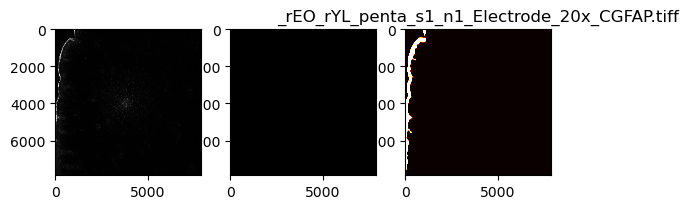

_rEO_rYL_penta_s1_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56924917.0       21.889203      23.109918          1.000000
1      2    747712.0       20.398472      13.554543          0.931896
2      3    652608.0       22.824121      22.927628          1.042711
3      4    557592.0       22.966031      31.759305          1.049194
4      5    462496.0       24.588169      33.523823          1.123301
5      6    367520.0       25.814168      38.033073          1.179311
6      7    272360.0       21.920965      22.193140          1.001451
7      8    177392.0       19.267780      18.012691          0.880241
8      9     82272.0       16.521587       7.202413          0.754782
9   9999   1740752.0      191.198627     296.537795          8.734837


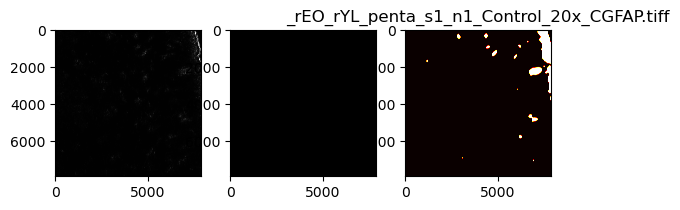

_rEO_rYL_penta_s1_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53434680.0       29.785325      21.012476          1.000000
1      2    718177.0       31.162858      22.829537          1.046249
2      3    651395.0       30.582955      21.354940          1.026779
3      4    557592.0       29.319852      20.334760          0.984372
4      5    462496.0       29.712175      19.866676          0.997544
5      6    367520.0       28.469308      19.084567          0.955817
6      7    272360.0       27.267730      18.523973          0.915475
7      8    177392.0       27.069361      19.657656          0.908815
8      9     82272.0       25.334926      16.604769          0.850584
9   9999   5214469.0       10.662211       5.081214          0.357969


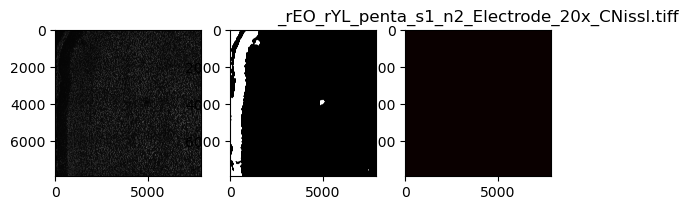

_rEO_rYL_penta_s1_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54864316.0       31.048728      21.888249          1.000000
1      2    747712.0       35.487577      24.554871          1.142964
2      3    652608.0       32.799713      23.499079          1.056395
3      4    557592.0       31.517753      22.613862          1.015106
4      5    462496.0       30.625290      21.243720          0.986362
5      6    367520.0       31.899363      21.954449          1.027397
6      7    272360.0       30.709917      21.832596          0.989088
7      8    177392.0       28.623089      18.899929          0.921876
8      9     82272.0       25.930280      17.569333          0.835148
9   9999   3872255.0       11.174091       5.709767          0.359889


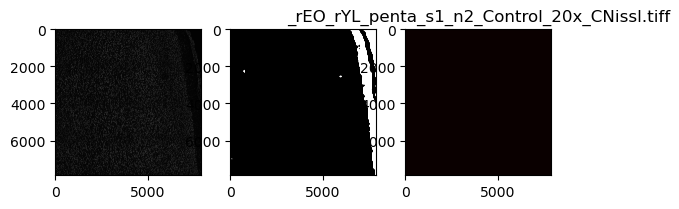

_rEO_rYL_penta_s1_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56922496.0       56.692483      84.123651          1.000000
1      2    733810.0       60.367100      86.799061          1.064817
2      3    652608.0       60.605658      90.243278          1.069025
3      4    557592.0       66.696768     100.030855          1.176466
4      5    462496.0       68.124256     103.321194          1.201645
5      6    367520.0       66.217319      99.853361          1.168009
6      7    272360.0       64.581036      92.311753          1.139146
7      8    177392.0       51.518586      61.001143          0.908738
8      9     82272.0       49.562622      49.447803          0.874236
9   9999   1709807.0       68.718088     178.956789          1.212120


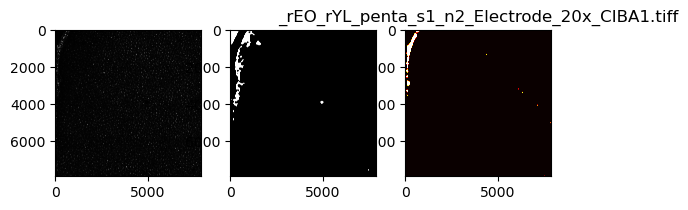

_rEO_rYL_penta_s1_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57641247.0       58.265940      81.757118          1.000000
1      2    747712.0       52.661243      64.777117          0.903808
2      3    652608.0       51.469570      61.828952          0.883356
3      4    557592.0       54.999096      81.052931          0.943932
4      5    462496.0       49.045049      58.478785          0.841745
5      6    367520.0       50.794125      66.651082          0.871764
6      7    272360.0       48.952493      67.105985          0.840156
7      8    177392.0       42.663981      40.408559          0.732228
8      9     82272.0       47.766202      67.956288          0.819796
9   9999   1095324.0      115.884961     263.786391          1.988897


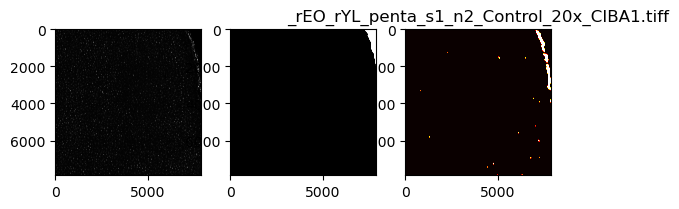

_rEO_rYL_penta_s1_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57067400.0       25.174408      29.822484          1.000000
1      2    747712.0       39.941415      44.719513          1.586588
2      3    652608.0       45.773408      51.220538          1.818252
3      4    557592.0       56.852250      69.074361          2.258335
4      5    462496.0       65.642769      82.475191          2.607520
5      6    367520.0       80.038890      98.328763          3.179375
6      7    272360.0      112.068927     126.670114          4.451701
7      8    177392.0      144.109526     145.212169          5.724446
8      9     82272.0      161.895529     146.201894          6.430957
9   9999   1551001.0      344.928194     454.317218         13.701542


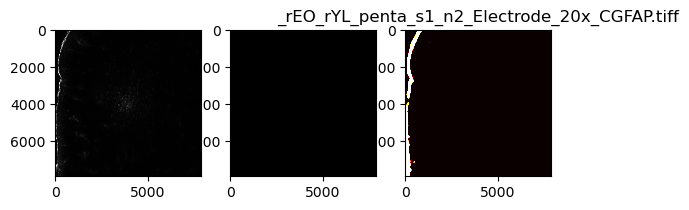

_rEO_rYL_penta_s1_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55652110.0       20.716861      20.108747          1.000000
1      2    747712.0       23.007107      38.166097          1.110550
2      3    652608.0       20.233506      18.390218          0.976669
3      4    557592.0       19.719804      17.342920          0.951872
4      5    462496.0       19.784794      18.362482          0.955009
5      6    367520.0       18.273498      11.849721          0.882059
6      7    272360.0       18.022713      10.325598          0.869954
7      8    177392.0       17.988066      10.499429          0.868281
8      9     82272.0       16.050041       3.849915          0.774733
9   9999   3084461.0      168.127467     293.271015          8.115489


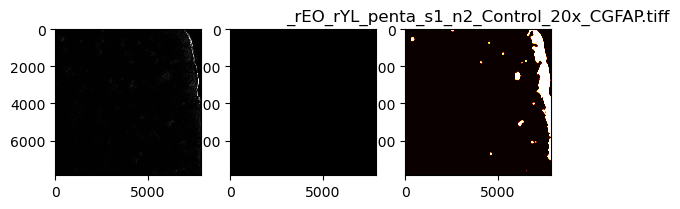

_rEO_rYL_penta_s2_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53658918.0       31.127421      21.600698          1.000000
1      2    712521.0       33.449473      23.382549          1.074598
2      3    641090.0       31.845736      21.801648          1.023077
3      4    545992.0       31.648993      21.036862          1.016756
4      5    450928.0       29.377876      20.558410          0.943794
5      6    355896.0       30.157332      18.684830          0.968835
6      7    260832.0       29.073844      18.159819          0.934027
7      8    165760.0       28.362102      17.990792          0.911161
8      9     70696.0       28.239589      19.020097          0.907225
9   9999   4725166.0       11.476768       5.430976          0.368703


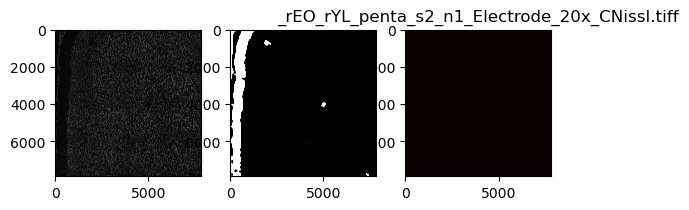

_rEO_rYL_penta_s2_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55959091.0       33.467115      23.762555          1.000000
1      2    736032.0       34.711966      25.032916          1.037196
2      3    641104.0       36.053670      25.258606          1.077286
3      4    545992.0       35.823466      25.362663          1.070408
4      5    450928.0       36.096015      24.072954          1.078552
5      6    355896.0       32.969086      23.397636          0.985119
6      7    260832.0       33.844751      22.361590          1.011284
7      8    165760.0       28.786402      19.950992          0.860140
8      9     70696.0       30.617333      18.056794          0.914848
9   9999   2385728.0       12.640774       6.310389          0.377707


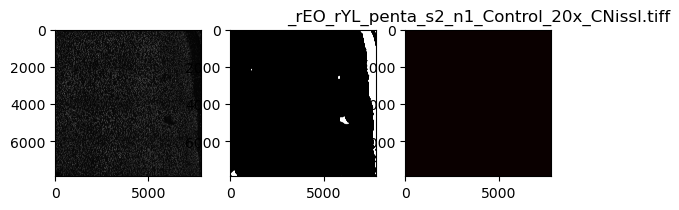

_rEO_rYL_penta_s2_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57150378.0       61.206902      90.883861          1.000000
1      2    722861.0       60.529630      89.315975          0.988935
2      3    641104.0       68.934547     107.596488          1.126254
3      4    545992.0       68.962342     112.858530          1.126709
4      5    450928.0       63.100253      94.570289          1.030934
5      6    355896.0       67.134817      97.708868          1.096850
6      7    260832.0       72.151415     109.753468          1.178812
7      8    165760.0       61.466675      89.632561          1.004244
8      9     70696.0       53.922160      56.285942          0.880982
9   9999   1223352.0       80.973434     199.852872          1.322946


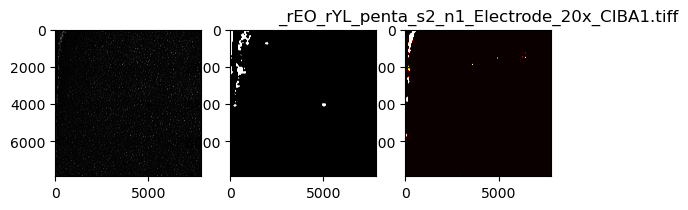

_rEO_rYL_penta_s2_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58124975.0       61.485913      88.825582          1.000000
1      2    736032.0       55.866142      67.898911          0.908601
2      3    641104.0       54.981563      72.968638          0.894214
3      4    545992.0       53.787636      75.605146          0.874796
4      5    450928.0       53.103447      74.169899          0.863669
5      6    355896.0       55.580349      85.385676          0.903953
6      7    260832.0       50.768161      64.737113          0.825688
7      8    165760.0       43.204374      43.317440          0.702671
8      9     70696.0       50.532491      63.671386          0.821855
9   9999    219844.0      128.797638     257.697104          2.094750


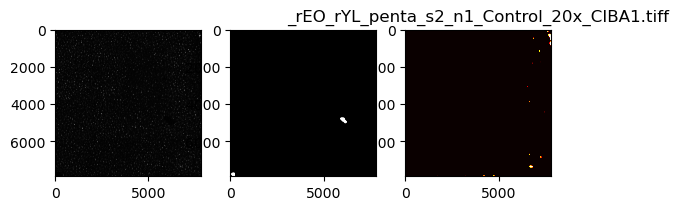

_rEO_rYL_penta_s2_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56681245.0       25.050898      31.588382          1.000000
1      2    736032.0       40.780189      46.916988          1.627893
2      3    641104.0       48.601264      57.104531          1.940101
3      4    545992.0       58.518290      79.419551          2.335976
4      5    450928.0       67.539128      85.057356          2.696076
5      6    355896.0       88.594820     109.521502          3.536593
6      7    260832.0      118.275741     133.299434          4.721417
7      8    165760.0      167.457076     160.633641          6.684674
8      9     70696.0      199.364985     177.711443          7.958397
9   9999   1679314.0      352.546991     432.528498         14.073228


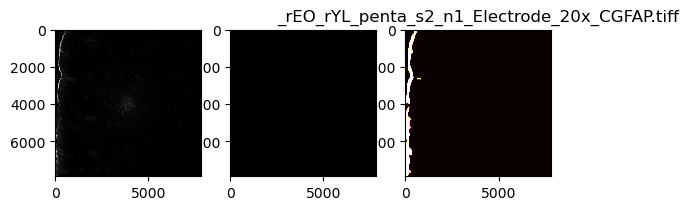

_rEO_rYL_penta_s2_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56921992.0       20.701637      20.952422          1.000000
1      2    736032.0       20.087988      18.883157          0.970357
2      3    641104.0       19.868558      17.722434          0.959758
3      4    545992.0       17.987668      11.543662          0.868901
4      5    450928.0       16.804973       9.692309          0.811770
5      6    355896.0       15.542712       5.724624          0.750796
6      7    260832.0       14.921233       3.457685          0.720776
7      8    165760.0       14.509321       2.961763          0.700878
8      9     70696.0       16.212968       5.156858          0.783173
9   9999   1422827.0      144.847929     221.178000          6.996931


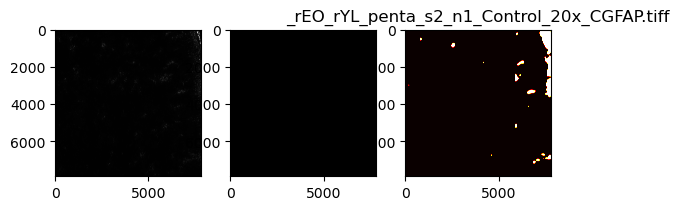

_rEO_rYL_penta_s2_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53572802.0       32.869150      23.956264          1.000000
1      2    736032.0       32.472202      23.456451          0.987923
2      3    641104.0       32.186673      22.700404          0.979237
3      4    545992.0       31.346853      22.073021          0.953686
4      5    450928.0       31.670282      22.227499          0.963526
5      6    355896.0       31.304640      20.161728          0.952402
6      7    260832.0       31.143951      21.544170          0.947513
7      8    165760.0       29.268370      18.509068          0.890451
8      9     70696.0       27.888608      15.974688          0.848474
9   9999   5118217.0       11.309031       7.397469          0.344062


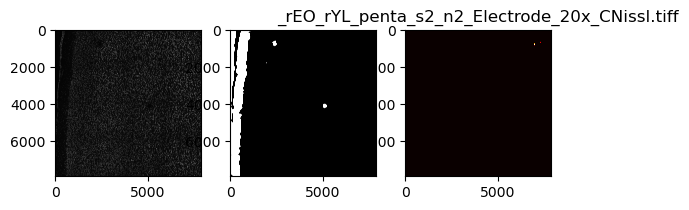

_rEO_rYL_penta_s2_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54930208.0       34.342400      25.079263          1.000000
1      2    736032.0       37.997954      26.218810          1.106444
2      3    641104.0       38.363571      27.566403          1.117091
3      4    545992.0       37.703620      26.775791          1.097874
4      5    450928.0       36.598872      25.085688          1.065705
5      6    355896.0       35.905377      24.497075          1.045512
6      7    260832.0       33.140742      23.428373          0.965009
7      8    165760.0       35.654531      21.904453          1.038207
8      9     70696.0       29.303327      18.531078          0.853270
9   9999   3713671.0       13.118806       7.819241          0.382000


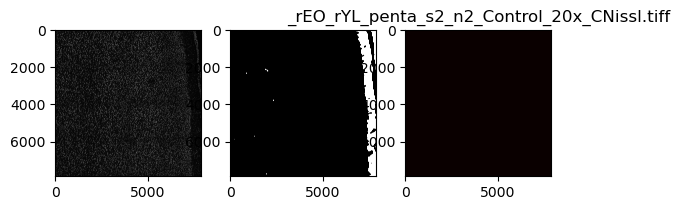

_rEO_rYL_penta_s2_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57502012.0       60.271818      91.334030          1.000000
1      2    736032.0       65.705967      98.515181          1.090161
2      3    641104.0       67.147597     102.274111          1.114079
3      4    545992.0       66.563406     110.871477          1.104387
4      5    450928.0       66.960317     100.581267          1.110972
5      6    355896.0       65.831139      99.936216          1.092237
6      7    260832.0       71.482958     112.668397          1.186010
7      8    165760.0       79.695156     105.389788          1.322262
8      9     70696.0       57.037258      48.451442          0.946334
9   9999   1189007.0       48.013534     154.762794          0.796617


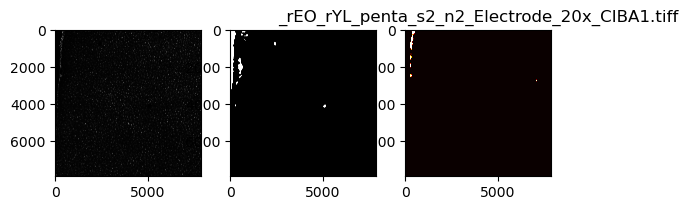

_rEO_rYL_penta_s2_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58092841.0       63.206205      93.442097          1.000000
1      2    736032.0       59.974050      81.608583          0.948863
2      3    641104.0       59.793130      78.478901          0.946001
3      4    545992.0       58.109676      82.457387          0.919367
4      5    450928.0       56.345368      81.943766          0.891453
5      6    355896.0       54.318776      71.132556          0.859390
6      7    260832.0       48.558950      63.843372          0.768262
7      8    165760.0       45.496073      44.939211          0.719804
8      9     70696.0       43.741966      46.124106          0.692052
9   9999    551038.0      191.658428     342.720583          3.032272


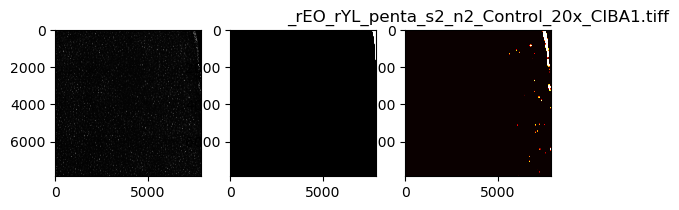

_rEO_rYL_penta_s2_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57601698.0       25.482329      30.963038          1.000000
1      2    736032.0       44.913740      53.017796          1.762545
2      3    641104.0       52.220900      64.982789          2.049299
3      4    545992.0       55.477875      70.153699          2.177112
4      5    450928.0       64.145307      81.193383          2.517247
5      6    355896.0       96.952941     120.605672          3.804713
6      7    260832.0      131.938060     157.513506          5.177630
7      8    165760.0      177.903873     167.776649          6.981460
8      9     70696.0      200.277738     154.844317          7.859475
9   9999   1089321.0      354.876513     440.943770         13.926377


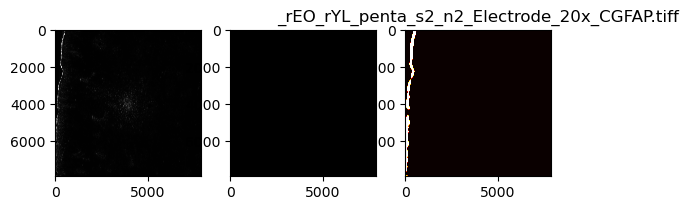

_rEO_rYL_penta_s2_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55870869.0       22.095666      26.596032          1.000000
1      2    736032.0       20.556852      22.111343          0.930357
2      3    641104.0       20.441624      17.032804          0.925142
3      4    545992.0       17.749196       7.413655          0.803289
4      5    450928.0       16.751898       5.584256          0.758153
5      6    355896.0       15.096553       3.037220          0.683236
6      7    260832.0       14.979972       3.456806          0.677960
7      8    165760.0       17.000531      16.489755          0.769406
8      9     70696.0       14.460068       3.811965          0.654430
9   9999   2773010.0      192.845107     302.653288          8.727734


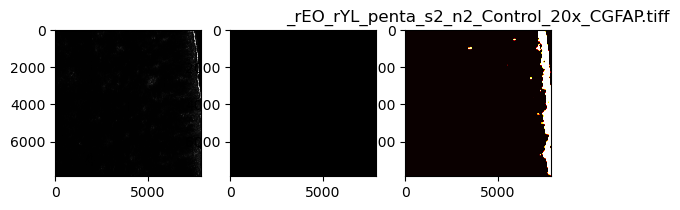

_rEO_rYL_penta_s3_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54293636.0       29.727280      19.125144          1.000000
1      2    736032.0       30.476725      19.526287          1.025211
2      3    641104.0       30.919707      19.409487          1.040112
3      4    545992.0       29.560869      18.187145          0.994402
4      5    450928.0       29.784449      18.395233          1.001923
5      6    355896.0       28.673214      17.347705          0.964542
6      7    260832.0       28.797191      16.481824          0.968713
7      8    165760.0       27.393092      15.751020          0.921480
8      9     70696.0       24.854122      14.920550          0.836071
9   9999   4539187.0       11.528715       6.106234          0.387816


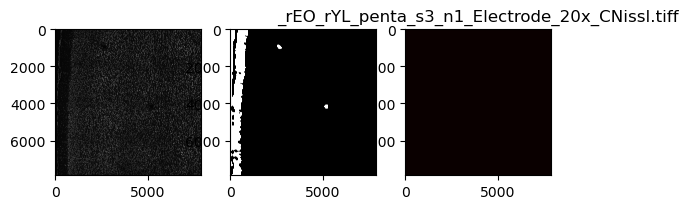

_rEO_rYL_penta_s3_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54584605.0       32.617506      20.990255          1.000000
1      2    736032.0       34.932022      21.802380          1.070959
2      3    641104.0       34.231992      21.163172          1.049498
3      4    545992.0       33.455276      20.957743          1.025685
4      5    450928.0       33.533327      20.683033          1.028078
5      6    355896.0       31.566283      19.036286          0.967771
6      7    260832.0       30.240634      17.895942          0.927129
7      8    165760.0       29.059212      17.225252          0.890908
8      9     70696.0       27.687649      16.130159          0.848859
9   9999   3964645.0       13.680886       7.219445          0.419434


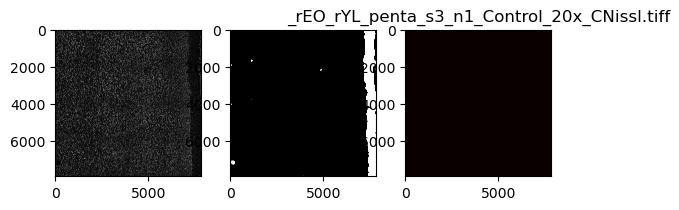

_rEO_rYL_penta_s3_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57992073.0       56.244294      75.481190          1.000000
1      2    736032.0       61.920684      84.125333          1.100924
2      3    641104.0       64.709064      91.818060          1.150500
3      4    545992.0       64.437946      90.123315          1.145680
4      5    450928.0       62.611064      83.417396          1.113199
5      6    355896.0       66.600114      87.894398          1.184122
6      7    260832.0       64.919577      84.089024          1.154243
7      8    165760.0       72.236565     108.259295          1.284336
8      9     70696.0       54.722177      49.513633          0.972937
9   9999    840750.0       21.525299      90.675321          0.382711


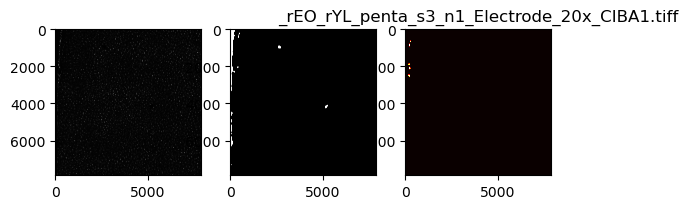

_rEO_rYL_penta_s3_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58403138.0       58.345925      77.881955          1.000000
1      2    736032.0       59.928685      77.669505          1.027127
2      3    641104.0       57.369658      69.543552          0.983268
3      4    545992.0       54.643531      65.954422          0.936544
4      5    450928.0       56.538055      81.657411          0.969015
5      6    355896.0       53.635489      67.615337          0.919267
6      7    260832.0       54.396934      64.394430          0.932318
7      8    165760.0       45.929977      52.078872          0.787201
8      9     70696.0       50.521529      62.037053          0.865896
9   9999    146112.0      139.553014     212.206360          2.391821


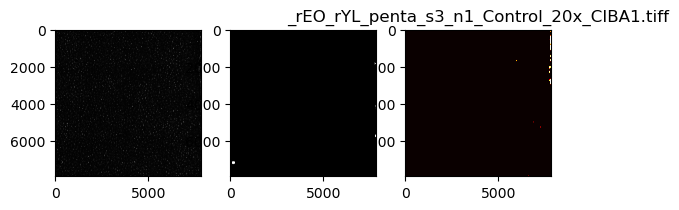

_rEO_rYL_penta_s3_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57685067.0       23.645727      28.615633          1.000000
1      2    736032.0       37.778048      38.574857          1.597669
2      3    641104.0       46.941292      53.849416          1.985191
3      4    545992.0       52.366852      60.167155          2.214643
4      5    450928.0       59.578835      70.042971          2.519645
5      6    355896.0       78.924489      90.570255          3.337791
6      7    260832.0      112.337577     123.035454          4.750862
7      8    165760.0      175.988948     177.724669          7.442738
8      9     70696.0      197.539281     161.663596          8.354122
9   9999   1147756.0      295.163859     371.998367         12.482757


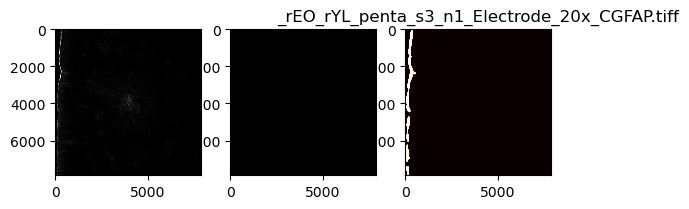

_rEO_rYL_penta_s3_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55597816.0       20.028399      18.436542          1.000000
1      2    736032.0       18.598656      13.558555          0.928614
2      3    641104.0       18.048889      10.798722          0.901165
3      4    545992.0       18.608723      14.687123          0.929117
4      5    450928.0       18.934138       9.507992          0.945365
5      6    355896.0       17.531251       7.637181          0.875320
6      7    260832.0       16.987264       5.889158          0.848159
7      8    165760.0       15.817791       7.106686          0.789768
8      9     70696.0       15.154195       3.070634          0.756635
9   9999   2951434.0      127.268755     192.208976          6.354415


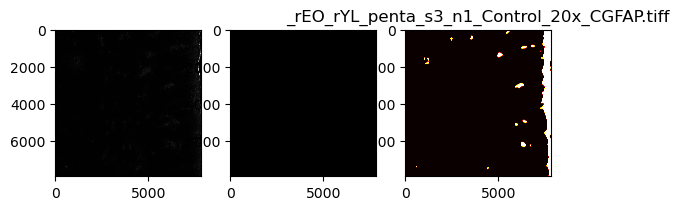

_rEO_rYL_penta_s3_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53724313.0       24.619734      14.281175          1.000000
1      2    736032.0       26.554771      15.172497          1.078597
2      3    641104.0       25.309217      14.006384          1.028005
3      4    545992.0       25.089249      14.085356          1.019071
4      5    450928.0       24.336841      12.938469          0.988509
5      6    355896.0       23.583715      12.491178          0.957919
6      7    260832.0       23.075102      12.166080          0.937260
7      8    165760.0       23.275271      12.237056          0.945391
8      9     70696.0       20.493408      11.539176          0.832398
9   9999   5045486.0       10.522498       4.495586          0.427401


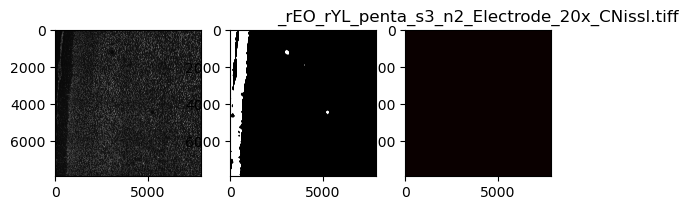

_rEO_rYL_penta_s3_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53540981.0       26.877455      15.973748          1.000000
1      2    736032.0       29.387350      16.497389          1.093383
2      3    641104.0       28.940620      16.462396          1.076762
3      4    545992.0       27.866604      15.311311          1.036802
4      5    450928.0       28.289516      15.170412          1.052537
5      6    355896.0       26.654601      14.281725          0.991709
6      7    260832.0       26.672632      14.141995          0.992379
7      8    165760.0       24.859882      12.446371          0.924934
8      9     70696.0       21.424692      10.350523          0.797125
9   9999   5291842.0       12.029142       6.389052          0.447555


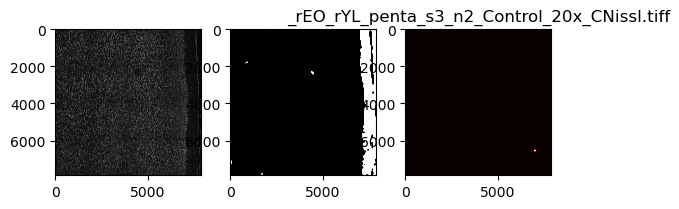

_rEO_rYL_penta_s3_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58002000.0       45.815440      57.262705          1.000000
1      2    736032.0       50.411200      63.564636          1.100310
2      3    641104.0       51.359541      65.419644          1.121009
3      4    545992.0       53.304955      67.828620          1.163471
4      5    450928.0       54.771673      65.763808          1.195485
5      6    355896.0       54.830771      69.636374          1.196775
6      7    260832.0       53.025001      56.862783          1.157361
7      8    165760.0       50.996284      54.171035          1.113081
8      9     70696.0       51.845324      70.188132          1.131612
9   9999    767799.0       28.402486      97.413465          0.619933


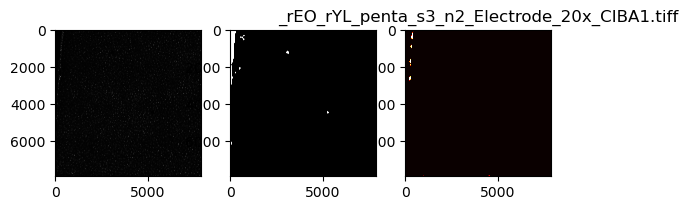

_rEO_rYL_penta_s3_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58292978.0       51.256139      66.414422          1.000000
1      2    736032.0       53.327592      66.564921          1.040414
2      3    641104.0       54.037609      66.874282          1.054266
3      4    545992.0       52.929094      66.294380          1.032639
4      5    450928.0       52.964549      64.276716          1.033331
5      6    355896.0       48.055466      54.606637          0.937555
6      7    260832.0       50.255310      64.341044          0.980474
7      8    165760.0       47.769468      54.444408          0.931976
8      9     70696.0       45.607205      45.322650          0.889790
9   9999    539845.0       30.793215     111.076623          0.600771


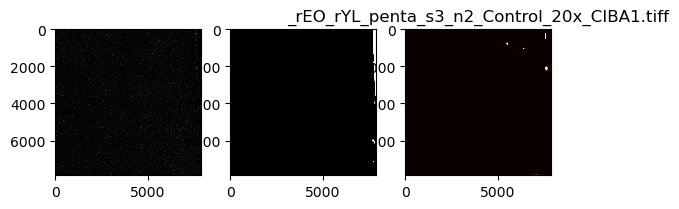

_rEO_rYL_penta_s3_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57589593.0       22.284267      23.966214          1.000000
1      2    736032.0       39.990605      45.267637          1.794567
2      3    641104.0       42.023017      47.936077          1.885771
3      4    545992.0       46.408030      50.895099          2.082547
4      5    450928.0       57.125918      68.766089          2.563509
5      6    355896.0       71.661494      81.682014          3.215789
6      7    260832.0       94.713804      98.359728          4.250254
7      8    165760.0      117.940788     116.223400          5.292559
8      9     70696.0      144.679444     124.598577          6.492448
9   9999   1180206.0      241.400672     345.401478         10.832785


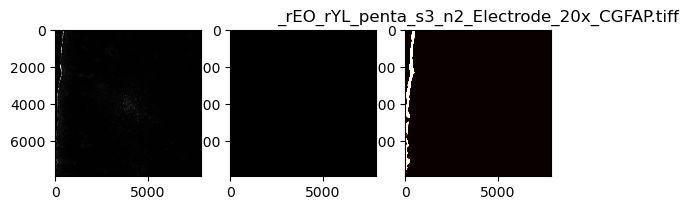

_rEO_rYL_penta_s3_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55603351.0       20.020192      18.294947          1.000000
1      2    736032.0       25.735234      38.829168          1.285464
2      3    641104.0       22.182605      18.030527          1.108012
3      4    545992.0       21.117286      15.025067          1.054799
4      5    450928.0       19.555907      11.285761          0.976809
5      6    355896.0       17.957839       9.319010          0.896986
6      7    260832.0       18.314486      14.421344          0.914801
7      8    165760.0       17.070071      13.943398          0.852643
8      9     70696.0       15.976689       3.432869          0.798029
9   9999   3229472.0      138.807966     203.500524          6.933398


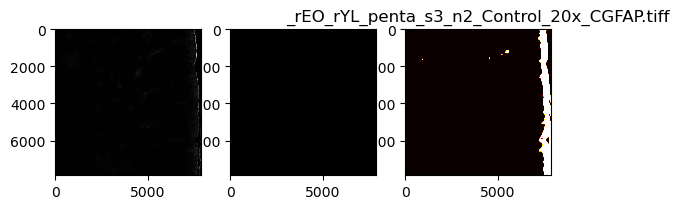

_rEO_rYL_penta_s4_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53470596.0       27.521913      16.766538          1.000000
1      2    736032.0       28.737016      16.207635          1.044150
2      3    641104.0       29.254815      16.531258          1.062964
3      4    545992.0       28.277231      16.700397          1.027444
4      5    450928.0       29.608616      15.732916          1.075820
5      6    355896.0       28.560816      15.218252          1.037748
6      7    260832.0       25.992440      13.810471          0.944427
7      8    165760.0       24.907300      13.428338          0.904999
8      9     70696.0       24.405157      13.913895          0.886754
9   9999   5362227.0       11.617920       4.528256          0.422133


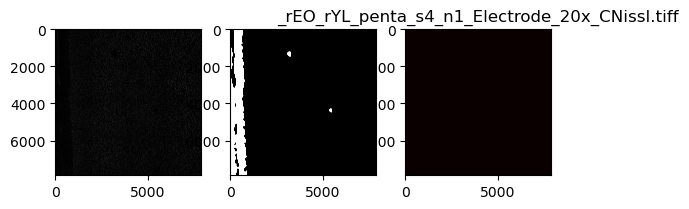

_rEO_rYL_penta_s4_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52622196.0       29.584566      17.781553          1.000000
1      2    719140.0       31.154067      18.404682          1.053051
2      3    614695.0       31.342711      18.004573          1.059428
3      4    545471.0       31.030539      17.592760          1.048876
4      5    450928.0       31.118626      16.675311          1.051853
5      6    355896.0       30.669488      15.843807          1.036672
6      7    260832.0       29.668745      15.490326          1.002845
7      8    165760.0       28.274270      14.267179          0.955710
8      9     70696.0       23.035165      12.365101          0.778621
9   9999   6199313.0       12.647638       5.761828          0.427508


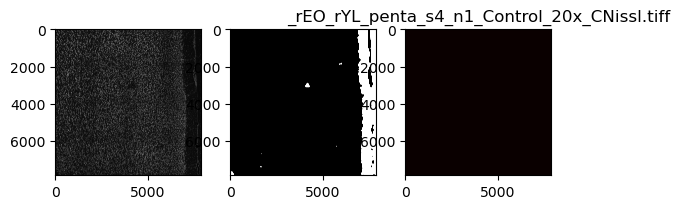

_rEO_rYL_penta_s4_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58061210.0       50.098389      65.082624          1.000000
1      2    736032.0       58.666853      76.731368          1.171033
2      3    641104.0       58.339134      76.759981          1.164491
3      4    545992.0       58.463038      74.821637          1.166964
4      5    450928.0       61.095215      79.401505          1.219505
5      6    355896.0       60.740298      74.297558          1.212420
6      7    260832.0       61.221334      70.721416          1.222022
7      8    165760.0       60.538049      75.828652          1.208383
8      9     70696.0       45.086936      36.146850          0.899968
9   9999    771613.0       31.887108      71.600291          0.636490


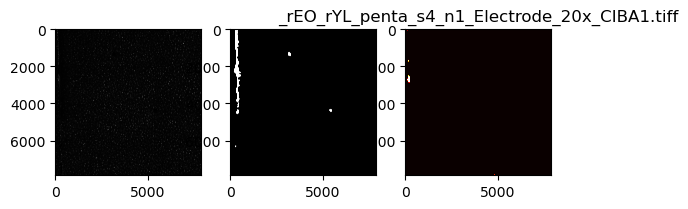

_rEO_rYL_penta_s4_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58237177.0       52.349087      66.499534          1.000000
1      2    736032.0       52.664869      64.350473          1.006032
2      3    641104.0       54.494282      62.241084          1.040979
3      4    545992.0       51.372088      60.116895          0.981337
4      5    450928.0       49.022389      57.989118          0.936452
5      6    355896.0       49.476524      54.296165          0.945127
6      7    260832.0       50.174572      57.387915          0.958461
7      8    165760.0       54.708229      81.367075          1.045066
8      9     70696.0       38.923786      35.725630          0.743543
9   9999    540510.0       75.718925     142.229145          1.446423


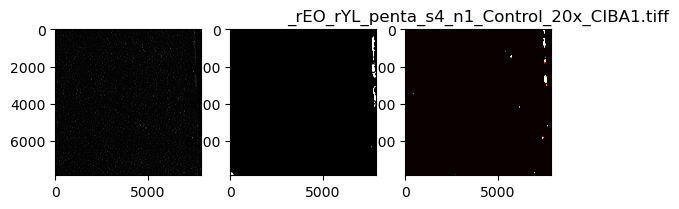

_rEO_rYL_penta_s4_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57223784.0       27.082436      32.316580          1.000000
1      2    736032.0       48.021477      59.088973          1.773159
2      3    641104.0       49.062185      60.850315          1.811587
3      4    545992.0       54.666902      65.349256          2.018537
4      5    450928.0       60.346694      78.465283          2.228259
5      6    355896.0       70.231534      83.273077          2.593250
6      7    260832.0      100.944263     115.198085          3.727296
7      8    165760.0      140.154078     142.800469          5.175091
8      9     70696.0      160.164705     120.608294          5.913970
9   9999   1609039.0      273.754335     321.597033         10.108187


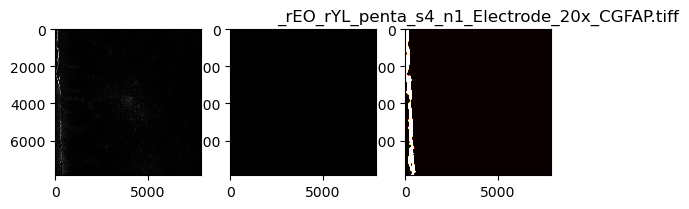

_rEO_rYL_penta_s4_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54375353.0       21.445832      19.392066          1.000000
1      2    736032.0       29.250418      42.864429          1.363921
2      3    641104.0       28.468718      36.137092          1.327471
3      4    545992.0       27.247211      26.996667          1.270513
4      5    450928.0       21.580002      15.612708          1.006256
5      6    355896.0       17.412272       5.001597          0.811919
6      7    260832.0       16.765504       4.170189          0.781760
7      8    165760.0       15.885805       4.223139          0.740741
8      9     70696.0       14.690350       2.669046          0.684998
9   9999   4402334.0      166.326160     233.158698          7.755640


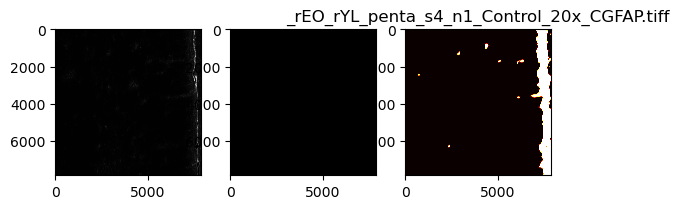

_rEO_rYL_penta_s4_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52984867.0       36.178769      25.136313          1.000000
1      2    736032.0       37.945347      25.113530          1.048829
2      3    641104.0       38.812609      24.981752          1.072801
3      4    545992.0       37.263187      24.148545          1.029974
4      5    450928.0       36.247989      23.110265          1.001913
5      6    355896.0       34.552690      22.640129          0.955054
6      7    260832.0       35.005387      21.292556          0.967567
7      8    165760.0       32.664509      20.946521          0.902864
8      9     70696.0       29.320174      18.794968          0.810425
9   9999   5383518.0       13.175596       7.132006          0.364180


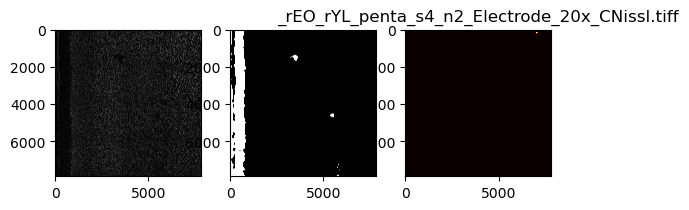

_rEO_rYL_penta_s4_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54301440.0       30.130025      19.364413          1.000000
1      2    730320.0       31.988501      20.281264          1.061682
2      3    634658.0       32.158153      20.717504          1.067313
3      4    545992.0       32.537094      19.741793          1.079889
4      5    450928.0       31.897895      18.925275          1.058675
5      6    355896.0       30.330852      18.364294          1.006665
6      7    260832.0       30.134424      17.278860          1.000146
7      8    165760.0       27.120463      15.565916          0.900114
8      9     70696.0       24.976434      13.618794          0.828955
9   9999   4543541.0       12.898989       6.116255          0.428111


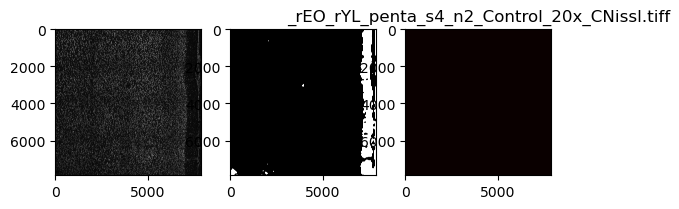

_rEO_rYL_penta_s4_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58043428.0       65.698149      97.593209          1.000000
1      2    736032.0       76.225834     112.243392          1.160243
2      3    641104.0       76.685419     109.033607          1.167239
3      4    545992.0       75.664856     112.580654          1.151705
4      5    450928.0       77.479524     114.354316          1.179326
5      6    355896.0       71.201480      97.071792          1.083767
6      7    260832.0       83.355631     125.852302          1.268767
7      8    165760.0       80.328789     108.311622          1.222695
8      9     70696.0       58.873769      58.644268          0.896125
9   9999    324957.0      119.450395     227.349193          1.818170


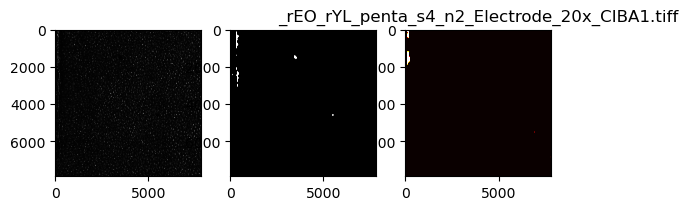

_rEO_rYL_penta_s4_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58419525.0       53.694399      72.897337          1.000000
1      2    736032.0       55.983911      69.984200          1.042640
2      3    641104.0       55.491696      71.959898          1.033473
3      4    545992.0       55.977919      68.579636          1.042528
4      5    450928.0       55.894631      75.386245          1.040977
5      6    355896.0       57.685675      76.399684          1.074333
6      7    260832.0       50.900449      67.840736          0.947966
7      8    165760.0       46.288845      65.067391          0.862080
8      9     70696.0       52.709177      69.337054          0.981651
9   9999    413298.0      182.350428     234.920219          3.396079


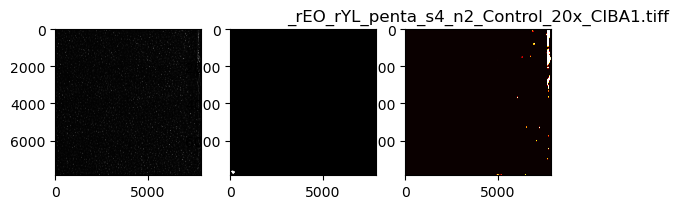

_rEO_rYL_penta_s4_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56527735.0       32.167534      46.527835          1.000000
1      2    736032.0       55.962139      81.952167          1.739709
2      3    641104.0       60.549547      80.839178          1.882319
3      4    545992.0       71.173799     102.113200          2.212597
4      5    450928.0       84.692787     124.555947          2.632865
5      6    355896.0       86.887762     119.504276          2.701101
6      7    260832.0      119.383136     150.055737          3.711293
7      8    165760.0      172.102745     201.659872          5.350200
8      9     70696.0      207.261118     211.476432          6.443177
9   9999   1840650.0      384.925845     445.563167         11.966284


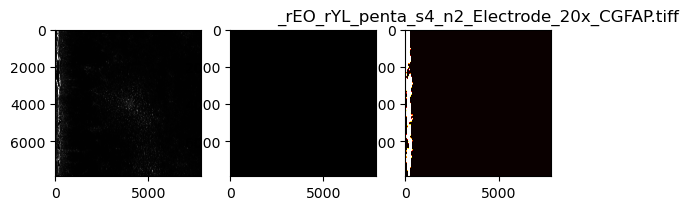

_rEO_rYL_penta_s4_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54660158.0       24.310850      26.276954          1.000000
1      2    736032.0       27.393953      28.184755          1.126820
2      3    641104.0       31.085056      37.733057          1.278649
3      4    545992.0       30.150244      34.611893          1.240197
4      5    450928.0       24.818004      24.613797          1.020861
5      6    355896.0       21.935813      18.916281          0.902305
6      7    260832.0       18.118387       8.854248          0.745280
7      8    165760.0       18.266476       7.855206          0.751371
8      9     70696.0       17.757667       6.768572          0.730442
9   9999   4172665.0      219.551318     318.584445          9.031001


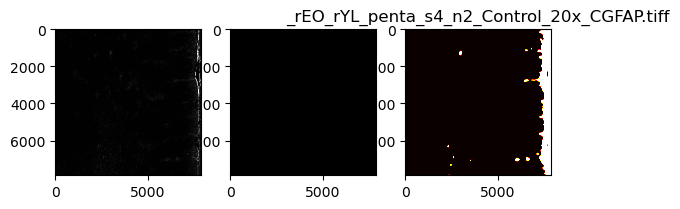

_rEO_rYL_penta_s5_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53854284.0       39.476356      28.232532          1.000000
1      2    736032.0       43.879265      30.008741          1.111533
2      3    641104.0       42.750448      28.517925          1.082938
3      4    545992.0       41.749079      27.785366          1.057572
4      5    450928.0       41.211287      27.066290          1.043949
5      6    355896.0       38.608329      25.801550          0.978011
6      7    260832.0       36.209970      24.167114          0.917257
7      8    165760.0       37.967079      23.405070          0.961768
8      9     70696.0       31.382709      20.427299          0.794975
9   9999   4608363.0       14.066852       7.087850          0.356336


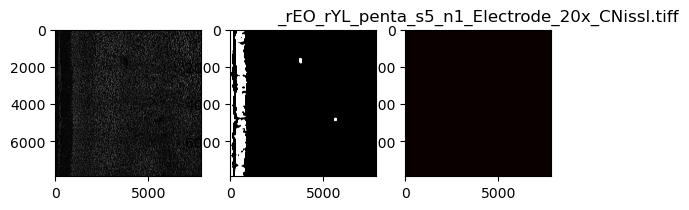

_rEO_rYL_penta_s5_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53812763.0       41.497467      29.024399          1.000000
1      2    736032.0       44.822650      30.788985          1.080130
2      3    641104.0       43.636820      28.612483          1.051554
3      4    545992.0       41.741945      27.646728          1.005891
4      5    450928.0       40.205254      26.382094          0.968860
5      6    355896.0       39.780554      25.831317          0.958626
6      7    260832.0       38.570931      25.056016          0.929477
7      8    165760.0       35.629193      22.684484          0.858587
8      9     70696.0       30.156544      18.237593          0.726708
9   9999   4838986.0       14.916170       8.116495          0.359448


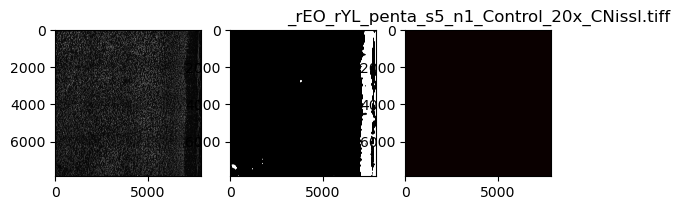

_rEO_rYL_penta_s5_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58242671.0       82.061325     128.261901          1.000000
1      2    736032.0       95.315357     143.005127          1.161514
2      3    641104.0       89.262858     132.047022          1.087758
3      4    545992.0       96.948655     151.112198          1.181417
4      5    450928.0       98.625652     154.160418          1.201853
5      6    355896.0       90.889999     137.577538          1.107586
6      7    260832.0       97.627864     152.286524          1.189694
7      8    165760.0       83.962856     114.519351          1.023172
8      9     70696.0       68.043906      70.735652          0.829184
9   9999    219976.0      180.538554     299.030633          2.200044


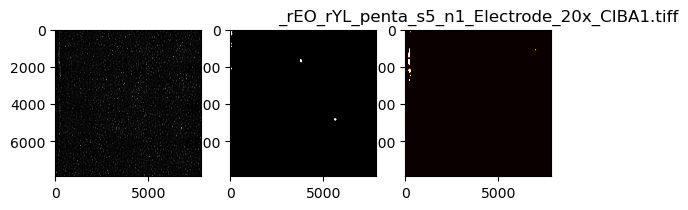

_rEO_rYL_penta_s5_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58445935.0       81.940589     124.672302          1.000000
1      2    736032.0       83.679256     123.795147          1.021219
2      3    641104.0       83.133540     127.339773          1.014559
3      4    545992.0       77.430428     111.277713          0.944958
4      5    450928.0       80.622088     115.003929          0.983909
5      6    355896.0       79.313586     112.267735          0.967940
6      7    260832.0       69.928855      94.858295          0.853409
7      8    165760.0       74.179778     109.510865          0.905287
8      9     70696.0       69.077543      92.939996          0.843020
9   9999    205814.0      256.148323     320.373832          3.126025


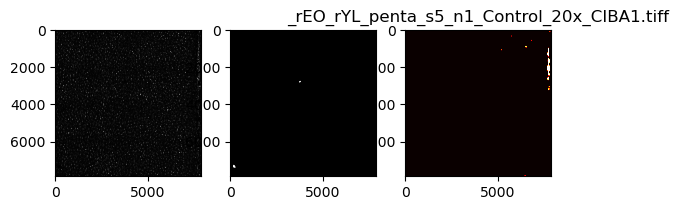

_rEO_rYL_penta_s5_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56517871.0       42.689746      73.564736          1.000000
1      2    736032.0       73.094408     111.144915          1.712224
2      3    641104.0       84.910004     130.081494          1.989002
3      4    545992.0       81.436270     124.323980          1.907631
4      5    450928.0       91.454352     133.471837          2.142303
5      6    355896.0      106.019933     143.542260          2.483499
6      7    260832.0      150.072805     207.953524          3.515430
7      8    165760.0      191.976460     213.846399          4.497016
8      9     70696.0      265.752532     254.258089          6.225208
9   9999   1944776.0      473.778175     518.384932         11.098173


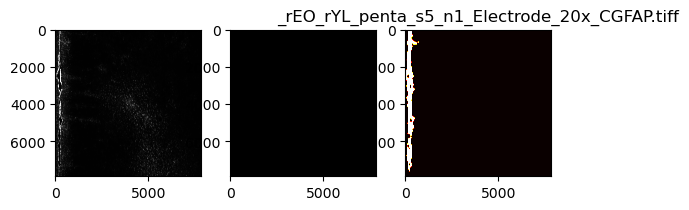

_rEO_rYL_penta_s5_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54429277.0       33.701696      46.424830          1.000000
1      2    736032.0       37.591652      52.631778          1.115423
2      3    641104.0       35.366377      46.062616          1.049395
3      4    545992.0       33.017286      40.809401          0.979692
4      5    450928.0       37.290137      45.561392          1.106477
5      6    355896.0       37.051894      46.701514          1.099407
6      7    260832.0       36.494479      44.155395          1.082868
7      8    165760.0       41.193569      43.974476          1.222300
8      9     70696.0       57.607531      62.724748          1.709336
9   9999   4222472.0      264.277414     358.183278          7.841665


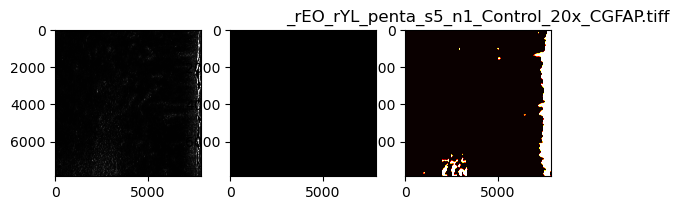

_rEO_rYL_penta_s5_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53623323.0       35.862525      24.626031          1.000000
1      2    736032.0       36.692413      24.622246          1.023141
2      3    641104.0       36.591438      24.709771          1.020325
3      4    545992.0       35.916464      23.351495          1.001504
4      5    450928.0       35.451134      21.354723          0.988529
5      6    355896.0       33.880114      21.328299          0.944722
6      7    260832.0       33.924890      20.951248          0.945971
7      8    165760.0       33.745729      19.923334          0.940975
8      9     70696.0       32.208215      18.578280          0.898102
9   9999   5036205.0       12.789998       7.018549          0.356640


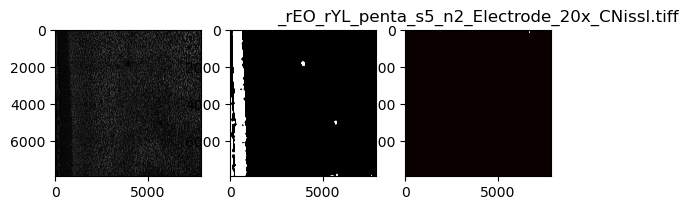

_rEO_rYL_penta_s5_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  55349634.0       35.166372      23.916831          1.000000
1      2    736032.0       35.446918      24.428499          1.007978
2      3    641104.0       35.530968      23.452862          1.010368
3      4    545992.0       34.583730      22.618141          0.983432
4      5    440795.0       33.030470      22.131515          0.939263
5      6    354428.0       31.924670      23.207366          0.907818
6      7    260832.0       31.440533      21.038807          0.894051
7      8    165760.0       29.201532      19.214743          0.830382
8      9     70696.0       29.247426      17.169651          0.831687
9   9999   3360864.0       13.440734       6.696009          0.382204


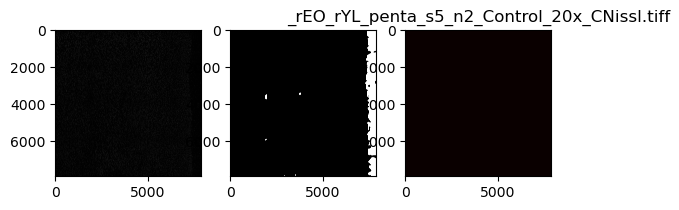

_rEO_rYL_penta_s5_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58290339.0       74.144442     114.190922          1.000000
1      2    736032.0       80.009232     124.242541          1.079100
2      3    641104.0       79.387778     117.772421          1.070718
3      4    545992.0       86.311232     127.974007          1.164096
4      5    450928.0       84.584359     124.673408          1.140805
5      6    355896.0       86.172371     127.459052          1.162223
6      7    260832.0       83.686687     126.876409          1.128698
7      8    165760.0       91.623799     123.275084          1.235747
8      9     70696.0       61.836921      65.197886          0.834006
9   9999    369189.0      113.419295     208.641089          1.529707


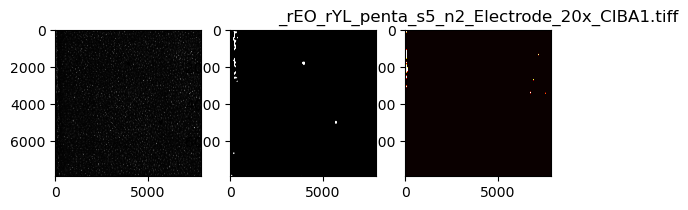

_rEO_rYL_penta_s5_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58647200.0       72.047086     108.545145          1.000000
1      2    736032.0       72.960150     104.555864          1.012673
2      3    641104.0       71.810613     116.821273          0.996718
3      4    545992.0       68.025273     102.220208          0.944178
4      5    446724.0       66.578650      93.087213          0.924099
5      6    355752.0       77.346919     121.594063          1.073561
6      7    260832.0       67.624019     103.119213          0.938609
7      8    165760.0       74.834640     105.333062          1.038691
8      9     70696.0       59.101420      79.725959          0.820317
9   9999     56045.0      166.303809     304.766461          2.308266


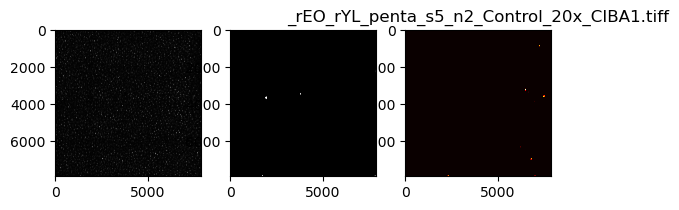

_rEO_rYL_penta_s5_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57327630.0       45.367352      77.342775          1.000000
1      2    736032.0       71.454919     104.517925          1.575030
2      3    641104.0       77.716487     118.744277          1.713049
3      4    545992.0       87.029424     124.503197          1.918327
4      5    450928.0       93.087943     129.385050          2.051871
5      6    355896.0      101.799371     145.366668          2.243891
6      7    260832.0      161.075416     208.810154          3.550470
7      8    165760.0      199.991476     214.105992          4.408269
8      9     70696.0      176.971484     155.394110          3.900855
9   9999   1331898.0      495.474712     537.751033         10.921394


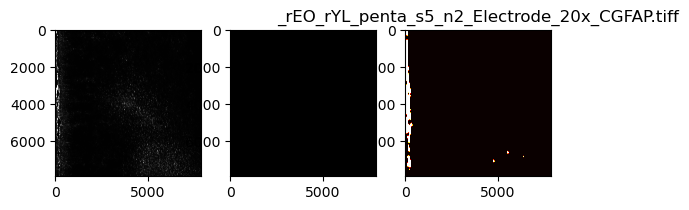

_rEO_rYL_penta_s5_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57961225.0       34.934820      49.861496          1.000000
1      2    736032.0       38.490972      57.078687          1.101794
2      3    641104.0       39.127600      57.524483          1.120017
3      4    545992.0       42.743778      59.848337          1.223529
4      5    450928.0       38.338125      46.531448          1.097419
5      6    355896.0       51.707625      75.346359          1.480117
6      7    260832.0       54.790474      67.196744          1.568363
7      8    165760.0       44.959978      62.325378          1.286968
8      9     70696.0       34.399188      33.338246          0.984668
9   9999    737672.0      186.311066     214.670647          5.333105


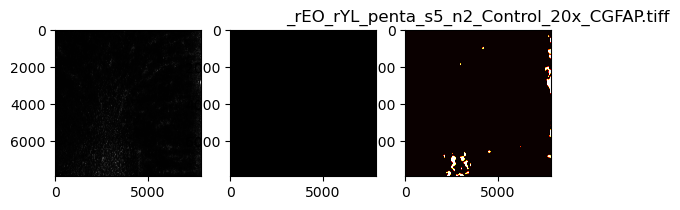

_rEO_rYL_penta_s6_n1_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  53322969.0       30.773389      19.459098          1.000000
1      2    736032.0       32.744680      19.844768          1.064058
2      3    641104.0       32.115925      18.641633          1.043627
3      4    545992.0       32.396482      18.827997          1.052743
4      5    450928.0       31.292386      18.338364          1.016865
5      6    355896.0       32.196279      18.684414          1.046238
6      7    260832.0       29.317020      16.561527          0.952674
7      8    165760.0       29.240927      15.671097          0.950202
8      9     70696.0       23.806340      13.879473          0.773602
9   9999   5509854.0       11.270367       5.233998          0.366237


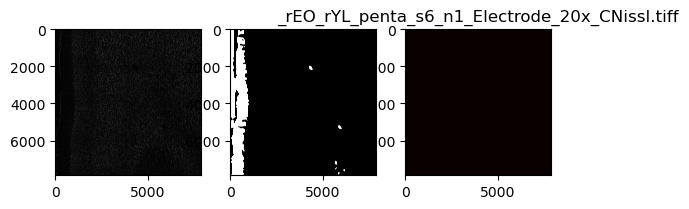

_rEO_rYL_penta_s6_n1_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  54354910.0       33.124030      21.318194          1.000000
1      2    736032.0       35.293038      21.140467          1.065481
2      3    641104.0       33.617079      21.014782          1.014885
3      4    545992.0       32.567946      19.698580          0.983212
4      5    450928.0       30.713449      18.286340          0.927226
5      6    355896.0       29.828781      17.690179          0.900518
6      7    260832.0       29.381211      16.693403          0.887006
7      8    165760.0       25.955460      14.946436          0.783584
8      9     70696.0       25.363783      13.718854          0.765722
9   9999   4477913.0       12.880863       6.119969          0.388868


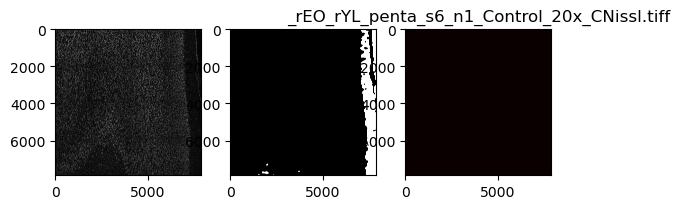

_rEO_rYL_penta_s6_n1_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57599990.0       65.913237      93.623073          1.000000
1      2    736032.0       70.817774      98.514475          1.074409
2      3    641104.0       71.957792     107.871108          1.091705
3      4    545992.0       71.220553     100.519379          1.080520
4      5    450928.0       71.600672     102.138948          1.086287
5      6    355896.0       73.005094     100.392904          1.107594
6      7    260832.0       74.263906     101.154145          1.126692
7      8    165760.0       76.036372     107.341666          1.153583
8      9     70696.0       51.696602      72.357794          0.784313
9   9999   1232833.0       18.604240      65.632495          0.282253


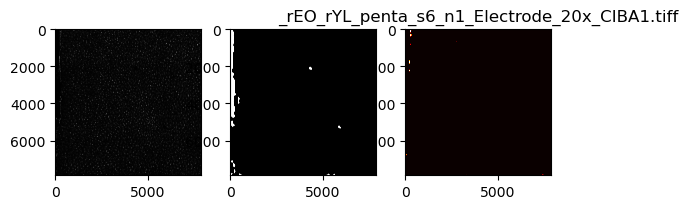

_rEO_rYL_penta_s6_n1_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58295223.0       70.972357     100.485047          1.000000
1      2    736032.0       68.928908      93.900038          0.971208
2      3    641104.0       69.917704      96.066560          0.985140
3      4    545992.0       68.005079      93.169968          0.958191
4      5    450928.0       65.329239      87.174547          0.920489
5      6    355896.0       61.244993      81.418841          0.862942
6      7    260832.0       72.566679     101.059527          1.022464
7      8    165760.0       61.275875      79.703202          0.863377
8      9     70696.0       53.239943      64.028245          0.750150
9   9999    537600.0       42.555898     141.294812          0.599612


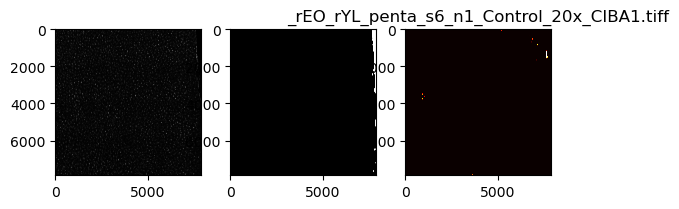

_rEO_rYL_penta_s6_n1_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58072585.0       48.758185      78.359946          1.000000
1      2    736032.0       64.667709      98.081860          1.326294
2      3    641104.0       76.393414     110.462262          1.566781
3      4    545992.0       77.756819     107.821320          1.594744
4      5    450928.0       75.609676      97.464323          1.550707
5      6    355896.0       80.847118      99.669272          1.658124
6      7    260832.0      115.007388     144.147244          2.358730
7      8    165760.0      153.641421     155.780468          3.151090
8      9     70696.0      163.792676     135.713801          3.359286
9   9999    760238.0      464.494356     532.492377          9.526490


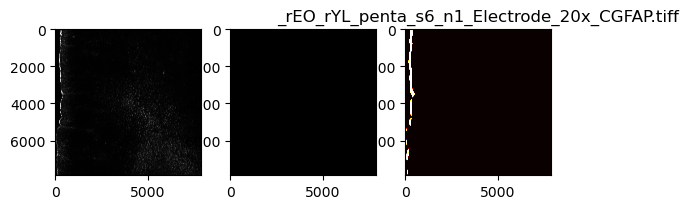

_rEO_rYL_penta_s6_n1_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57920430.0       45.425619      64.681754          1.000000
1      2    736032.0       45.903095      78.482245          1.010511
2      3    641104.0       45.072732      69.804261          0.992232
3      4    545992.0       38.023336      57.595767          0.837046
4      5    450928.0       33.312740      37.417889          0.733347
5      6    355896.0       31.358504      37.421924          0.690326
6      7    260832.0       31.462393      38.981451          0.692613
7      8    165760.0       33.925314      37.676676          0.746832
8      9     70696.0       25.178426      20.400604          0.554278
9   9999    912393.0      351.952862     481.409884          7.747894


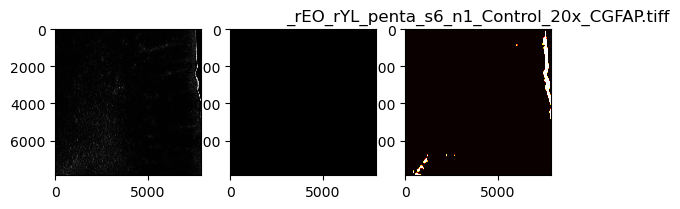

_rEO_rYL_penta_s6_n2_Electrode_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  52820096.0       25.213129      16.374866          1.000000
1      2    736032.0       27.923066      16.631829          1.107481
2      3    641104.0       25.972580      15.352757          1.030121
3      4    545992.0       24.455043      14.110048          0.969933
4      5    450928.0       24.538024      13.996340          0.973224
5      6    355896.0       24.949645      13.611998          0.989550
6      7    260832.0       24.596426      13.976251          0.975540
7      8    165760.0       22.082939      11.807395          0.875851
8      9     70696.0       23.075591      12.400391          0.915221
9   9999   5878873.0       15.219752      17.864489          0.603644


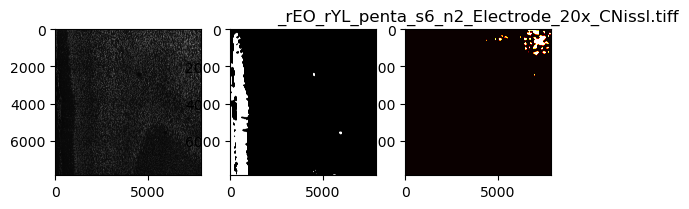

_rEO_rYL_penta_s6_n2_Control_20x_CNissl.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  56040774.0       28.347158      18.511983          1.000000
1      2    736032.0       29.845716      18.618381          1.052864
2      3    641104.0       29.889859      18.206383          1.054422
3      4    545992.0       29.834285      17.105972          1.052461
4      5    450928.0       28.839478      16.519627          1.017368
5      6    355896.0       28.628591      16.329595          1.009928
6      7    260832.0       26.659359      15.099003          0.940460
7      8    165760.0       24.799668      13.261235          0.874856
8      9     70696.0       24.989603      12.325816          0.881556
9   9999   2792049.0       10.907815       5.324282          0.384794


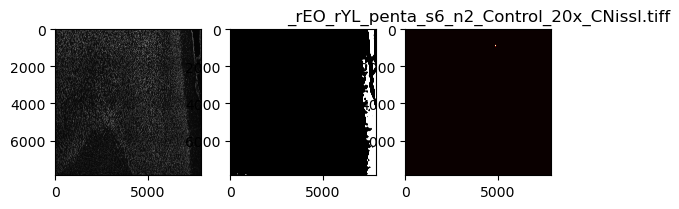

_rEO_rYL_penta_s6_n2_Electrode_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  57298540.0       51.909529      69.665233          1.000000
1      2    736032.0       54.257591      73.225765          1.045234
2      3    641104.0       52.150614      62.793616          1.004644
3      4    545992.0       53.935034      70.107335          1.039020
4      5    450928.0       56.462914      70.528018          1.087718
5      6    355896.0       54.016336      70.840818          1.040586
6      7    260832.0       46.898130      51.821139          0.903459
7      8    165760.0       47.347828      63.275353          0.912122
8      9     70696.0       40.277908      48.760978          0.775925
9   9999   1400429.0       85.215757     154.461109          1.641621


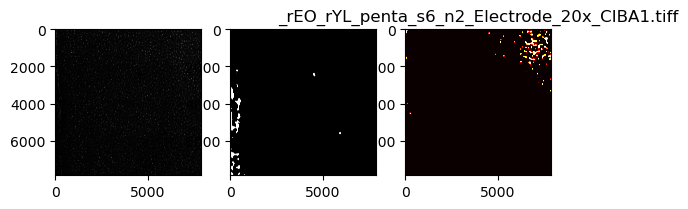

_rEO_rYL_penta_s6_n2_Control_20x_CIBA1.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58030492.0       61.210591      83.196502          1.000000
1      2    736032.0       59.424164      77.027160          0.970815
2      3    641104.0       60.414214      79.771464          0.986990
3      4    545992.0       64.429164      94.164565          1.052582
4      5    450928.0       57.811589      76.832329          0.944470
5      6    355896.0       62.550414      86.397731          1.021889
6      7    260832.0       54.612555      72.337440          0.892208
7      8    165760.0       58.892399      76.878333          0.962128
8      9     70696.0       48.556524      70.848923          0.793270
9   9999    802331.0       62.694218     160.167141          1.024238


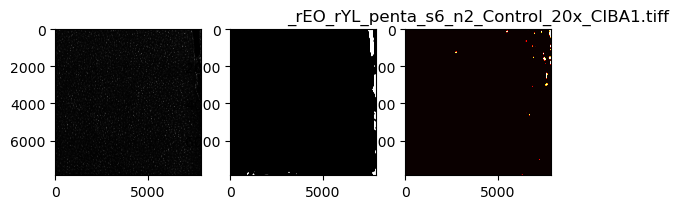

_rEO_rYL_penta_s6_n2_Electrode_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58238886.0       48.491765      74.121091          1.000000
1      2    736032.0       58.920719      81.359196          1.215066
2      3    641104.0       64.865983      89.582293          1.337670
3      4    545992.0       71.179133      93.449541          1.467860
4      5    450928.0       67.171526      88.164110          1.385215
5      6    355896.0       69.707639      84.695002          1.437515
6      7    260832.0       82.524518      98.469188          1.701825
7      8    165760.0       94.902075     104.748254          1.957076
8      9     70696.0      103.127051      98.453002          2.126692
9   9999    460083.0      465.155774     518.265429          9.592469


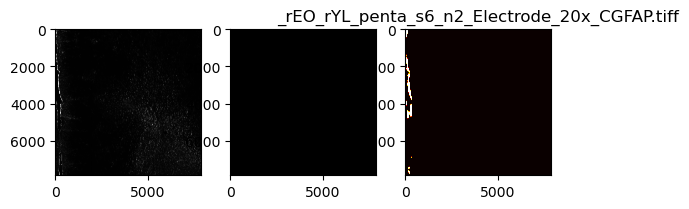

_rEO_rYL_penta_s6_n2_Control_20x_CGFAP.tiff
   label        area  intensity_mean  intensity_std  pooled norm mean
0      1  58003061.0       45.578908      60.916386          1.000000
1      2    736032.0       48.736979      66.957944          1.069288
2      3    641104.0       42.628073      54.612524          0.935259
3      4    545992.0       43.081615      55.555152          0.945209
4      5    450928.0       44.698724      55.071554          0.980689
5      6    355896.0       39.397970      45.317975          0.864390
6      7    260832.0       30.649813      28.948379          0.672456
7      8    165760.0       28.535189      29.893617          0.626061
8      9     70696.0       21.225939      13.789455          0.465697
9   9999    829762.0      388.151543     464.081673          8.516034


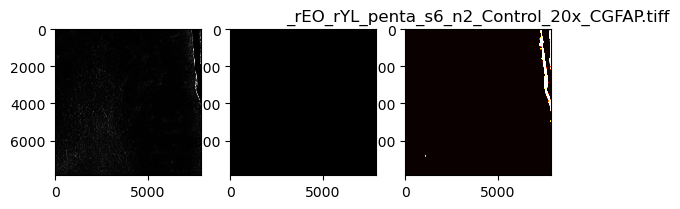

In [5]:
animals = ["rEO_rYL_duo", "rEO_rYL_trio","rEO_rYL_quad", "rEO_rYL_penta"]
for animalid in animals:
    path20x = os.path.join(root, animalid, "histology", "20X_ZMax")
    metadf = pd.read_csv(os.path.join(root, animalid, "histology", "metadata.csv"))
    maskpath = os.path.join(root, animalid, "histology", "Masks")
    if not os.path.exists(os.path.join(root, animalid, "histology", "Masks")):
        os.mkdir(maskpath)
    
    r_contour=40    # Contour width in micrometers
    limit_um=320    # Reach of contours from electrode center in micrometers
    num_regions = limit_um/r_contour
    norm_vals = np.zeros((len(metadf["filename_electrode"]),3,int(2*num_regions)))
    
    for i, electrode_filename in enumerate(metadf["filename_electrode"]):
        
        if not metadf["exclude"][i]:
            s_idx = electrode_filename.split("_")[4]
            n_idx = electrode_filename.split("_")[5]
            control_filename = [f for f in metadf["filename_control"] if s_idx in f and n_idx in f][0]
            electrode_tiff_names = get_separate_tiff_filename(electrode_filename)
            control_tiff_names = get_separate_tiff_filename(control_filename)
            cx, cy, v_x, v_y, v_r, r_base, z_start, z_stop, plane_selected, control_location = parse_metadata(metadf, electrode_filename)
    
            for j, electrode_tiff in enumerate(electrode_tiff_names):
                control_tiff = control_tiff_names[j]
                try:
                    dataElectrode = imread(os.path.join(path20x, electrode_tiff))
                    num_regions, mask=gen_contours(dataElectrode, [cx, cy], r_base, r_um=r_contour, limit_um=limit_um)
                    backgroundmask = mask_background(dataElectrode)
                    edgemask = mask_sliceedge(dataElectrode)
                    # combinedmask = np.logical_or(backgroundmask, edgemask)
                    mask[backgroundmask==1] = 9999
                    mask[edgemask==1] = 9999
                    propsdf = get_props(dataElectrode, mask)
                    norm_vals[i, j, :8] = propsdf["pooled norm mean"][1:9]
                    print(electrode_tiff)
                    print(propsdf)
                    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
                    plt.title(electrode_tiff)
                    ax1.imshow(dataElectrode, cmap='gray')
                    ax2.imshow(backgroundmask, cmap='gray', alpha=1)
                    ax3.imshow(edgemask, cmap='hot', alpha=1)
                    plt.show()
                    rawname = electrode_tiff.split(".")[0]
                    imgName = f"{rawname}_backgroundmask.tiff"
                    tiff.imwrite(os.path.join(maskpath, imgName), backgroundmask, photometric="minisblack", compression="zlib")
                    imgName = f"{rawname}_edgemask.tiff"
                    tiff.imwrite(os.path.join(maskpath, imgName), edgemask, photometric="minisblack", compression="zlib")
                    maskName = f"{rawname}_fullmask.npy"
                    np.save(os.path.join(maskpath, maskName), mask)
                    
                    dataControl = imread(os.path.join(path20x, control_tiff))
                    x, y = np.shape(dataControl)
                    # cx = x - cx
                    # cy = np.round(cy/2).astype(int)
                    num_regionsC, maskControl=gen_contours(dataControl, [x - cx, cy], r_base, r_um=r_contour, limit_um=limit_um)
                    backgroundmask = mask_background(dataControl)
                    edgemask = mask_sliceedge(dataControl)
                    # combinedmask = np.logical_or(backgroundmask, edgemask)
                    maskControl[backgroundmask==1] = 9999
                    maskControl[edgemask==1] = 9999
                    propsdf = get_props(dataControl, maskControl)
                    print(control_tiff)
                    print(propsdf)
                    norm_vals[i, j, 8:] = propsdf["pooled norm mean"][1:9]
                    
                    rawname = control_tiff.split(".")[0]
                    imgName = f"{rawname}_backgroundmask.tiff"
                    tiff.imwrite(os.path.join(maskpath, imgName), backgroundmask, photometric="minisblack", compression="zlib")
                    imgName = f"{rawname}_edgemask.tiff"
                    tiff.imwrite(os.path.join(maskpath, imgName), edgemask, photometric="minisblack", compression="zlib")
                    maskName = f"{rawname}_fullmask.npy"
                    np.save(os.path.join(maskpath, maskName), maskControl)
                    
                    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
                    plt.title(control_tiff)
                    ax1.imshow(dataControl, cmap='gray')
                    ax2.imshow(backgroundmask, cmap='gray', alpha=1)
                    ax3.imshow(edgemask, cmap='hot', alpha=1)
                    plt.show()
                except:
                    pass


    cnames = ["Nissl", "IBA1", "GFAP"]
    for i in range(3):
        column_names=["elec_r8","elec_r7","elec_r6","elec_r5",
                     "elec_r4","elec_r3","elec_r2","elec_r1",
                     "ctrl_r8","ctrl_r7","ctrl_r6","ctrl_r5",
                     "ctrl_r4","ctrl_r3","ctrl_r2","ctrl_r1"]
        csvdf = pd.DataFrame(norm_vals[:,i,:], columns=column_names)
        csvdf["filename_electrode"] = metadf["filename_electrode"]
        csvdf["filename_control"] = metadf["filename_control"]
        csvfilename = f"normalized_if_values-c_{cnames[i]}.csv"
        tocsvpath=os.path.join(root, animalid, "histology", csvfilename)
        csvdf.to_csv(tocsvpath, index=False)

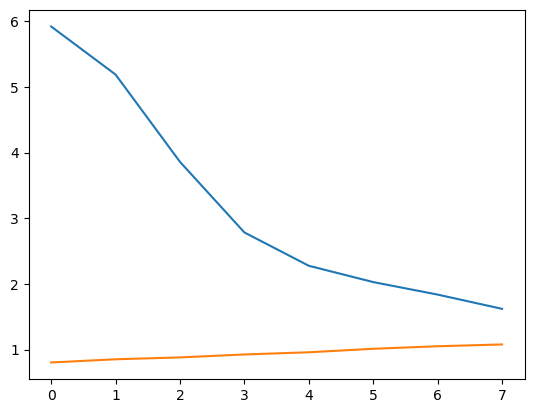

In [25]:
i=2
plt.plot(np.flip(np.mean(norm_vals[:,i,:8], axis=0)))
plt.plot(np.flip(np.mean(norm_vals[:,i,8:], axis=0)))

In [55]:
animals = ["rEO_rYL_duo", "rEO_rYL_trio","rEO_rYL_quad", "rEO_rYL_penta"]
cnames = ["Nissl", "IBA1", "GFAP"]
gfap = np.zeros((1,16))
iba = np.zeros((1,16))
nissl = np.zeros((1,16))
for animalid in animals:
    for i in range(3):
        csvfilename = f"normalized_if_values-c_{cnames[i]}.csv"
        tocsvpath=os.path.join(root, animalid, "histology", csvfilename)
        ifdf = pd.read_csv(tocsvpath)
        if i==0:
            nissl = np.append(nissl, ifdf[["elec_r8","elec_r7","elec_r6","elec_r5",
                 "elec_r4","elec_r3","elec_r2","elec_r1",
                 "ctrl_r8","ctrl_r7","ctrl_r6","ctrl_r5",
                 "ctrl_r4","ctrl_r3","ctrl_r2","ctrl_r1"]].values, axis=0)
        elif i==1:
            iba = np.append(iba, ifdf[["elec_r8","elec_r7","elec_r6","elec_r5",
                 "elec_r4","elec_r3","elec_r2","elec_r1",
                 "ctrl_r8","ctrl_r7","ctrl_r6","ctrl_r5",
                 "ctrl_r4","ctrl_r3","ctrl_r2","ctrl_r1"]].values, axis=0)
        elif i==2:
            gfap = np.append(gfap, ifdf[["elec_r8","elec_r7","elec_r6","elec_r5",
                 "elec_r4","elec_r3","elec_r2","elec_r1",
                 "ctrl_r8","ctrl_r7","ctrl_r6","ctrl_r5",
                 "ctrl_r4","ctrl_r3","ctrl_r2","ctrl_r1"]].values, axis=0)

# nissl = np.delete(nissl, (0), axis=0)
# iba = np.delete(iba, (0), axis=0)
# gfap = np.delete(gfap, (0), axis=0)

nissl = nissl[~np.all(nissl == 0, axis=1)]
iba = iba[~np.all(iba == 0, axis=1)]
gfap = gfap[~np.all(gfap == 0, axis=1)]

In [74]:
ifdf

,elec_r8,elec_r7,elec_r6,elec_r5,elec_r4,elec_r3,elec_r2,elec_r1,ctrl_r8,ctrl_r7,ctrl_r6,ctrl_r5,ctrl_r4,ctrl_r3,ctrl_r2,ctrl_r1,filename_electrode,filename_control
0,1.740453,2.075977,2.154743,2.424586,3.218284,4.393212,5.596994,5.979707,0.931896,1.042711,1.049194,1.123301,1.179311,1.001451,0.880241,0.754782,"_rEO_rYL_penta_s1_n1_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s1_n1_Control_20x_C561, C488, C..."
1,1.586588,1.818252,2.258335,2.607520,3.179375,4.451701,5.724446,6.430957,1.110550,0.976669,0.951872,0.955009,0.882059,0.869954,0.868281,0.774733,"_rEO_rYL_penta_s1_n2_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s1_n2_Control_20x_C561, C488, C..."
2,1.627893,1.940101,2.335976,2.696076,3.536593,4.721417,6.684674,7.958397,0.970357,0.959758,0.868901,0.811770,0.750796,0.720776,0.700878,0.783173,"_rEO_rYL_penta_s2_n1_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s2_n1_Control_20x_C561, C488, C..."
3,1.762545,2.049299,2.177112,2.517247,3.804713,5.177630,6.981460,7.859475,0.930357,0.925142,0.803289,0.758153,0.683236,0.677960,0.769406,0.654430,"_rEO_rYL_penta_s2_n2_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s2_n2_Control_20x_C561, C488, C..."
4,1.597669,1.985191,2.214643,2.519645,3.337791,4.750862,7.442738,8.354122,0.928614,0.901165,0.929117,0.945365,0.875320,0.848159,0.789768,0.756635,"_rEO_rYL_penta_s3_n1_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s3_n1_Control_20x_C561, C488, C..."
5,1.794567,1.885771,2.082547,2.563509,3.215789,4.250254,5.292559,6.492448,1.285464,1.108012,1.054799,0.976809,0.896986,0.914801,0.852643,0.798029,"_rEO_rYL_penta_s3_n2_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s3_n2_Control_20x_C561, C488, C..."
6,1.773159,1.811587,2.018537,2.228259,2.593250,3.727296,5.175091,5.913970,1.363921,1.327471,1.270513,1.006256,0.811919,0.781760,0.740741,0.684998,"_rEO_rYL_penta_s4_n1_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s4_n1_Control_20x_C561, C488, C..."
7,1.739709,1.882319,2.212597,2.632865,2.701101,3.711293,5.350200,6.443177,1.126820,1.278649,1.240197,1.020861,0.902305,0.745280,0.751371,0.730442,"_rEO_rYL_penta_s4_n2_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s4_n2_Control_20x_C561, C488, C..."
8,1.712224,1.989002,1.907631,2.142303,2.483499,3.515430,4.497016,6.225208,1.115423,1.049395,0.979692,1.106477,1.099407,1.082868,1.222300,1.709336,"_rEO_rYL_penta_s5_n1_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s5_n1_Control_20x_C561, C488, C..."
9,1.575030,1.713049,1.918327,2.051871,2.243891,3.550470,4.408269,3.900855,1.101794,1.120017,1.223529,1.097419,1.480117,1.568363,1.286968,0.984668,"_rEO_rYL_penta_s5_n2_Electrode_20x_C561, C488,...","_rEO_rYL_penta_s5_n2_Control_20x_C561, C488, C..."


<ErrorbarContainer object of 3 artists>

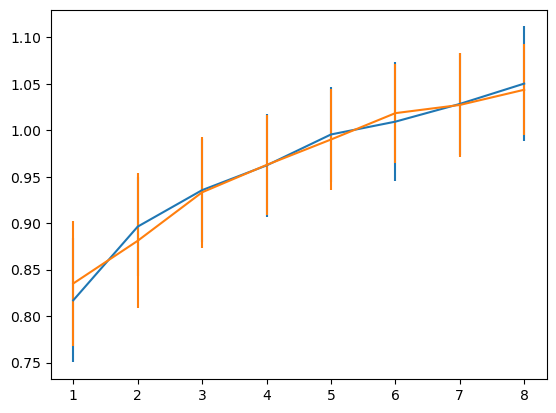

In [64]:
plt.errorbar(np.linspace(1,8,8),np.mean(np.flip(nissl[:,:8]),axis=0), np.std(np.flip(nissl[:,:8]),axis=0))
plt.errorbar(np.linspace(1,8,8),np.mean(np.flip(nissl[:,8:]),axis=0),np.std(np.flip(nissl[:,8:]),axis=0))

<ErrorbarContainer object of 3 artists>

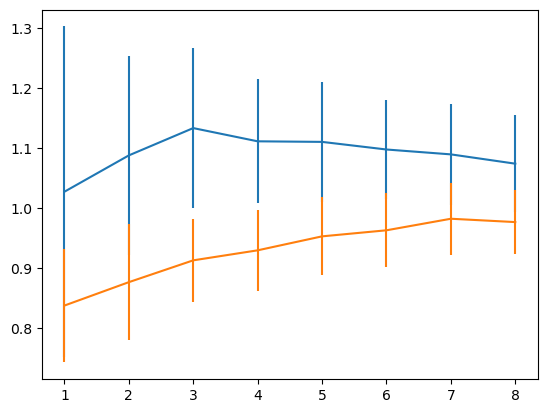

In [66]:
plt.errorbar(np.linspace(1,8,8),np.mean(np.flip(iba[:,:8]),axis=0), np.std(np.flip(iba[:,:8]),axis=0))
plt.errorbar(np.linspace(1,8,8),np.mean(np.flip(iba[:,8:]),axis=0),np.std(np.flip(iba[:,8:]),axis=0))

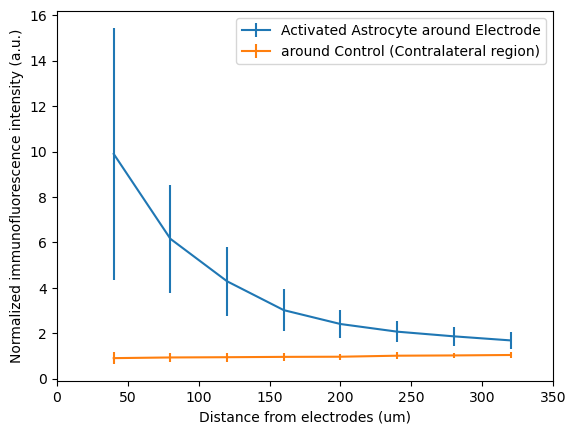

In [82]:
plt.errorbar(np.linspace(40,320,8),np.mean(np.flip(gfap[:,:8]),axis=0), np.std(np.flip(gfap[:,:8]),axis=0))
plt.errorbar(np.linspace(40,320,8),np.mean(np.flip(gfap[:,8:]),axis=0),np.std(np.flip(gfap[:,8:]),axis=0))
plt.ylabel("Normalized immunofluorescence intensity (a.u.)")
plt.xlabel("Distance from electrodes (um)")
# plt.hlines(y=1, xmin=0, xmax=350, alpha=0.5, color='red')
plt.xlim([0,350])
plt.legend(["Activated Astrocyte around Electrode", "around Control (Contralateral region)"])

# Fluorescence Intensity Analysis

In [2]:
hddroot="/Volumes/LaCie/data/rEO_08/histology"
centers_filename="electrode-centers.csv"
path=os.path.join(hddroot, centers_filename)
metadatadf=read_metadata(path)

In [90]:
hddroot="/Volumes/LaCie/data/rEO_08/histology"
centers_filename="electrode-centers.csv"
path=os.path.join(hddroot, centers_filename)
metadatadf=read_metadata(path)
metadatadf

,filename,center_x,center_y,v_x,v_y,v_r,plane_start,plane_stop,plane_selected,exclude,r_base,control_location
0,_rEO008_s03_n1_20x_spot1_zStack,2936,2840,0,0,0,5,8,0,0,40,2
1,_rEO008_s03_n1_20x_spot2_zStack,2980,2864,1310,2605,25,7,10,8,0,40,3
2,_rEO008_s03_n2_spot1_20x,2920,2824,0,0,0,0,0,0,1,40,3
3,_rEO008_s03_n2_spot2_20x,2960,2816,0,0,0,5,8,0,0,40,1
4,_rEO008_s03_n3_spot4_20x,3000,2888,1735,3185,70,12,15,12,0,40,2
5,_rEO008_s04_n1_spot4_20x,3010,2890,1695,3110,60,5,15,8,0,35,4
6,_rEO008_s04_n2_20x_spot4_zStack,2990,2835,1655,3085,55,5,16,0,0,35,2
7,_rEO008_s04_n3_spot3_20x,2810,2950,0,0,0,0,0,0,1,50,2
8,_rEO008_s05_n1_20x_spot4_zStack,2985,2765,1675,3075,55,7,17,0,0,35,4
9,_rEO008_s05_n2_20x_spot4_zStack,2995,2860,1700,3125,55,7,15,0,0,30,2


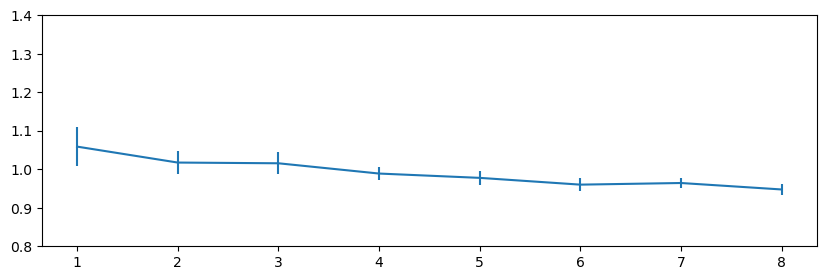

In [101]:
electrode = np.flip(gfap_pooled_means[:, 1:num_regions+1])
control = np.flip(gfap_pooled_means[:, num_regions+1:])
plt.figure(figsize=(10,3))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(electrode, axis=0), np.std(electrode, axis=0)/np.sqrt(num_regions))
# plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(control, axis=0), np.std(control, axis=0)/np.sqrt(num_regions))
# plt.hlines(1, 1, 10)
plt.ylim([0.8,1.4])
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename="iba-electrode-r40-reach320.pdf"
plt.savefig(os.path.join(root, filename))

In [18]:
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename = "iba-electrode-r40-reach320.npy"
nissl=np.load(os.path.join(root, filename))

In [20]:
np.std(nissl, axis=0)

array([0.14134226, 0.08764295, 0.08114311, 0.04518001, 0.05074593,
       0.04631778, 0.03503208, 0.0431494 ])

_rEO008_s03_n1_20x_spot1_zStack


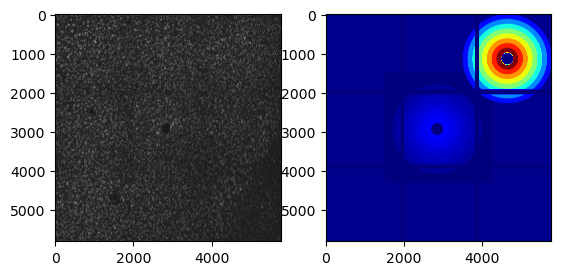

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20962052.0      199.272184      73.393918          1.000000
1       2    576568.0      196.987963      64.507739          0.988537
2       3    491113.0      191.875092      63.791448          0.962879
3       4    620556.0      199.004664      62.469432          0.998658
4       5    546760.0      201.643194      67.800806          1.011898
5       6    451728.0      202.680381      66.520277          1.017103
6       7    356616.0      202.715532      67.096899          1.017280
7       8    261616.0      214.294726      78.209444          1.075387
8       9    166552.0      231.789849      85.742071          1.163182
9      11    750348.0      191.593891      62.902039          0.961468
10     21    616664.0      196.312637      66.709998          0.985148
11     31    506778.0      205.319412      70.164914          1.030347
12     41    532411.0      206.877662      71.351745          1.038166
13    

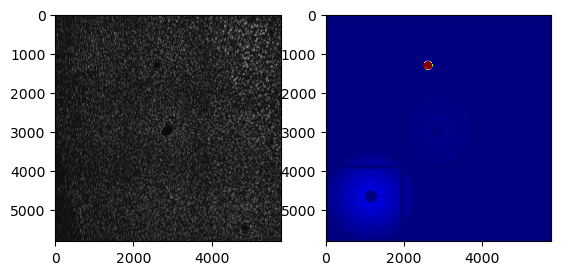

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20901068.0      359.299164     209.253931          1.000000
1       2    572146.0      339.645456     181.552408          0.945300
2       3    490956.0      319.744955     163.022128          0.889913
3       4    627839.0      346.247689     182.392213          0.963675
4       5    546760.0      349.462013     181.267493          0.972621
5       6    451728.0      370.641038     196.389681          1.031567
6       7    356616.0      393.109647     208.710129          1.094101
7       8    261616.0      373.295433     202.758457          1.038954
8       9    166552.0      429.626981     229.700184          1.195736
9      11    767516.0      267.773560     149.074133          0.745266
10     21    646948.0      277.981461     148.188994          0.773677
11     31    500152.0      278.574073     149.270339          0.775326
12     41    521892.0      293.714380     158.218850          0.817465
13    

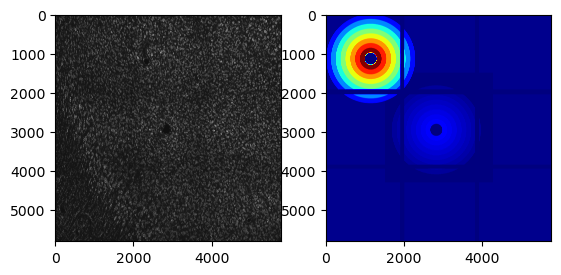

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20965531.0      282.513777     142.986459          1.000000
1       2    569938.0      267.871719     125.520236          0.948172
2       3    519532.0      276.529009     123.855812          0.978816
3       4    605219.0      284.611390     128.682477          1.007425
4       5    546760.0      293.190054     131.885021          1.037790
5       6    451728.0      310.284658     147.584009          1.098299
6       7    356616.0      308.303677     146.667855          1.091287
7       8    261616.0      331.845025     167.804592          1.174615
8       9    166552.0      320.396345     147.302939          1.134091
9      11    745986.0      267.066987     123.207974          0.945324
10     21    611780.0      272.008791     133.955008          0.962816
11     31    507146.0      262.664714     120.608392          0.929741
12     41    545001.0      271.965809     128.743917          0.962664
13    

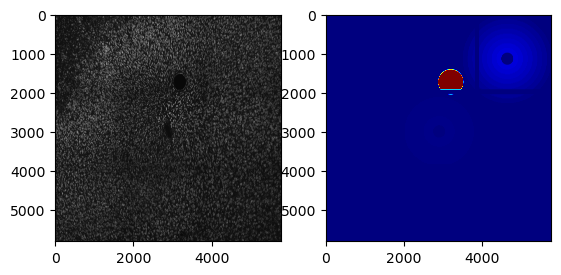

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20941290.0      497.384486     281.597209          1.000000
1       2    562216.0      442.674796     229.299932          0.890005
2       3    490321.0      462.431169     264.418995          0.929726
3       4    626053.0      472.068609     270.028575          0.949102
4       5    546760.0      468.039540     272.190750          0.941001
5       6    451728.0      465.232764     274.023474          0.935358
6       7    356616.0      484.444287     300.498554          0.973984
7       8    261616.0      486.680004     292.655276          0.978478
8       9    166552.0      468.212240     277.917638          0.941349
9      11    750061.0      516.152329     254.810929          1.037733
10     21    616412.0      517.646775     249.974419          1.040738
11     31    506514.0      517.209613     247.895635          1.039859
12     41    533407.0      529.022428     248.192722          1.063609
13    

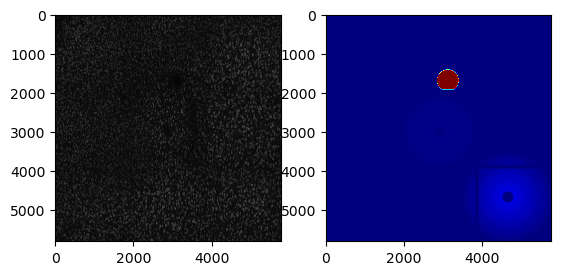

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20996404.0      354.092905     239.258392          1.000000
1       2    545826.0      302.462261     189.491266          0.854189
2       3    518040.0      291.391887     183.829922          0.822925
3       4    617261.0      308.913048     203.523582          0.872407
4       5    534352.0      291.157001     192.577254          0.822262
5       6    439360.0      324.040634     223.526240          0.915129
6       7    344288.0      313.408550     211.106098          0.885103
7       8    249216.0      362.129414     249.431571          1.022696
8       9    154168.0      365.231488     259.734106          1.031457
9      11    752081.0      345.120014     234.403268          0.974659
10     21    630896.0      338.432911     224.446217          0.955774
11     31    485236.0      351.666981     238.476736          0.993149
12     41    526082.0      397.226195     279.342886          1.121813
13    

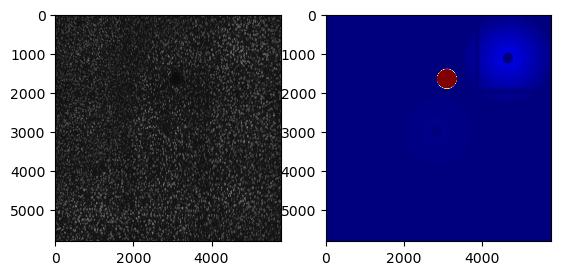

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21012323.0      283.464202     174.867167          1.000000
1       2    541638.0      248.824266     141.701834          0.877798
2       3    531056.0      260.368859     159.266741          0.918525
3       4    611494.0      270.307213     172.183417          0.953585
4       5    534352.0      278.156148     182.144188          0.981274
5       6    439360.0      267.745971     171.544576          0.944550
6       7    344288.0      285.000566     196.868833          1.005420
7       8    249216.0      278.054238     180.064828          0.980915
8       9    154168.0      260.328881     167.221960          0.918384
9      11    728798.0      287.457394     181.570939          1.014087
10     21    587900.0      285.867738     175.497465          1.008479
11     31    521727.0      303.829781     202.891912          1.071845
12     41    533308.0      311.059590     209.127736          1.097351
13    

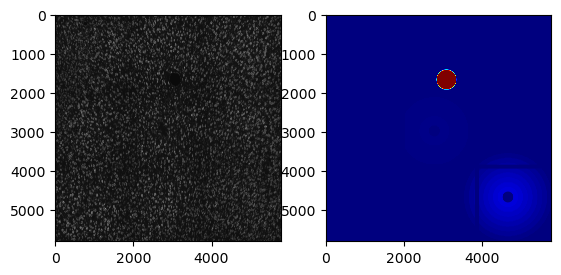

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21001445.0      340.447453     233.860902          1.000000
1       2    578226.0      295.772155     194.856455          0.868775
2       3    564486.0      303.334690     213.326218          0.890988
3       4    565632.0      299.119274     200.401006          0.878606
4       5    534352.0      307.035164     220.153812          0.901858
5       6    439360.0      338.373175     233.368241          0.993907
6       7    344288.0      321.100698     220.472371          0.943173
7       8    249216.0      331.983408     229.512897          0.975138
8       9    154168.0      308.972828     192.080956          0.907549
9      11    751927.0      312.777715     190.559606          0.918725
10     21    630702.0      319.024755     204.562351          0.937075
11     31    485477.0      322.050569     201.967439          0.945963
12     41    526301.0      343.207655     211.800136          1.008108
13    

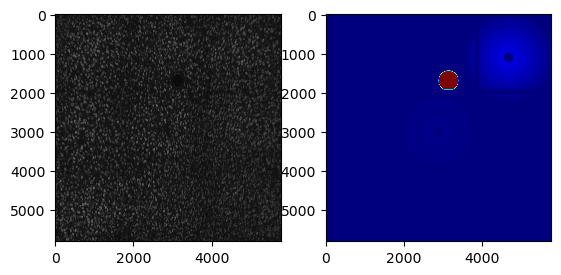

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21084602.0      292.219234     170.184781          1.000000
1       2    522394.0      268.722535     152.933330          0.919592
2       3    533446.0      275.676113     161.005309          0.943388
3       4    616998.0      272.527930     160.032348          0.932615
4       5    522808.0      286.633035     177.093776          0.980884
5       6    427784.0      308.167898     197.240524          1.054578
6       7    332672.0      326.634150     203.154292          1.117771
7       8    237656.0      304.728128     183.869147          1.042807
8       9    142568.0      268.035906     152.168090          0.917243
9      11    710264.0      278.207186     148.685807          0.952050
10     21    565486.0      283.409954     155.816547          0.969854
11     31    543677.0      286.680163     161.472154          0.981045
12     41    522808.0      301.525650     167.517193          1.031847
13    

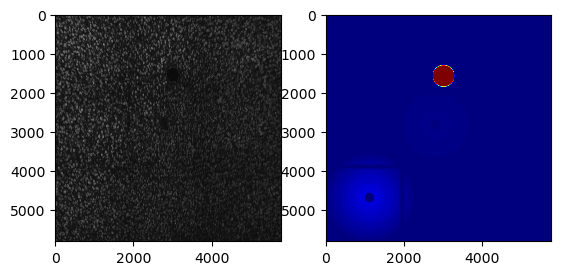

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21005241.0      323.402543     187.345094          1.000000
1       2    561794.0      294.076523     158.005868          0.909320
2       3    555684.0      289.465302     155.187815          0.895062
3       4    549091.0      301.893336     161.704798          0.933491
4       5    522808.0      304.564829     158.436982          0.941751
5       6    427784.0      321.579627     178.456565          0.994363
6       7    332672.0      315.176970     166.900482          0.974566
7       8    237656.0      301.201560     157.815003          0.931352
8       9    142568.0      276.678462     130.075334          0.855523
9      11    728558.0      311.045005     177.952015          0.961789
10     21    593382.0      303.415073     173.485441          0.938196
11     31    518878.0      325.558235     185.739826          1.006666
12     41    522808.0      332.230482     180.602035          1.027297
13    

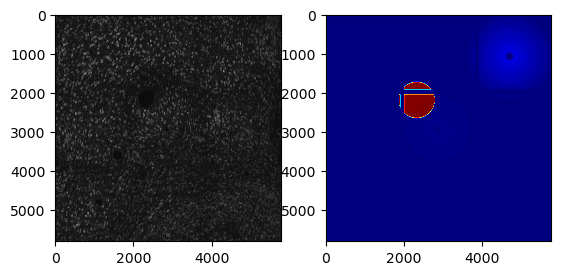

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21232626.0      275.528050     156.671086          1.000000
1       2    406425.0      252.690649     135.315386          0.917114
2       3    479463.0      246.485862     125.589569          0.894594
3       4    494630.0      268.225896     148.533962          0.973498
4       5    421387.0      279.510628     161.199631          1.014454
5       6    360824.0      279.021498     161.727776          1.012679
6       7    308357.0      280.171924     169.880137          1.016854
7       8    213616.0      306.854426     171.869635          1.113696
8       9    118624.0      296.020308     168.911913          1.074374
9      11    659539.0      250.160615     126.678083          0.907932
10     21    549757.0      271.093523     145.667730          0.983905
11     31    580045.0      278.037273     158.442098          1.009107
12     41    498824.0      267.706726     144.902677          0.971613
13    

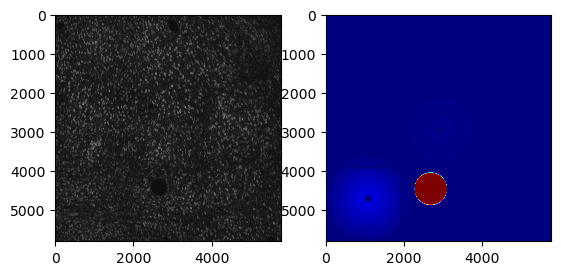

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20815214.0      261.716828     140.891191          1.000000
1       2    470897.0      249.318549     129.407366          0.952627
2       3    587282.0      251.698603     133.835527          0.961721
3       4    593928.0      271.036807     153.025592          1.035611
4       5    498824.0      282.743741     157.689781          1.080342
5       6    403808.0      305.561287     185.269008          1.167526
6       7    308756.0      287.501571     151.964318          1.098522
7       8    213616.0      263.939433     137.153187          1.008492
8       9    118624.0      291.748761     152.587321          1.114750
9      11    691230.0      273.112100     131.494887          1.043540
10     21    542226.0      265.135171     123.523084          1.013061
11     31    568938.0      256.658365     122.443009          0.980672
12     41    498824.0      252.654048     117.877137          0.965372
13    

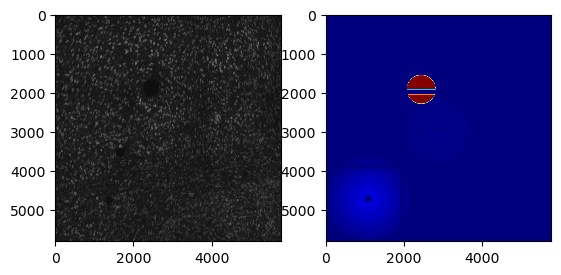

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21218562.0      249.966020     122.691373          1.000000
1       2    444030.0      232.420168     112.909218          0.929807
2       3    522684.0      240.271036     114.619148          0.961215
3       4    577255.0      248.939503     127.326613          0.995893
4       5    498824.0      250.308582     131.583960          1.001370
5       6    403808.0      273.445853     147.395847          1.093932
6       7    308756.0      276.828457     145.054303          1.107464
7       8    213616.0      273.691371     145.598688          1.094914
8       9    118624.0      283.647432     144.786744          1.134744
9      11    691230.0      235.710988     106.752844          0.942972
10     21    542226.0      242.219029     110.277747          0.969008
11     31    568938.0      239.662088     112.978015          0.958779
12     41    498824.0      247.597100     122.559977          0.990523
13    

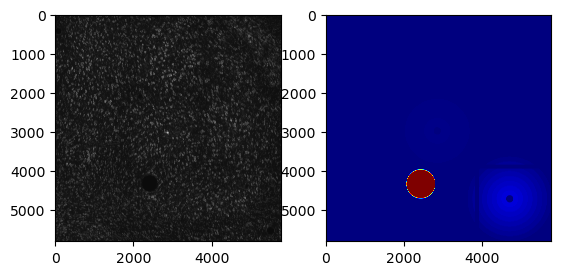

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20979119.0      277.292595     147.531689          1.000000
1       2    494724.0      282.526255     157.711144          1.018874
2       3    571329.0      269.343366     137.051160          0.971333
3       4    593928.0      291.598727     164.555172          1.051592
4       5    498824.0      291.147858     157.786809          1.049966
5       6    403808.0      308.930999     179.996614          1.114098
6       7    308756.0      306.271774     169.788352          1.104508
7       8    213616.0      308.143149     181.922606          1.111256
8       9    118624.0      264.473918     120.967096          0.953772
9      11    696090.0      258.993208     133.938597          0.934007
10     21    541238.0      253.271873     125.610197          0.913374
11     31    557132.0      254.260656     128.468376          0.916940
12     41    498824.0      263.092075     135.875883          0.948789
13    

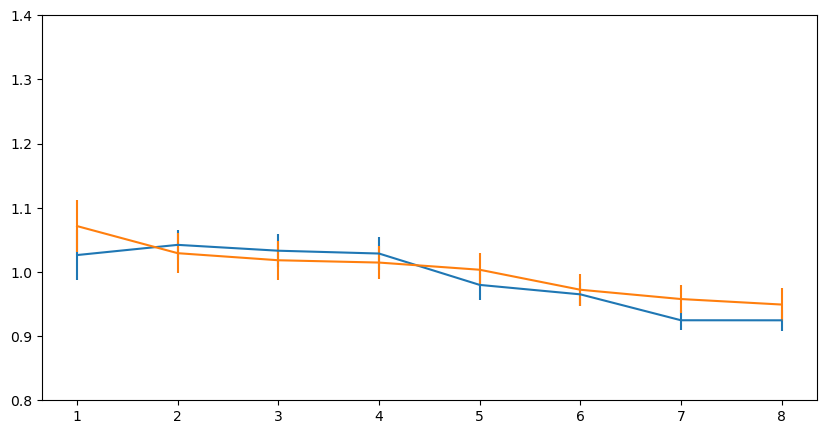

In [91]:
r=40
reach=320
num_regions=np.round(reach/r).astype(int)

nissl_pooled_means, nissl_allmeans = get_means(metadatadf, "nissl", r, reach)
electrode = np.flip(nissl_pooled_means[:, 1:num_regions+1])
control = np.flip(nissl_pooled_means[:, num_regions+1:])
plt.figure(figsize=(10,5))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(electrode, axis=0), np.std(electrode, axis=0)/np.sqrt(num_regions))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(control, axis=0), np.std(control, axis=0)/np.sqrt(num_regions))
# plt.hlines(1, 1, 10)
plt.ylim([0.8,1.4])
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename="nissl-electrode-r40-reach320.pdf"
plt.savefig(os.path.join(root, filename))
for i in range(num_regions):
    rvs1 = electrode[:,i]
    rvs2 = control[:,i]
    print(stats.ttest_ind(rvs1, rvs2, equal_var=False))

filename = "nissl-electrode-r40-reach320.npy"
np.save(os.path.join(root, filename), electrode)
filename = "nissl-control-r40-reach320.npy"
np.save(os.path.join(root, filename), control)

_rEO008_s03_n1_20x_spot1_zStack


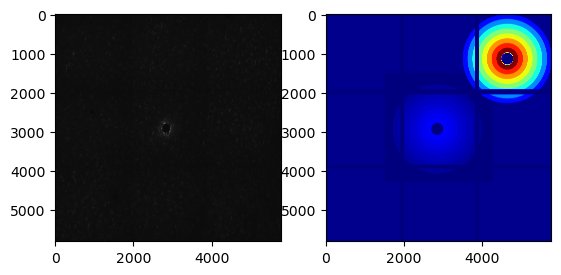

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20962052.0      149.589290      28.310733          1.000000
1       2    576568.0      145.957516      25.220502          0.975722
2       3    491113.0      145.833930      25.958068          0.974896
3       4    620556.0      148.998111      25.562928          0.996048
4       5    546760.0      151.335923      27.877751          1.011676
5       6    451728.0      155.261195      28.196009          1.037917
6       7    356616.0      157.684781      25.683322          1.054118
7       8    261616.0      174.443841      30.497341          1.166152
8       9    166552.0      236.931241      78.423447          1.583878
9      11    750348.0      146.308064      26.072077          0.978065
10     21    616664.0      147.156867      25.962308          0.983739
11     31    506778.0      151.945378      32.261201          1.015750
12     41    532411.0      154.319075      30.286891          1.031618
13    

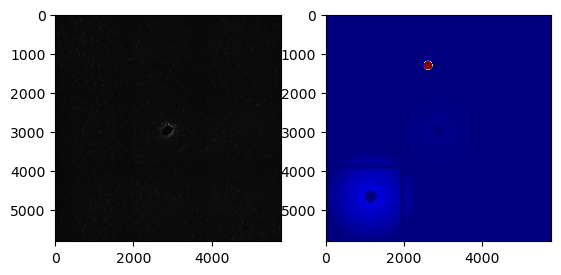

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20901068.0      183.058036      50.747869          1.000000
1       2    572146.0      175.178748      47.416848          0.956957
2       3    490956.0      175.999067      47.719998          0.961439
3       4    627839.0      178.163907      46.849072          0.973265
4       5    546760.0      182.216186      53.504310          0.995401
5       6    451728.0      185.619120      51.247422          1.013991
6       7    356616.0      186.551072      49.541745          1.019082
7       8    261616.0      204.464639      61.529752          1.116939
8       9    166552.0      320.811380     240.924110          1.752512
9      11    767516.0      173.151190      50.318984          0.945881
10     21    646948.0      173.369442      50.427919          0.947074
11     31    500152.0      174.531868      48.621466          0.953424
12     41    521892.0      177.987043      47.327195          0.972298
13    

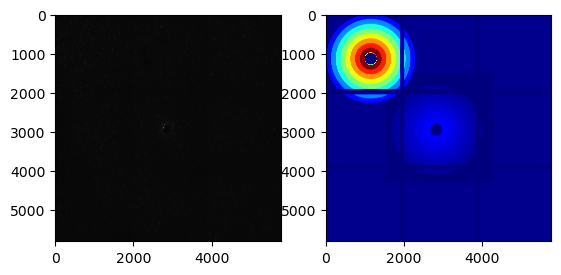

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20965531.0      143.980291      26.490602          1.000000
1       2    569938.0      139.897571      22.471457          0.971644
2       3    519532.0      141.415536      25.190516          0.982187
3       4    605219.0      143.931911      26.007555          0.999664
4       5    546760.0      146.359348      27.354421          1.016523
5       6    451728.0      147.903648      25.229186          1.027249
6       7    356616.0      149.562072      24.715650          1.038768
7       8    261616.0      160.103270      30.339806          1.111980
8       9    166552.0      188.291795      52.037567          1.307761
9      11    745986.0      149.269996      31.802253          1.036739
10     21    611780.0      151.977703      35.040113          1.055545
11     31    507146.0      152.184000      35.460202          1.056978
12     41    545001.0      152.717300      37.852560          1.060682
13    

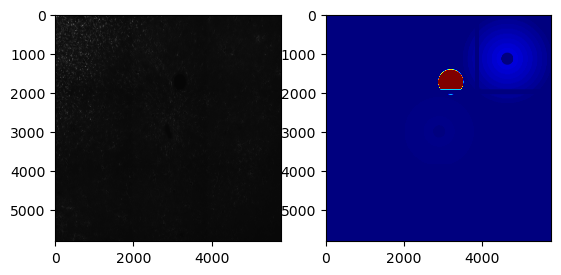

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20941290.0      216.491482     111.859984          1.000000
1       2    562216.0      185.251033      39.492248          0.855697
2       3    490321.0      189.537089      46.403383          0.875494
3       4    626053.0      194.541772      49.674572          0.898612
4       5    546760.0      198.325536      52.970207          0.916089
5       6    451728.0      204.124119      57.833356          0.942874
6       7    356616.0      212.660711      65.147341          0.982305
7       8    261616.0      230.009560      79.047532          1.062442
8       9    166552.0      228.672673      65.204087          1.056266
9      11    750061.0      195.497809      36.282606          0.903028
10     21    616412.0      200.133687      41.314302          0.924441
11     31    506514.0      205.337618      43.409838          0.948479
12     41    533407.0      208.067620      47.840599          0.961089
13    

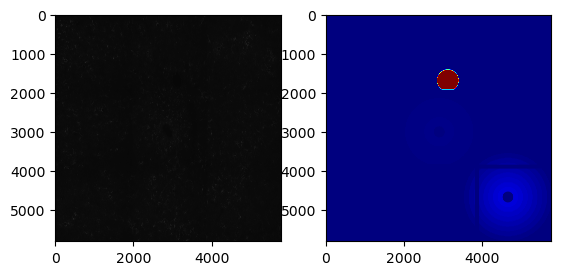

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20996404.0      165.531752      46.162352          1.000000
1       2    545826.0      161.171577      51.346397          0.973660
2       3    518040.0      156.184343      43.166043          0.943531
3       4    617261.0      154.565448      41.193064          0.933751
4       5    534352.0      156.467228      42.253761          0.945240
5       6    439360.0      167.711321      54.949475          1.013167
6       7    344288.0      177.101697      63.641084          1.069896
7       8    249216.0      189.612019      66.697610          1.145472
8       9    154168.0      188.438223      50.138389          1.138381
9      11    752081.0      157.384190      36.689203          0.950779
10     21    630896.0      158.011866      31.543354          0.954571
11     31    485236.0      163.432888      38.581915          0.987320
12     41    526082.0      168.198564      43.988763          1.016111
13    

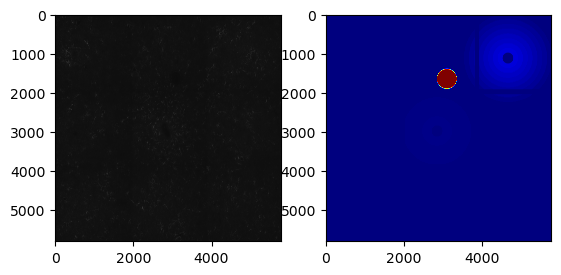

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21012323.0      148.652617      29.641735          1.000000
1       2    541638.0      141.637581      25.027651          0.952809
2       3    531056.0      144.300143      31.839621          0.970721
3       4    611494.0      147.637650      33.216042          0.993172
4       5    534352.0      153.147788      40.678429          1.030239
5       6    439360.0      157.300496      41.922913          1.058175
6       7    344288.0      159.319209      45.689846          1.071755
7       8    249216.0      172.440485      55.671903          1.160023
8       9    154168.0      165.320384      42.431447          1.112126
9      11    728798.0      143.702116      21.484092          0.966698
10     21    587900.0      148.783973      29.920299          1.000884
11     31    521727.0      155.101384      40.831380          1.043381
12     41    533308.0      159.815641      41.452078          1.075095
13    

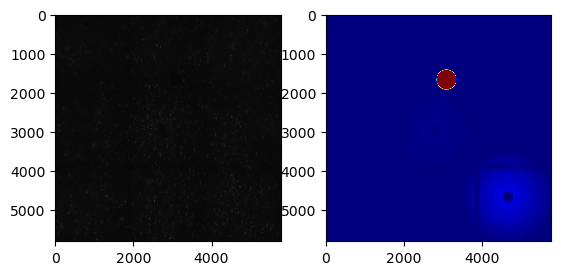

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21001445.0      170.016975      52.372223          1.000000
1       2    578226.0      158.753102      45.990143          0.933749
2       3    564486.0      163.525574      56.708678          0.961819
3       4    565632.0      169.466660      63.872474          0.996763
4       5    534352.0      174.682936      66.644812          1.027444
5       6    439360.0      182.326564      78.551348          1.072402
6       7    344288.0      191.720095      83.720027          1.127653
7       8    249216.0      205.239848      92.896518          1.207173
8       9    154168.0      199.284430      70.705647          1.172144
9      11    751927.0      167.066526      58.940518          0.982646
10     21    630702.0      170.541189      58.753105          1.003083
11     31    485477.0      173.693295      63.407201          1.021623
12     41    526301.0      177.729269      70.395092          1.045362
13    

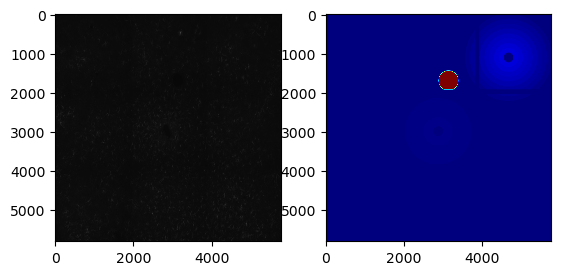

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21084602.0      167.194424      50.199928          1.000000
1       2    522394.0      159.304121      46.993576          0.952808
2       3    533446.0      159.713532      46.938895          0.955256
3       4    616998.0      164.844093      50.962039          0.985943
4       5    522808.0      169.171575      53.252926          1.011825
5       6    427784.0      181.364754      67.650600          1.084754
6       7    332672.0      190.458455      67.246450          1.139144
7       8    237656.0      204.082173      75.291910          1.220628
8       9    142568.0      196.147431      59.198751          1.173170
9      11    710264.0      155.048626      33.277940          0.927355
10     21    565486.0      156.600819      33.433320          0.936639
11     31    543677.0      157.644454      33.459239          0.942881
12     41    522808.0      158.648837      27.495913          0.948888
13    

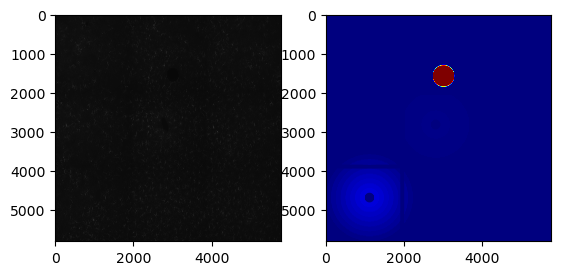

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21005241.0      171.677039      44.414892          1.000000
1       2    561794.0      158.074116      39.184044          0.920764
2       3    555684.0      163.339670      45.665487          0.951436
3       4    549091.0      168.110534      47.253301          0.979225
4       5    522808.0      172.448486      50.036102          1.004494
5       6    427784.0      176.511616      50.753181          1.028161
6       7    332672.0      187.703215      58.185418          1.093351
7       8    237656.0      201.856292      58.951836          1.175791
8       9    142568.0      190.140165      47.003330          1.107546
9      11    728558.0      168.526349      43.837320          0.981648
10     21    593382.0      169.548259      48.735637          0.987600
11     31    518878.0      169.329850      46.356034          0.986328
12     41    522808.0      169.782230      46.077743          0.988963
13    

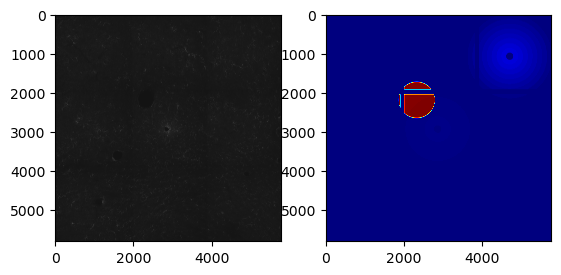

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21232626.0      144.376464      23.190218          1.000000
1       2    406425.0      139.471912      20.276992          0.966029
2       3    479463.0      141.983381      21.247472          0.983425
3       4    494630.0      145.282458      22.156186          1.006275
4       5    421387.0      148.426933      23.236587          1.028055
5       6    360824.0      150.575333      24.793978          1.042935
6       7    308357.0      153.277834      23.302694          1.061654
7       8    213616.0      164.343780      28.497689          1.138300
8       9    118624.0      188.478858      42.658295          1.305468
9      11    659539.0      138.797797      18.954092          0.961360
10     21    549757.0      143.086955      19.805314          0.991068
11     31    580045.0      145.303882      20.821081          1.006424
12     41    498824.0      147.184237      20.940477          1.019448
13    

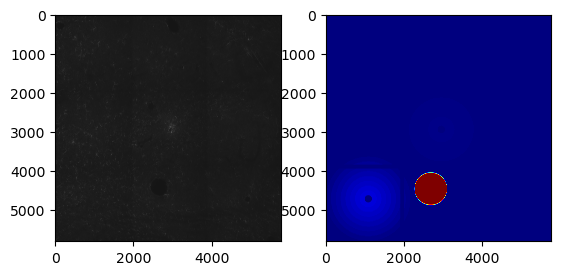

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20815214.0      142.390266      20.956975          1.000000
1       2    470897.0      143.041387      20.726500          1.004573
2       3    587282.0      144.206465      21.247357          1.012755
3       4    593928.0      143.736650      19.611060          1.009456
4       5    498824.0      147.010743      20.609539          1.032449
5       6    403808.0      149.306772      20.681228          1.048574
6       7    308756.0      155.609293      23.584038          1.092837
7       8    213616.0      161.737215      24.260689          1.135873
8       9    118624.0      182.264972      36.757627          1.280038
9      11    691230.0      146.699729      23.835020          1.030265
10     21    542226.0      146.963707      24.775741          1.032119
11     31    568938.0      147.619561      24.621369          1.036725
12     41    498824.0      149.411061      24.251503          1.049307
13    

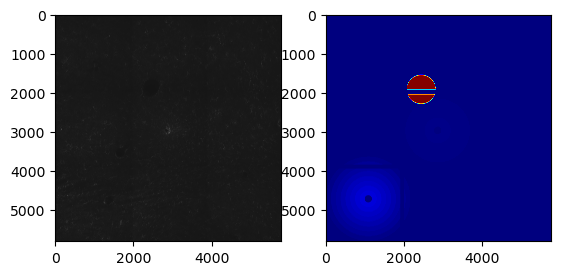

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21218562.0      134.049646      17.367984          1.000000
1       2    444030.0      131.451508      15.430115          0.980618
2       3    522684.0      133.335568      16.351531          0.994673
3       4    577255.0      135.319718      17.002578          1.009475
4       5    498824.0      136.795184      17.845138          1.020482
5       6    403808.0      138.501169      17.273930          1.033208
6       7    308756.0      142.421689      18.474572          1.062455
7       8    213616.0      147.160746      20.523935          1.097808
8       9    118624.0      158.415683      29.083133          1.181769
9      11    691230.0      139.930518      24.021630          1.043871
10     21    542226.0      140.285569      24.188307          1.046520
11     31    568938.0      138.399043      20.736947          1.032446
12     41    498824.0      138.834274      21.031135          1.035693
13    

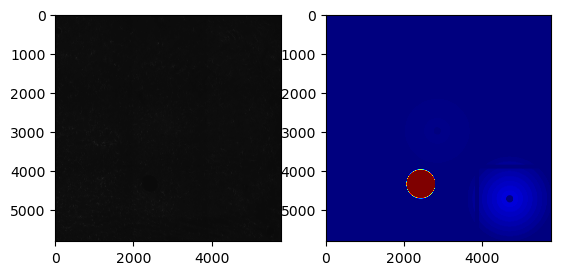

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20979119.0      143.432899      24.621071          1.000000
1       2    494724.0      138.519461      19.215600          0.965744
2       3    571329.0      139.350304      18.188990          0.971537
3       4    593928.0      142.330161      19.755999          0.992312
4       5    498824.0      146.776033      24.421408          1.023308
5       6    403808.0      149.447284      25.300179          1.041932
6       7    308756.0      149.797406      22.534930          1.044373
7       8    213616.0      152.166575      22.810378          1.060890
8       9    118624.0      154.212326      19.824257          1.075153
9      11    696090.0      137.014612      18.704636          0.955252
10     21    541238.0      136.364546      18.929151          0.950720
11     31    557132.0      138.231904      20.976736          0.963739
12     41    498824.0      139.002620      19.724312          0.969113
13    

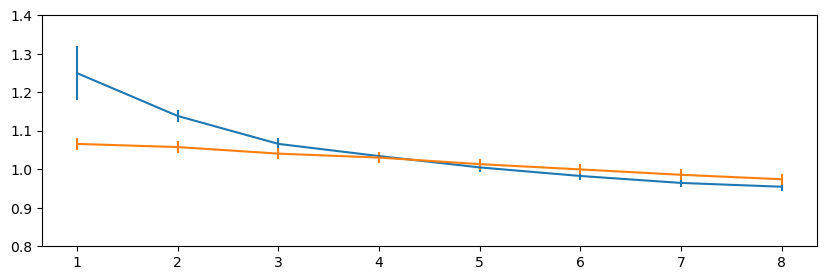

In [102]:
channel = "gfap"
r=40
reach=320
num_regions=np.round(reach/r).astype(int)

gfap_pooled_means, gfap_allmeans = get_means(metadatadf, channel, r, reach)
electrode = np.flip(gfap_pooled_means[:, 1:num_regions+1])
control = np.flip(gfap_pooled_means[:, num_regions+1:])

plt.figure(figsize=(10,3))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(electrode, axis=0), np.std(electrode, axis=0)/np.sqrt(num_regions))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(control, axis=0), np.std(control, axis=0)/np.sqrt(num_regions))
plt.ylim([0.8,1.4])
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename="gfap-electrode-r40-reach320.pdf"
plt.savefig(os.path.join(root, filename))

for i in range(num_regions):
    rvs1 = electrode[:,i]
    rvs2 = control[:,i]
    print(stats.ttest_ind(rvs1, rvs2, equal_var=False))

filename = channel+"-electrode-r40-reach320.npy"
np.save(os.path.join(root, filename), electrode)
filename = channel+"-control-r40-reach320.npy"
np.save(os.path.join(root, filename), control)

_rEO008_s03_n1_20x_spot1_zStack


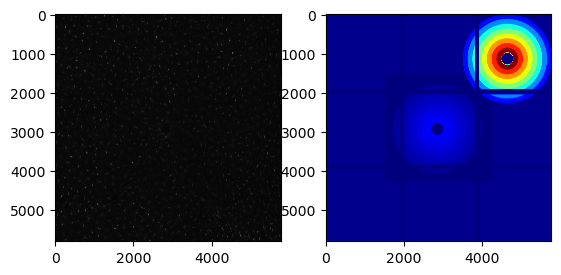

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20962052.0      168.665488     105.188308          1.000000
1       2    576568.0      159.612802      83.939702          0.946328
2       3    491113.0      163.062992      87.180380          0.966783
3       4    620556.0      163.485071      89.358520          0.969286
4       5    546760.0      164.171765      87.614373          0.973357
5       6    451728.0      162.572063      72.660060          0.963873
6       7    356616.0      162.542488      75.832704          0.963697
7       8    261616.0      167.966179      69.911134          0.995854
8       9    166552.0      204.706746     109.667924          1.213685
9      11    750348.0      156.765653      81.068276          0.929447
10     21    616664.0      164.381592      92.050216          0.974601
11     31    506778.0      164.375060      94.531448          0.974562
12     41    532411.0      164.721448      92.099906          0.976616
13    

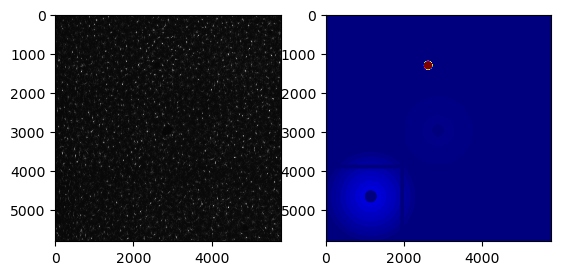

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20901068.0      252.316026     261.603454          1.000000
1       2    572146.0      222.743676     179.377622          0.882796
2       3    490956.0      249.327879     258.299337          0.988157
3       4    627839.0      248.404538     244.690409          0.984498
4       5    546760.0      242.020365     230.276983          0.959195
5       6    451728.0      237.605218     209.110612          0.941697
6       7    356616.0      254.293402     281.569351          1.007837
7       8    261616.0      248.360930     232.732026          0.984325
8       9    166552.0      273.065529     251.116667          1.082236
9      11    767516.0      233.940220     248.977707          0.927171
10     21    646948.0      232.043667     232.144001          0.919655
11     31    500152.0      247.964079     252.038385          0.982752
12     41    521892.0      220.270418     193.964206          0.872994
13    

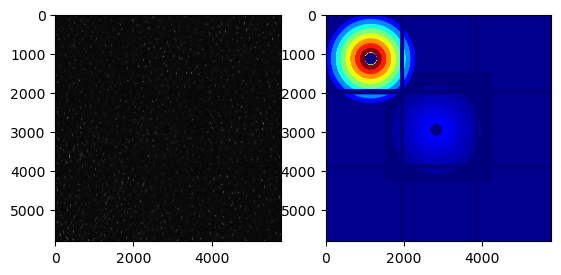

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20965531.0      190.396246     137.311313          1.000000
1       2    569938.0      178.748501     103.280427          0.938824
2       3    519532.0      178.881871     111.569467          0.939524
3       4    605219.0      181.025564     121.439408          0.950783
4       5    546760.0      190.174598     121.665589          0.998836
5       6    451728.0      185.598880     112.377781          0.974803
6       7    356616.0      194.528989     134.765535          1.021706
7       8    261616.0      183.173804      83.776811          0.962066
8       9    166552.0      210.788643     118.923395          1.107105
9      11    745986.0      181.995415     126.839070          0.955877
10     21    611780.0      177.174107     115.193394          0.930555
11     31    507146.0      184.803481     123.606604          0.970626
12     41    545001.0      191.110449     130.505917          1.003751
13    

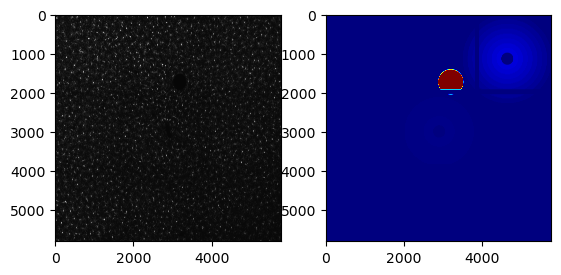

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20941290.0      305.764379     285.132552          1.000000
1       2    562216.0      279.280794     273.974320          0.913386
2       3    490321.0      288.087755     259.126899          0.942189
3       4    626053.0      284.418284     268.392065          0.930188
4       5    546760.0      295.919195     288.583992          0.967801
5       6    451728.0      280.116490     252.459474          0.916119
6       7    356616.0      297.358450     284.562645          0.972508
7       8    261616.0      293.530239     284.461764          0.959988
8       9    166552.0      254.511282     199.725414          0.832377
9      11    750061.0      305.335806     260.555615          0.998598
10     21    616412.0      314.344597     258.155702          1.028062
11     31    506514.0      319.275757     272.468215          1.044189
12     41    533407.0      325.990332     284.403136          1.066149
13    

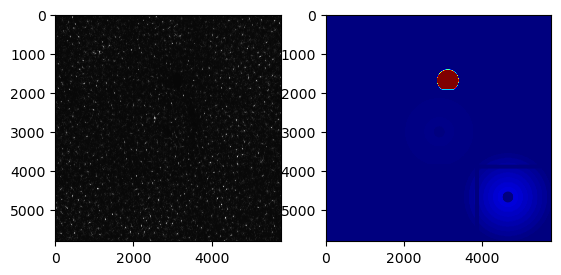

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20996404.0      225.887878     251.298415          1.000000
1       2    545826.0      207.423712     208.284699          0.918260
2       3    518040.0      205.005185     223.090130          0.907553
3       4    617261.0      193.846857     174.243797          0.858155
4       5    534352.0      204.135134     225.933810          0.903701
5       6    439360.0      212.368477     217.438824          0.940150
6       7    344288.0      232.186486     274.151196          1.027884
7       8    249216.0      210.642266     204.074723          0.932508
8       9    154168.0      211.000538     211.310092          0.934094
9      11    752081.0      226.852070     260.820380          1.004268
10     21    630896.0      221.964687     234.942639          0.982632
11     31    485236.0      237.244918     292.610103          1.050277
12     41    526082.0      214.844393     197.164562          0.951111
13    

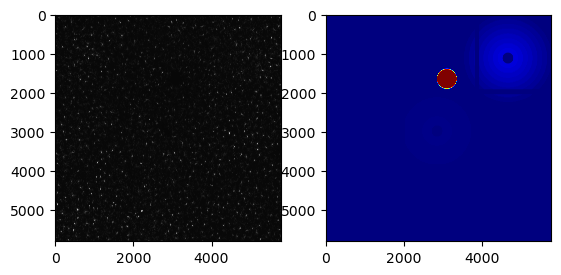

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21012323.0      198.443125     209.644197          1.000000
1       2    541638.0      179.270324     167.532724          0.903384
2       3    531056.0      184.741086     159.736264          0.930952
3       4    611494.0      189.018543     177.988920          0.952507
4       5    534352.0      183.397423     136.618163          0.924181
5       6    439360.0      201.946875     227.320218          1.017656
6       7    344288.0      181.829576     140.977466          0.916281
7       8    249216.0      190.573856     165.589048          0.960345
8       9    154168.0      182.004437     156.402264          0.917162
9      11    728798.0      196.949172     203.377855          0.992472
10     21    587900.0      199.537520     205.723162          1.005515
11     31    521727.0      204.635334     211.351192          1.031204
12     41    533308.0      209.497281     216.749331          1.055704
13    

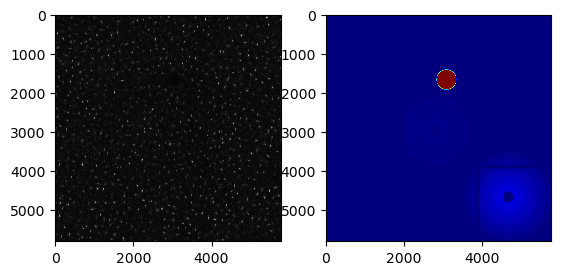

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21001445.0      235.545097     273.415476          1.000000
1       2    578226.0      218.852345     242.105775          0.929131
2       3    564486.0      226.596056     263.469301          0.962007
3       4    565632.0      211.191324     217.538088          0.896607
4       5    534352.0      222.583666     250.229184          0.944973
5       6    439360.0      233.845994     269.260231          0.992787
6       7    344288.0      233.483645     280.371845          0.991248
7       8    249216.0      242.454566     315.863921          1.029334
8       9    154168.0      220.456411     217.380147          0.935941
9      11    751927.0      219.893897     254.164069          0.933553
10     21    630702.0      249.098045     318.669330          1.057539
11     31    485477.0      232.484235     297.423226          0.987005
12     41    526301.0      249.846339     338.430248          1.060716
13    

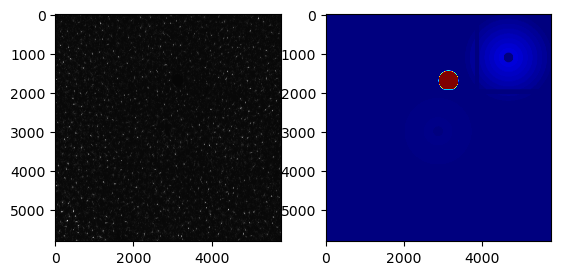

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21084602.0      209.596764     204.012829          1.000000
1       2    522394.0      198.687010     180.357356          0.947949
2       3    533446.0      195.715133     178.888046          0.933770
3       4    616998.0      195.485368     166.856254          0.932674
4       5    522808.0      194.422187     161.983821          0.927601
5       6    427784.0      206.122249     174.684818          0.983423
6       7    332672.0      209.208286     182.865246          0.998147
7       8    237656.0      201.919312     165.627026          0.963370
8       9    142568.0      200.372664     192.164819          0.955991
9      11    710264.0      186.781100     138.491141          0.891145
10     21    565486.0      197.078048     170.150847          0.940272
11     31    543677.0      198.735946     187.081961          0.948182
12     41    522808.0      203.277687     183.801544          0.969851
13    

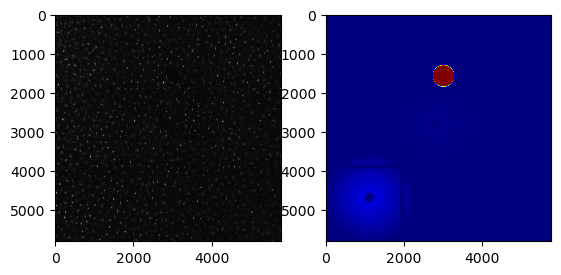

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21005241.0      216.644109     195.346788          1.000000
1       2    561794.0      207.024050     204.277970          0.955595
2       3    555684.0      204.646898     179.099933          0.944622
3       4    549091.0      209.668164     222.497056          0.967800
4       5    522808.0      206.218461     190.712008          0.951877
5       6    427784.0      214.026969     206.277541          0.987920
6       7    332672.0      193.242699     133.743798          0.891982
7       8    237656.0      201.323257     189.054610          0.929281
8       9    142568.0      219.585847     224.009405          1.013579
9      11    728558.0      233.686887     277.551794          1.078667
10     21    593382.0      219.661965     227.219000          1.013930
11     31    518878.0      207.336516     202.009079          0.957037
12     41    522808.0      216.680772     223.462165          1.000169
13    

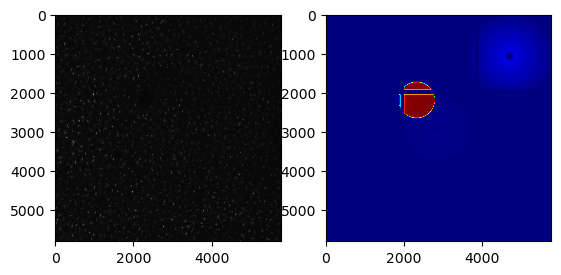

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21232626.0      195.218765     148.944388          1.000000
1       2    406425.0      185.142607     119.734662          0.948385
2       3    479463.0      189.270359     130.198910          0.969530
3       4    494630.0      194.959867     140.544765          0.998674
4       5    421387.0      197.925484     141.636853          1.013865
5       6    360824.0      190.075910     112.169899          0.973656
6       7    308357.0      191.207328     119.129766          0.979452
7       8    213616.0      197.035550     128.065857          1.009306
8       9    118624.0      206.245675     136.222403          1.056485
9      11    659539.0      170.723040      97.878981          0.874522
10     21    549757.0      177.497400     106.671998          0.909223
11     31    580045.0      175.594830      98.342121          0.899477
12     41    498824.0      181.535754      90.968727          0.929909
13    

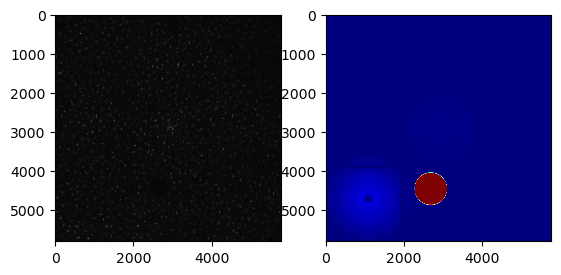

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20815214.0      182.905861     114.711252          1.000000
1       2    470897.0      193.037325     147.517322          1.055392
2       3    587282.0      185.587680     116.788680          1.014662
3       4    593928.0      189.474216     128.944154          1.035911
4       5    498824.0      193.875541     136.767521          1.059974
5       6    403808.0      189.804590     118.945493          1.037717
6       7    308756.0      217.179569     173.692926          1.187384
7       8    213616.0      210.606223     129.347048          1.151446
8       9    118624.0      237.311868     142.652546          1.297454
9      11    691230.0      200.882553     150.024716          1.098284
10     21    542226.0      195.238934     140.395404          1.067429
11     31    568938.0      189.125314     122.567711          1.034004
12     41    498824.0      189.043418     118.984965          1.033556
13    

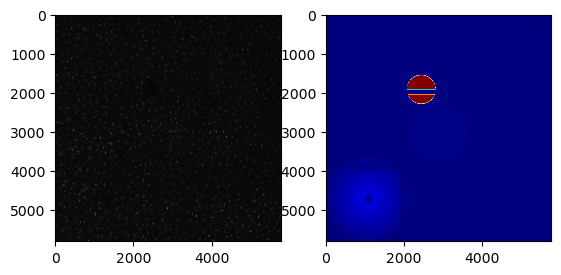

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  21218562.0      183.445287     116.116352          1.000000
1       2    444030.0      178.903160      94.870830          0.975240
2       3    522684.0      184.878837     116.476830          1.007815
3       4    577255.0      182.172951     104.280298          0.993064
4       5    498824.0      183.493543     109.099864          1.000263
5       6    403808.0      190.271889     120.749412          1.037213
6       7    308756.0      201.343828     135.705125          1.097569
7       8    213616.0      208.032933     139.610503          1.134033
8       9    118624.0      205.609034     133.536175          1.120819
9      11    691230.0      195.612699     128.621866          1.066327
10     21    542226.0      206.657091     151.043171          1.126533
11     31    568938.0      192.239012     121.719892          1.047937
12     41    498824.0      191.523501     107.716223          1.044036
13    

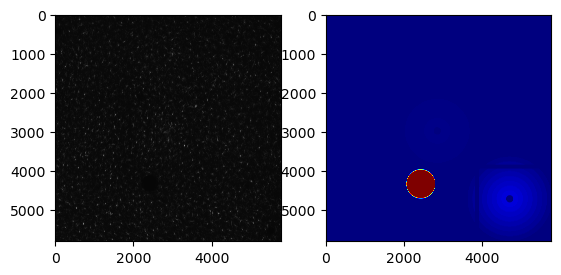

    label        area  intensity_mean  intensity_std  pooled norm mean
0       1  20979119.0      202.639422     136.601921          1.000000
1       2    494724.0      203.395809     151.641814          1.003733
2       3    571329.0      208.478273     147.690420          1.028814
3       4    593928.0      204.912575     133.267829          1.011218
4       5    498824.0      219.753639     170.784263          1.084457
5       6    403808.0      220.640349     161.609238          1.088832
6       7    308756.0      232.389369     179.804478          1.146812
7       8    213616.0      246.191194     188.311364          1.214923
8       9    118624.0      263.120886     167.050952          1.298468
9      11    696090.0      199.382524     131.609394          0.983928
10     21    541238.0      201.392908     141.052288          0.993849
11     31    557132.0      206.285575     149.500897          1.017993
12     41    498824.0      213.156233     166.935467          1.051899
13    

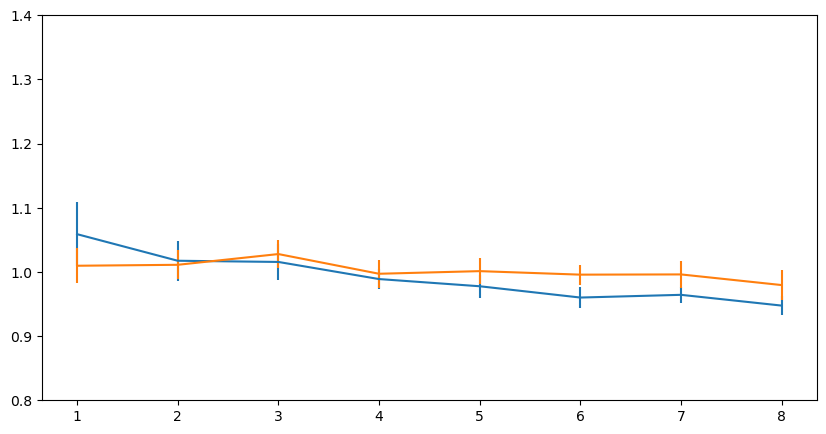

In [93]:
channel = "iba"
r=40
reach=320
num_regions=np.round(reach/r).astype(int)

iba_pooled_means, iba_allmeans = get_means(metadatadf, channel, r, reach)
electrode = np.flip(iba_pooled_means[:, 1:num_regions+1])
control = np.flip(iba_pooled_means[:, num_regions+1:])

plt.figure(figsize=(10,5))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(electrode, axis=0), np.std(electrode, axis=0)/np.sqrt(num_regions))
plt.errorbar(np.linspace(1,num_regions,num_regions), np.mean(control, axis=0), np.std(control, axis=0)/np.sqrt(num_regions))
plt.ylim([0.8,1.4])
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename="iba-electrode-r40-reach320.pdf"
plt.savefig(os.path.join(root, filename))

for i in range(num_regions):
    rvs1 = electrode[:,i]
    rvs2 = control[:,i]
    print(stats.ttest_ind(rvs1, rvs2, equal_var=False))

root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/FIGURE_5-STABILITY"
filename = channel+"-electrode-r40-reach320.npy"
np.save(os.path.join(root, filename), electrode)
filename = channel+"-control-r40-reach320.npy"
np.save(os.path.join(root, filename), control)

In [306]:
root="/Users/eminhanozil/Dropbox (Yanik Lab)/Localization Manuscript 2024/RAT DATA"
animal_id="rEO_08"
spot="s06_n3_20x_spot4"
workingdir=os.path.join(root, animal_id, "histology", spot)
filename="_rEO008_s06_n3_20x_spot4_iba-stack.tif"

data = imread(os.path.join(workingdir, filename))

In [307]:
ibaMaxProj=np.max(data[7:15,:,:], axis=0)
# gfapMaxProj8bit = (gfapMaxProj/256).astype('uint8')
# gfapMaxProj8bit = gfapMaxProj8bit/np.max(gfapMaxProj8bit)*255
ibaMaxProj = cv2.cvtColor(ibaMaxProj, cv2.COLOR_GRAY2RGB)
ibaMaxProj[:,:,0]=ibaMaxProj[:,:,0]*30
ibaMaxProj[:,:,1]=ibaMaxProj[:,:,1]*30
ibaMaxProj[:,:,2]=ibaMaxProj[:,:,2]


# electrodesMaxProj=np.max(nissl_data[1:4,:,:], axis=0)
# electrodesMaxProj8Bit = (electrodesMaxProj/256).astype('uint8')


# center=[2750, 2900]  #Center of bundle
# cx,cy = center
# r=200
# roi=skimage.morphology.disk(r)
# mask=np.zeros_like(electrodesMaxProjRGBA[:,:,0])
# mask[cx-r:cx+r+1, cy-r:cy+r+1]=roi
# electrodesMaxProj=electrodesMaxProj*mask
# electrodesMaxProj=electrodesMaxProj*(electrodesMaxProj>200)
# electrodesMaxProjRGBA = cv2.cvtColor(electrodesMaxProj, cv2.COLOR_GRAY2RGB)
# electrodesMaxProjRGBA[:,:,0]=electrodesMaxProjRGBA[:,:,0]
# electrodesMaxProjRGBA[:,:,1]=electrodesMaxProjRGBA[:,:,1]
# electrodesMaxProjRGBA[:,:,2]=electrodesMaxProjRGBA[:,:,2]*30

merged_iba_elec=electrodesMaxProjRGBA+ibaMaxProj
cv2.imwrite(os.path.join(workingdir, "iba_maxProj-merged.tiff"), merged_iba_elec)

True

In [310]:
#325nm/pixel
start=7
stop=15
roiscaler=np.round(50/0.325).astype(int)
x,y=np.shape(data[0,:,:])
center=[2750, 2900]  #Center of bundle
cx,cy = center

i=0
rbase=150
data_reshaped=np.moveaxis(data, 0, -1)
rprev=0
r=rbase
roiRef=250

vesselLocation=[1800, 2950]
vesselSize=200

mask=np.zeros_like(data_reshaped[:,:,0])
while cx+r<x and cy+r<y and cx-r>0 and cy-r>0: 
    roi=skimage.morphology.disk(r)
    roiprev=skimage.morphology.disk(rprev)
    
    mask[cx-r:cx+r+1, cy-r:cy+r+1]=mask[cx-r:cx+r+1, cy-r:cy+r+1]+roi

    i=i+1
    rprev=r
    r=rbase+roiscaler*i


mask=i+1-mask
reference=i+2
vessel=i+3
mask[:roiRef,:]=reference
mask[-roiRef:,:]=reference
mask[:,:roiRef]=reference
mask[:,-roiRef:]=reference


vesselMask=skimage.morphology.disk(vesselSize)*vessel
mask[vesselLocation[0]-vesselSize:vesselLocation[0]+vesselSize+1, vesselLocation[1]-vesselSize:vesselLocation[1]+vesselSize+1]=vesselMask


props=skimage.measure.regionprops_table(mask, data_reshaped[:,:,start:stop], properties=('label', 'area', 'intensity_mean', 'intensity_std'),)
df=pd.DataFrame(props)
mean_columns=[column for column in df.columns.values if "intensity_mean" in column]

df["pooled norm mean"]=(df[mean_columns]/df[mean_columns].loc[reference-1]).mean(axis=1)
df["pooled mean"]=df[mean_columns].mean(axis=1)
std_columns=[column for column in df.columns.values if "intensity_std" in column]
df["pooled std"]=((df[std_columns]**2).mean(axis=1))**0.5
df

,label,area,intensity_mean-0,intensity_mean-1,intensity_mean-2,intensity_mean-3,intensity_mean-4,intensity_mean-5,intensity_mean-6,intensity_mean-7,...,intensity_std-1,intensity_std-2,intensity_std-3,intensity_std-4,intensity_std-5,intensity_std-6,intensity_std-7,pooled norm mean,pooled mean,pooled std
0,1,70681.0,167.162476,157.962805,134.701405,131.619601,130.034578,127.936588,125.093052,121.870984,...,162.182332,58.401629,52.134268,46.859399,45.430243,34.620993,25.595394,0.773155,137.047686,94.788338
1,2,219592.0,212.004108,193.985441,172.786486,167.467950,158.840176,156.401709,155.816815,153.198623,...,196.370224,135.455617,128.859824,97.676385,97.464460,85.187808,83.798496,0.965996,171.312663,145.618615
2,3,368692.0,209.499764,191.540245,186.644807,173.927343,157.830127,150.583227,149.836240,148.048227,...,222.224191,192.753082,147.988511,102.279598,69.539873,89.521374,70.088759,0.963192,170.988747,171.299091
3,4,517668.0,188.075245,177.544567,172.759230,176.271697,162.981144,152.028283,147.852450,149.418535,...,171.637311,163.997704,182.193460,110.827505,83.663386,73.196507,69.970227,0.937329,165.866394,137.961787
4,5,663192.0,207.844057,190.774426,176.782392,166.454600,159.295406,153.880398,148.105080,144.315553,...,197.907681,176.433620,142.541765,110.625576,97.788340,71.922134,54.851370,0.949052,168.431489,153.322099
5,6,754345.0,188.373687,176.129671,167.856185,160.999739,151.903258,145.782175,145.615423,146.422919,...,152.250084,156.917229,137.532651,102.577116,75.135570,73.539583,69.497169,0.905601,160.385382,127.873585
6,7,902383.0,196.997216,177.543597,167.943034,162.932358,154.291837,148.955859,150.999246,150.944884,...,164.121427,142.840250,148.149086,115.454238,98.685708,94.312167,91.973924,0.925026,163.826004,143.830706
7,8,1079951.0,194.338104,182.885657,168.603697,162.154126,156.363287,150.171071,149.143168,150.331620,...,187.963927,134.951783,134.967894,116.602494,86.064321,81.966817,79.394036,0.927350,164.248841,138.685962
8,9,1262844.0,196.204217,180.976982,177.984160,165.014486,160.061149,156.341203,154.014917,151.988125,...,168.689073,194.973848,146.664941,113.006590,100.494478,98.655368,90.339315,0.948004,167.823155,149.213606
9,10,1411740.0,187.562495,181.260336,172.552685,166.736004,163.523674,156.273013,151.169987,152.354753,...,188.001486,154.241326,150.291172,137.117981,115.758234,82.681976,88.270283,0.940968,166.429118,140.926767


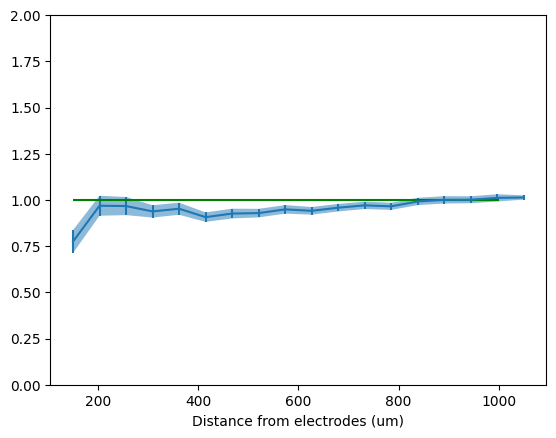

In [311]:
numRois=reference-1
dist=np.linspace(0,numRois*50, numRois)+rbase
# means=df[df["label"]<=numRois]["pooled mean"]/df[df["label"]==reference]["pooled mean"].values[0]
means=df[df["label"]<=numRois]["pooled mean"]/df[df["label"]==reference]["pooled mean"].values[0]
stds=df[df["label"]<=numRois]["pooled std"]/df[df["label"]==reference]["pooled mean"].values[0]
sem=stds.divide((df[df["label"]<=numRois]["area"]*(0.325**2)/100)**0.5)
# plt.plot(dist, means)
plt.errorbar(dist, means, sem)
plt.ylim(0,2)
plt.fill_between(dist, means-sem, means+sem, alpha=0.5)
plt.xlabel("Distance from electrodes (um)")
plt.hlines(1, 150, 1000, color='green')
plt.savefig(os.path.join(workingdir, "iba-intensity.pdf"), dpi=1000)
# plt.yticks(np.linspace(10,200,20))